# Simulation Experiments

In [1]:
RUN_MODEL = False

In [2]:
import sys
import time
import logging
import warnings
import scipy
import numpy as np
import pandas as pd
import pprint as pp
import gpboost as gpb
import tensorflow as tf
import tensorflow_probability as tfp
import bokeh.plotting as bop
import bokeh.models as bom
import statsmodels.api as sm
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import category_encoders as ce   # https://contrib.scikit-learn.org/category_encoders/
import xgboost as xgb

from tqdm import tqdm
from sklearn import set_config
from sklearn.linear_model import LinearRegression, GammaRegressor
from sklearn.utils import check_random_state
from sklearn.datasets import make_friedman1, make_friedman3
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, OrdinalEncoder
from sklearn.compose import make_column_transformer
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import KFold
from bokeh.io import output_notebook, export_svg
from bokeh.layouts import gridplot
from tensorflow.keras import models, layers, optimizers, metrics, losses
from tensorflow.random import set_seed
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from category_encoders.wrapper import NestedCVWrapper
from simulate import make_sim, generate_data
from lmmnn.nn import reg_nn_lmm, calc_b_hat
from glmmnet import DistParams, build_glmmnet, predict_glmmnet, build_baseline_nn

sys.path.append("../")
from utils import (
    split, set_tf_loglevel,
    evaluate_model, evaluate_predictions, 
    plot_from_model, plot_from_predictions, plot_loss_curves, 
    embedding_preproc,
    plot_ridgeline
)

In [3]:
# Package parameters
# Display of sklearn pipelines
set_config(display="diagram")

# Seaborn plotting style
custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_theme(style="white", rc=custom_params)

# Suppress tensorflow messages
set_tf_loglevel(logging.FATAL)

# Output bokeh plots to notebook
output_notebook()

# Shorthand for tfp.distributions
tfd = tfp.distributions

Loading BokehJS ...

### Experiment #1: Low Complexity, Gaussian response

In [4]:
# Configure simulation parameters
exp_id = 1                         # experiment id
n_train = 5000                     # number of training observations
n_test = 2500                      # number of test observations
n = n_train + n_test               # total number of observations
n_categories = 100                 # number of categories for the categorical variable
f_structure = "friedman1"          # structure of the fixed effects f(X)
sig2noise = np.array([4, 1, 1])    # relative signal-to-noise of the fixed effects, random effects and irreducible error
y_dist = "gaussian"                # distribution of the response variable y
inverse_link = lambda x: x         # inverse of the identity link
cat_dist = "balanced"              # distribution of the categorical variable
random_seed = 42                   # random seed for reproducibility
log_plot = False                   # whether to plot the log transformed response and predictions
nn_loss = "mse"                    # loss function for the neural network

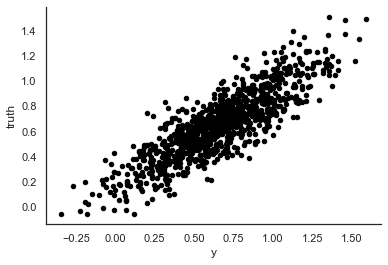

In [5]:
# Generate data
# Generate the fixed effects features X and f(X)
# Doc: https://scikit-learn.org/stable/modules/generated/sklearn.datasets.make_friedman1.html
if (f_structure == "friedman1"):
    # Out of the n_features features, only 5 are actually used to compute y.
    # The remaining features are independent of y.
    X, f_X = make_friedman1(n_samples=n, n_features=10, noise=0.0, random_state=random_seed)
elif (f_structure == "friedman3"):
    X, f_X = make_friedman3(n_samples=n, noise=0.0, random_state=random_seed)

# Simulate random effects and therefore the response variable y
X, y, truth, Zu = make_sim(X, f_X, n_categories, sig2noise, y_dist, inverse_link, cat_dist, random_seed)

# Plot y truth (i.e. the conditional mean) against y observed
# The smaller the noise component, the closer the points follow a straight line
_ = pd.DataFrame({"y": y[:1000], "truth": truth[:1000]}).plot.scatter(x="y", y="truth", color="black")

In [6]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = split(X, y, n_train)

# Conditional mean true values (unobservable in practice)
y_true_train = truth[:n_train]
y_true_test = truth[n_train:]

In [7]:
X_train.shape, X_test.shape

((5000, 11), (2500, 11))

In [8]:
# Combine X, y, and truth into a dataframe and save to files
train_data = pd.concat([
    X_train.reset_index(drop=True), 
    pd.DataFrame(y_train, columns=["y"]), 
    pd.DataFrame(y_true_train, columns=["y_true"])], axis=1)
test_data = pd.concat([
    X_test.reset_index(drop=True),
    pd.DataFrame(y_test, columns=["y"]),
    pd.DataFrame(y_true_test, columns=["y_true"])], axis=1)

path = f"data/experiment_{exp_id}"
train_data.to_csv(f"{path}/train_data.csv", index=False)
test_data.to_csv(f"{path}/test_data.csv", index=False)

In [9]:
# Print summary statistics of the data
hicard_var = "category"
x_num = [col for col in X.columns if col not in hicard_var]
X[x_num].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
X1,7500.0,0.497615,0.288852,0.000125,0.248998,0.496073,0.749031,0.999805
X2,7500.0,0.494521,0.288870,0.000017,0.241848,0.494511,0.742734,0.999789
X3,7500.0,0.501841,0.287485,0.000012,0.251606,0.501669,0.749772,0.999957
X4,7500.0,0.499331,0.288483,0.000008,0.249689,0.500278,0.748632,0.999901
X5,7500.0,0.500825,0.288590,0.000135,0.252035,0.502506,0.753344,0.999841
X6,7500.0,0.506034,0.289164,0.000047,0.258761,0.505642,0.761703,0.999875
X7,7500.0,0.501282,0.285492,0.000006,0.254993,0.501586,0.744931,0.999972
X8,7500.0,0.496218,0.288666,0.000053,0.248826,0.494834,0.748937,0.999824
X9,7500.0,0.501712,0.287811,0.000110,0.251896,0.502645,0.750863,0.999925
X10,7500.0,0.498679,0.287630,0.000270,0.249869,0.498534,0.746239,0.999786


In [10]:
pd.DataFrame(y).describe().transpose()

,count,mean,std,min,25%,50%,75%,max
0,7500.0,0.657592,0.323488,-0.518781,0.434136,0.658003,0.881773,1.746482


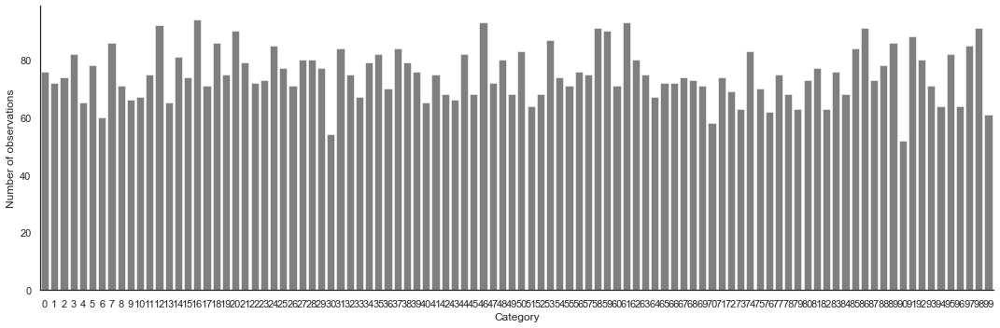

In [11]:
cat_count = X[hicard_var].value_counts()
fig = plt.figure(figsize=(15, 5))
_ = sns.barplot(x=cat_count.index, y=cat_count.values, color="black", alpha=0.5)
plt.ylabel("Number of observations")
plt.xlabel("Category")
plt.tight_layout()

#### GLM

In [12]:
ignore_cat_encoder = make_column_transformer(
    ("drop", [hicard_var]),
    (MinMaxScaler(feature_range=(0, 1)), x_num), # not required for GLMs, applied here for consistency
)
GLM_ignore_cat = make_pipeline(ignore_cat_encoder, LinearRegression())
# Apply the pipeline to the dataframe for prediction
GLM_ignore_cat.fit(X_train, y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('drop', 'drop', ['category']),
                                                 ('minmaxscaler',
                                                  MinMaxScaler(),
                                                  ['X1', 'X2', 'X3', 'X4', 'X5',
                                                   'X6', 'X7', 'X8', 'X9',
                                                   'X10'])])),
                ('linearregression', LinearRegression())])

In [13]:
train_scores = dict()
test_scores = dict()

print("> In-sample performance")
train_scores["GLM_ignore_cat"] = evaluate_model(GLM_ignore_cat, X_train, y_train, categories=X_train[hicard_var], likelihood=y_dist)
pp.pprint(train_scores["GLM_ignore_cat"])

print("-" * 80)
print("> Out-of-sample performance")
test_scores["GLM_ignore_cat"] = evaluate_model(GLM_ignore_cat, X_test, y_test, categories=X_test[hicard_var], likelihood=y_dist)
pp.pprint(test_scores["GLM_ignore_cat"])

> In-sample performance
{'CRPS': 0.14310900069846105,
 'MAE': 0.20262877204739305,
 'MedAE': 0.16936067787763598,
 'MedPE': 0.24174006647096186,
 'R2': 0.3799743159135275,
 'RMSE': 0.2540905882539191,
 'RMSE_avg': 0.15385731178238027,
 'RMSE_avg_weighted': 0.15326304978025115}
--------------------------------------------------------------------------------
> Out-of-sample performance
{'CRPS': 0.14272557899715393,
 'MAE': 0.2016853331178287,
 'MedAE': 0.1677761073170412,
 'MedPE': 0.24126061659871767,
 'R2': 0.3931008214973465,
 'RMSE': 0.25307009022743493,
 'RMSE_avg': 0.16212135260176963,
 'RMSE_avg_weighted': 0.16319322865230174}


Observe that errors are quite large w.r.t. the distribution of the response variable. The model does not appear to overfit.

In [14]:
p = plot_from_model(GLM_ignore_cat, X_train, y_true_train, X_test, y_true_test, log_scale=log_plot)

In [15]:
one_hot_encoder = make_column_transformer(
    (OneHotEncoder(handle_unknown="ignore", drop="first"), [hicard_var]),
    (MinMaxScaler(feature_range=(0, 1)), x_num), # not required for GLMs, applied here for consistency
)
GLM_one_hot = make_pipeline(one_hot_encoder, LinearRegression())
GLM_one_hot.fit(X_train, y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('onehotencoder',
                                                  OneHotEncoder(drop='first',
                                                                handle_unknown='ignore'),
                                                  ['category']),
                                                 ('minmaxscaler',
                                                  MinMaxScaler(),
                                                  ['X1', 'X2', 'X3', 'X4', 'X5',
                                                   'X6', 'X7', 'X8', 'X9',
                                                   'X10'])])),
                ('linearregression', LinearRegression())])

In [16]:
print("> In-sample performance")
train_scores["GLM_one_hot"] = evaluate_model(GLM_one_hot, X_train, y_train, categories=X_train[hicard_var], likelihood=y_dist)
pp.pprint(train_scores["GLM_one_hot"])

print("-" * 80)
print("> Out-of-sample performance")
test_scores["GLM_one_hot"] = evaluate_model(GLM_one_hot, X_test, y_test, categories=X_test[hicard_var], likelihood=y_dist)
pp.pprint(test_scores["GLM_one_hot"])

> In-sample performance
{'CRPS': 0.11416816856294194,
 'MAE': 0.16139807514282584,
 'MedAE': 0.13662306707797053,
 'MedPE': 0.19826416493588334,
 'R2': 0.6059010121589711,
 'RMSE': 0.20257525689624756,
 'RMSE_avg': 9.937147130028223e-07,
 'RMSE_avg_weighted': 9.332011506174265e-07}
--------------------------------------------------------------------------------
> Out-of-sample performance
{'CRPS': 0.1123245565498542,
 'MAE': 0.15872510471813694,
 'MedAE': 0.13316205724681376,
 'MedPE': 0.1901643331680208,
 'R2': 0.6217438438442859,
 'RMSE': 0.19979082838036155,
 'RMSE_avg': 0.050725327017840674,
 'RMSE_avg_weighted': 0.04982970432760635}


In [17]:
p = plot_from_model(GLM_one_hot, X_train, y_true_train, X_test, y_true_test, log_scale=log_plot)

In [18]:
# Apply a cross-validated version of GLMM encoding
# Docs: https://contrib.scikit-learn.org/category_encoders/
GLMM_encoder = make_column_transformer(
    # https://contrib.scikit-learn.org/category_encoders/wrapper.html
    (NestedCVWrapper(ce.glmm.GLMMEncoder(), cv=KFold(n_splits=5)), [hicard_var]),
    (MinMaxScaler(feature_range=(0, 1)), x_num), # not required for GLMs, applied here for consistency
)
GLM_GLMM_enc = make_pipeline(GLMM_encoder, LinearRegression())
GLM_GLMM_enc.fit(X_train, y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('nestedcvwrapper',
                                                  NestedCVWrapper(cv=KFold(n_splits=5, random_state=None, shuffle=False),
                                                                  feature_encoder=GLMMEncoder()),
                                                  ['category']),
                                                 ('minmaxscaler',
                                                  MinMaxScaler(),
                                                  ['X1', 'X2', 'X3', 'X4', 'X5',
                                                   'X6', 'X7', 'X8', 'X9',
                                                   'X10'])])),
                ('linearregression', LinearRegression())])

In [19]:
# Check how the GLMMencoder works
# Docs: https://contrib.scikit-learn.org/category_encoders/_modules/category_encoders/wrapper.html#NestedCVWrapper.transform
# https://contrib.scikit-learn.org/category_encoders/_modules/category_encoders/glmm.html#GLMMEncoder
GLMM_encodings = pd.DataFrame({
    "category": X_train[hicard_var].values,
    "encoding": NestedCVWrapper(ce.GLMMEncoder(), cv=KFold(n_splits=5)).fit_transform(X_train["category"], y_train).values.ravel(),
})
GLMM_encodings

,category,encoding
0,51,0.340667
1,92,-0.002120
2,14,0.234305
3,71,-0.032545
4,60,-0.132732
...,...,...
4995,48,-0.150653
4996,57,0.058180
4997,38,-0.122347
4998,79,-0.027919


In [20]:
# Different values for different folds (on the training set)
GLMM_encodings[GLMM_encodings["category"] == 51].value_counts()

category  encoding
51        0.265839    12
          0.340667    12
          0.316554     7
          0.273471     6
          0.280705     5
dtype: int64

In [21]:
# Plot GLMM encodings vs true random effects
p = bop.figure(title="Random Effects Predictions", x_axis_label="Ground truth", y_axis_label="Encodings", width=400, height=400)
p.add_layout(bom.Title(text="Model: GLMM encodings", text_font_style="italic"), "above")
GLMM_encodings = GLMM_encoder.named_transformers_["nestedcvwrapper"].transform(X_train[hicard_var])
p.circle(Zu[:n_train], GLMM_encodings.values.ravel(), color="#9f86c0")
p.add_layout(bom.Slope(gradient=1, y_intercept=0, line_color="black", line_width=2))
bop.show(p)

The linear shape of the plot above suggests that the GLMM encodings were able to capture the random effects very well - as one would expect given that the random effects signal is reasonably strong.

In [22]:
print("> In-sample performance")
train_scores["GLM_GLMM_enc"] = evaluate_model(GLM_GLMM_enc, X_train, y_train, categories=X_train[hicard_var], likelihood=y_dist)
pp.pprint(train_scores["GLM_GLMM_enc"])

print("-" * 80)
print("> Out-of-sample performance")
test_scores["GLM_GLMM_enc"] = evaluate_model(GLM_GLMM_enc, X_test, y_test, categories=X_test[hicard_var], likelihood=y_dist)
pp.pprint(test_scores["GLM_GLMM_enc"])

> In-sample performance
{'CRPS': 0.11534203442830271,
 'MAE': 0.1633558920515475,
 'MedAE': 0.13756463694523974,
 'MedPE': 0.201515837825817,
 'R2': 0.5974482641242197,
 'RMSE': 0.20473617744099532,
 'RMSE_avg': 0.030397940842192234,
 'RMSE_avg_weighted': 0.02962025935107252}
--------------------------------------------------------------------------------
> Out-of-sample performance
{'CRPS': 0.11397651502660888,
 'MAE': 0.161099899041167,
 'MedAE': 0.13783489081702643,
 'MedPE': 0.19518101079580505,
 'R2': 0.6115265243757837,
 'RMSE': 0.20247118781780296,
 'RMSE_avg': 0.06045183469225832,
 'RMSE_avg_weighted': 0.05976245049744218}


In [23]:
p = plot_from_model(GLM_GLMM_enc, X_train, y_true_train, X_test, y_true_test, log_scale=log_plot)

We don't observe much improvement over the one-hot encoded model, most likely due to the restrictive structure of GLM in modelling the highly nonlinear relationship in `friedman1` data.

#### GBM

In [24]:
GBM = xgb.XGBRegressor(n_jobs=-1, learning_rate=0.1, max_depth=2, random_state=random_seed)
GBM_ignore_cat = make_pipeline(ignore_cat_encoder, GBM)
GBM_ignore_cat.fit(X_train, y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('drop', 'drop', ['category']),
                                                 ('minmaxscaler',
                                                  MinMaxScaler(),
                                                  ['X1', 'X2', 'X3', 'X4', 'X5',
                                                   'X6', 'X7', 'X8', 'X9',
                                                   'X10'])])),
                ('xgbregressor',
                 XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
                              colsample_bylevel=1, colsample_bynode=1,
                              colsample_bytree=1, early_stopping_rounds=None,
                              ena...
                              gamma=0, gpu_id=-1, grow_policy='depthwise',
                              importance_type=None, interaction_constraints='',
                              learning_rate=0.1, max_bin=256,
                              max_cat_to_onehot=4, max_delta_step=0,
                              max_depth=2, max_leaves=0, min_child_weight=1,
                              missing=nan, monotone_constraints='()',
                              n_estimators=100, n_jobs=-1, num_parallel_tree=1,
                              predictor='auto', random_state=42, reg_alpha=0,
                              reg_lambda=1, ...))])

In [25]:
print("> In-sample performance")
train_scores["GBM_ignore_cat"] = evaluate_model(GBM_ignore_cat, X_train, y_train, categories=X_train[hicard_var], likelihood=y_dist)
pp.pprint(train_scores["GBM_ignore_cat"])

print("-" * 80)
print("> Out-of-sample performance")
test_scores["GBM_ignore_cat"] = evaluate_model(GBM_ignore_cat, X_test, y_test, categories=X_test[hicard_var], likelihood=y_dist)
pp.pprint(test_scores["GBM_ignore_cat"])

> In-sample performance
{'CRPS': 0.1281124350846384,
 'MAE': 0.18075567940160472,
 'MedAE': 0.15133750876617064,
 'MedPE': 0.21501249750919713,
 'R2': 0.5021198550405592,
 'RMSE': 0.22769114562822929,
 'RMSE_avg': 0.148274240164422,
 'RMSE_avg_weighted': 0.14779537393633335}
--------------------------------------------------------------------------------
> Out-of-sample performance
{'CRPS': 0.13243269293283091,
 'MAE': 0.18759429956744747,
 'MedAE': 0.15912884162957902,
 'MedPE': 0.2242994334501887,
 'R2': 0.4790962883487093,
 'RMSE': 0.23445595669197514,
 'RMSE_avg': 0.16034502481725862,
 'RMSE_avg_weighted': 0.1609900727892125}


Again, errors are quite large w.r.t. the distribution of the response variable.

In order to prevent overfitting, the default hyperparameters have been (manually) adjusted such that the training and validation results are comparable. No extensive/systematic hyperparameter search has been performed.

In [26]:
p = plot_from_model(GBM_ignore_cat, X_train, y_true_train, X_test, y_true_test, log_scale=log_plot)

In [27]:
GBM_one_hot = make_pipeline(one_hot_encoder, GBM)
GBM_one_hot.fit(X_train, y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('onehotencoder',
                                                  OneHotEncoder(drop='first',
                                                                handle_unknown='ignore'),
                                                  ['category']),
                                                 ('minmaxscaler',
                                                  MinMaxScaler(),
                                                  ['X1', 'X2', 'X3', 'X4', 'X5',
                                                   'X6', 'X7', 'X8', 'X9',
                                                   'X10'])])),
                ('xgbregressor',
                 XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
                              colsample_bylevel=1, colsample_byno...
                              gamma=0, gpu_id=-1, grow_policy='depthwise',
                              importance_type=None, interaction_constraints='',
                              learning_rate=0.1, max_bin=256,
                              max_cat_to_onehot=4, max_delta_step=0,
                              max_depth=2, max_leaves=0, min_child_weight=1,
                              missing=nan, monotone_constraints='()',
                              n_estimators=100, n_jobs=-1, num_parallel_tree=1,
                              predictor='auto', random_state=42, reg_alpha=0,
                              reg_lambda=1, ...))])

In [28]:
print("> In-sample performance")
train_scores["GBM_one_hot"] = evaluate_model(GBM_one_hot, X_train, y_train, categories=X_train[hicard_var], likelihood=y_dist)
pp.pprint(train_scores["GBM_one_hot"])

print("-" * 80)
print("> Out-of-sample performance")
test_scores["GBM_one_hot"] = evaluate_model(GBM_one_hot, X_test, y_test, categories=X_test[hicard_var], likelihood=y_dist)
pp.pprint(test_scores["GBM_one_hot"])

> In-sample performance
{'CRPS': 0.12065506502236965,
 'MAE': 0.17100201169366364,
 'MedAE': 0.14314922729304175,
 'MedPE': 0.2031975439357439,
 'R2': 0.5613953664588784,
 'RMSE': 0.21370778659502337,
 'RMSE_avg': 0.11617693861093174,
 'RMSE_avg_weighted': 0.1145791590987619}
--------------------------------------------------------------------------------
> Out-of-sample performance
{'CRPS': 0.12491198511560449,
 'MAE': 0.17786349042267252,
 'MedAE': 0.15320779735139545,
 'MedPE': 0.21709161123367943,
 'R2': 0.539808130118387,
 'RMSE': 0.22036976879361492,
 'RMSE_avg': 0.129886008722333,
 'RMSE_avg_weighted': 0.13091323292442444}


In [29]:
p = plot_from_model(GBM_one_hot, X_train, y_true_train, X_test, y_true_test, log_scale=log_plot)

In [30]:
# Apply a cross-validated version of GLMM encoding
GBM_GLMM_enc = make_pipeline(GLMM_encoder, GBM)
GBM_GLMM_enc.fit(X_train, y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('nestedcvwrapper',
                                                  NestedCVWrapper(cv=KFold(n_splits=5, random_state=None, shuffle=False),
                                                                  feature_encoder=GLMMEncoder()),
                                                  ['category']),
                                                 ('minmaxscaler',
                                                  MinMaxScaler(),
                                                  ['X1', 'X2', 'X3', 'X4', 'X5',
                                                   'X6', 'X7', 'X8', 'X9',
                                                   'X10'])])),
                ('xgbregressor',
                 XGBRegressor(base_score=0.5, booster='gbtree'...
                              gamma=0, gpu_id=-1, grow_policy='depthwise',
                              importance_type=None, interaction_constraints='',
                              learning_rate=0.1, max_bin=256,
                              max_cat_to_onehot=4, max_delta_step=0,
                              max_depth=2, max_leaves=0, min_child_weight=1,
                              missing=nan, monotone_constraints='()',
                              n_estimators=100, n_jobs=-1, num_parallel_tree=1,
                              predictor='auto', random_state=42, reg_alpha=0,
                              reg_lambda=1, ...))])

In [31]:
print("> In-sample performance")
train_scores["GBM_GLMM_enc"] = evaluate_model(GBM_GLMM_enc, X_train, y_train, categories=X_train[hicard_var], likelihood=y_dist)
pp.pprint(train_scores["GBM_GLMM_enc"])

print("-" * 80)
print("> Out-of-sample performance")
test_scores["GBM_GLMM_enc"] = evaluate_model(GBM_GLMM_enc, X_test, y_test, categories=X_test[hicard_var], likelihood=y_dist)
pp.pprint(test_scores["GBM_GLMM_enc"])

> In-sample performance
{'CRPS': 0.09979870388519771,
 'MAE': 0.14124056067854698,
 'MedAE': 0.11830239524650843,
 'MedPE': 0.1704138480999885,
 'R2': 0.6982804311876434,
 'RMSE': 0.17724968734391958,
 'RMSE_avg': 0.03401761319913957,
 'RMSE_avg_weighted': 0.03375052499121346}
--------------------------------------------------------------------------------
> Out-of-sample performance
{'CRPS': 0.10231475798287837,
 'MAE': 0.14523208102136898,
 'MedAE': 0.12317272986804373,
 'MedPE': 0.17640773873178198,
 'R2': 0.6878949120204665,
 'RMSE': 0.18148175459097324,
 'RMSE_avg': 0.058676416751631474,
 'RMSE_avg_weighted': 0.059086801016106}


In [32]:
p = plot_from_model(GBM_GLMM_enc, X_train, y_true_train, X_test, y_true_test, log_scale=log_plot)

In [33]:
pd.DataFrame(test_scores).transpose()

,MAE,MedAE,MedPE,RMSE,R2,RMSE_avg,RMSE_avg_weighted,CRPS
GLM_ignore_cat,0.201685,0.167776,0.241261,0.253070,0.393101,0.162121,0.163193,0.142726
GLM_one_hot,0.158725,0.133162,0.190164,0.199791,0.621744,0.050725,0.049830,0.112325
GLM_GLMM_enc,0.161100,0.137835,0.195181,0.202471,0.611527,0.060452,0.059762,0.113977
GBM_ignore_cat,0.187594,0.159129,0.224299,0.234456,0.479096,0.160345,0.160990,0.132433
GBM_one_hot,0.177863,0.153208,0.217092,0.220370,0.539808,0.129886,0.130913,0.124912
GBM_GLMM_enc,0.145232,0.123173,0.176408,0.181482,0.687895,0.058676,0.059087,0.102315


The high validation error with `GBM_one_hot` is likely due to the model overfitting to the large number of categories. Trees are known to be tricked by such variables.

The flatter shape (compared to the 45 degree line) in the predictions vs truth plot for GBM with GLMM encoding for both training and validation shows that the encoding does not cause much overfitting. The flatter shape means that there is still the effect of cross-subsidisation between the categories.

#### NN with Entity Embeddings

In [34]:
# Preprocess the data
ct_nn = make_column_transformer(
    (ce.ordinal.OrdinalEncoder(handle_unknown="value"), [hicard_var]), # "value" encodes unknown categories as "-1"
    (MinMaxScaler(feature_range=(0, 1)), x_num),
)
X_train_ct = ct_nn.fit_transform(X_train)
X_test_ct = ct_nn.transform(X_test)

# Convert to dataframes
colnames = [hicard_var] + x_num
X_train_ct = pd.DataFrame(X_train_ct, columns=colnames)
X_test_ct = pd.DataFrame(X_test_ct, columns=colnames)

# Convert dataframe to lists to feed into Keras model
X_embed_train, X_embed_test = embedding_preproc(X_train_ct, X_test_ct, [hicard_var])

[category] cardinality: 100 and embedding dim: 3
Metal device set to: Apple M1 Pro

systemMemory: 16.00 GB
maxCacheSize: 5.33 GB



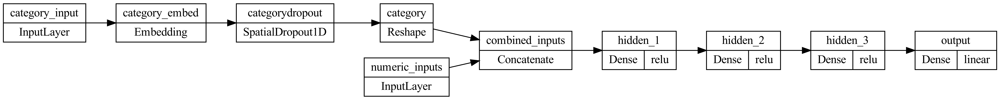

In [35]:
NN_ee = build_baseline_nn(X_train_ct, print_embeddings=True, random_state=random_seed, cat_vars=[hicard_var], num_vars=x_num)
plot_model(NN_ee, dpi=600, show_layer_activations=True, rankdir="LR")

In [36]:
NN_ee.count_params()

3821

In [37]:
n_runs = 10

# Define training parameters
epochs = 500
patience = 10
batch_size = 256
es = EarlyStopping(patience=patience, restore_best_weights=True, monitor="val_loss", verbose=2)

if RUN_MODEL:
    for run in tqdm(range(n_runs)):
        NN_ee = build_baseline_nn(X_train_ct, print_embeddings=False, random_state=random_seed)
        hist = NN_ee.fit(
            (tuple(X_embed_train), X_train_ct[x_num]), y_train, validation_split=0.2, 
            epochs=epochs, callbacks=[es], batch_size=batch_size, verbose=0)
        hist = hist.history
        # Save model and history
        NN_ee.save(f"models/experiment_{exp_id}/NN_ee_{run}.h5")
        np.save(f"models/experiment_{exp_id}/NN_ee_{run}_hist.npy", hist)

In [38]:
# Load saved models
NN_ee_models = []
NN_ee_train_scores = []
NN_ee_test_scores = []
for run in range(n_runs):
    NN_ee = models.load_model(f"models/experiment_{exp_id}/NN_ee_{run}.h5")
    y_pred_train = NN_ee.predict((tuple(X_embed_train), X_train_ct[x_num])).flatten()
    y_pred_test = NN_ee.predict((tuple(X_embed_test), X_test_ct[x_num])).flatten()
    train_score = evaluate_predictions(y_train, y_pred_train, categories=X_train[hicard_var], likelihood=y_dist)
    test_score = evaluate_predictions(y_test, y_pred_test, categories=X_test[hicard_var], likelihood=y_dist)
    
    NN_ee_models.append(NN_ee)
    NN_ee_train_scores.append(train_score)
    NN_ee_test_scores.append(test_score)

  1/157 [..............................] - ETA: 29s

2022-11-03 12:05:45.971569: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


79/79 [==============================] - 0s 2ms/step


In [39]:
# Average the scores
train_scores["NN_ee"] = dict(pd.DataFrame(NN_ee_train_scores).mean())
test_scores["NN_ee"] = dict(pd.DataFrame(NN_ee_test_scores).mean())

In [40]:
print("> In-sample performance")
pp.pprint(train_scores["NN_ee"])
print("-" * 80)
print("> Out-of-sample performance")
pp.pprint(test_scores["NN_ee"])

> In-sample performance
{'CRPS': 0.09621038257297387,
 'MAE': 0.13544293070569197,
 'MedAE': 0.11307047268753749,
 'MedPE': 0.16570098811063613,
 'R2': 0.7193107341564207,
 'RMSE': 0.17094725602354668,
 'RMSE_avg': 0.03428424321622166,
 'RMSE_avg_weighted': 0.033544536944055875}
--------------------------------------------------------------------------------
> Out-of-sample performance
{'CRPS': 0.10132022410864772,
 'MAE': 0.1429993649913884,
 'MedAE': 0.12038888451028609,
 'MedPE': 0.17526375003527814,
 'R2': 0.6928744945562985,
 'RMSE': 0.18002141120196025,
 'RMSE_avg': 0.05711041833718124,
 'RMSE_avg_weighted': 0.054830946317865795}


In [41]:
p = plot_from_predictions(
    y_pred_train=y_pred_train,
    y_train=y_true_train,
    y_pred_test=y_pred_test,
    y_test=y_true_test,
    log_scale=log_plot,
)

In [42]:
# Extract embeddings from the fitted neural network model
embeddings = NN_ee.get_layer(f"{hicard_var}_embed").get_weights()[0]
embeddings = pd.DataFrame(embeddings, columns=["embedding_" + str(i) for i in range(embeddings.shape[1])])
oe = ct_nn.named_transformers_["ordinalencoder"]
categories = np.array(oe.category_mapping[0]["mapping"])[:-1]
embeddings = pd.concat([pd.DataFrame(categories, columns=[hicard_var]), embeddings], axis=1)
embeddings

,category,embedding_0,embedding_1,embedding_2
0,1,-0.035191,-0.046968,0.013972
1,2,0.214817,-0.092599,-0.116322
2,3,-0.018121,-0.039443,-0.017386
3,4,0.130001,-0.132101,-0.106364
4,5,0.053573,0.009556,0.017114
...,...,...,...,...
95,96,-0.093428,0.008742,0.068220
96,97,0.018989,-0.026292,0.034546
97,98,0.063450,-0.068197,-0.118907
98,99,0.023066,0.006617,0.022023


#### GBM with Entity Embeddings

In [43]:
X_train_ee = pd.merge(X_train_ct, embeddings, on="category", how="left").drop("category", axis=1)
X_test_ee = pd.merge(X_test_ct, embeddings, on="category", how="left").drop("category", axis=1)

In [44]:
GBM_ee = xgb.XGBRegressor(n_jobs=-1, learning_rate=0.1, max_depth=2, random_state=random_seed)
GBM_ee.fit(X_train_ee, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.1, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=2, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=100,
             n_jobs=-1, num_parallel_tree=1, predictor='auto', random_state=42,
             reg_alpha=0, reg_lambda=1, ...)

In [45]:
print("> In-sample performance")
train_scores["GBM_ee"] = evaluate_model(GBM_ee, X_train_ee, y_train, categories=X_train[hicard_var], likelihood=y_dist)
pp.pprint(train_scores["GBM_ee"])

print("-" * 80)
print("> Out-of-sample performance")
test_scores["GBM_ee"] = evaluate_model(GBM_ee, X_test_ee, y_test, categories=X_test[hicard_var], likelihood=y_dist)
pp.pprint(test_scores["GBM_ee"])

> In-sample performance
{'CRPS': 0.11889800851984944,
 'MAE': 0.1683694626515984,
 'MedAE': 0.14222798418773913,
 'MedPE': 0.1992538334184015,
 'R2': 0.5733674610149908,
 'RMSE': 0.21077093711459197,
 'RMSE_avg': 0.11447776987317092,
 'RMSE_avg_weighted': 0.1144463564818799}
--------------------------------------------------------------------------------
> Out-of-sample performance
{'CRPS': 0.12238628519241658,
 'MAE': 0.17391301644486956,
 'MedAE': 0.14723381767269228,
 'MedPE': 0.21112851946876746,
 'R2': 0.5574638073412048,
 'RMSE': 0.21610108264383512,
 'RMSE_avg': 0.12727413755966516,
 'RMSE_avg_weighted': 0.1286171018682}


In [46]:
p = plot_from_model(GBM_ee, X_train_ee, y_true_train, X_test_ee, y_true_test, log_scale=log_plot)

In [47]:
pd.DataFrame(test_scores).transpose()

,MAE,MedAE,MedPE,RMSE,R2,RMSE_avg,RMSE_avg_weighted,CRPS
GLM_ignore_cat,0.201685,0.167776,0.241261,0.253070,0.393101,0.162121,0.163193,0.142726
GLM_one_hot,0.158725,0.133162,0.190164,0.199791,0.621744,0.050725,0.049830,0.112325
GLM_GLMM_enc,0.161100,0.137835,0.195181,0.202471,0.611527,0.060452,0.059762,0.113977
GBM_ignore_cat,0.187594,0.159129,0.224299,0.234456,0.479096,0.160345,0.160990,0.132433
GBM_one_hot,0.177863,0.153208,0.217092,0.220370,0.539808,0.129886,0.130913,0.124912
GBM_GLMM_enc,0.145232,0.123173,0.176408,0.181482,0.687895,0.058676,0.059087,0.102315
NN_ee,0.142999,0.120389,0.175264,0.180021,0.692874,0.057110,0.054831,0.101320
GBM_ee,0.173913,0.147234,0.211129,0.216101,0.557464,0.127274,0.128617,0.122386


#### (Generalised) Linear Mixed Effects Models

In [48]:
print("Please pause and run R script to generate the results required.")
print("Remember to update the parameters in the R script to match the current settings.")

Please pause and run R script to generate the results required.
Remember to update the parameters in the R script to match the current settings.


In [49]:
y_pred_train_brms = pd.read_csv(f"models/experiment_{exp_id}/brms_pred_train.csv").values.reshape(-1)
y_pred_test_brms = pd.read_csv(f"models/experiment_{exp_id}/brms_pred_test.csv").values.reshape(-1)
re_brms = pd.read_csv(f"models/experiment_{exp_id}/brms_re.csv").values.reshape(-1)
sigma_brms = pd.read_csv(f"models/experiment_{exp_id}/brms_sigma.csv").values.reshape(-1)

In [50]:
sigma_brms

array([0.2048248])

In [51]:
# Evaluate model performance
# Training set
print("> In-sample performance")
train_scores["GLMM"] = evaluate_predictions(
    y_train, y_pred_train_brms, categories=X_train[hicard_var], likelihood=y_dist,
    loc=y_pred_train_brms, scale=sigma_brms,
)
pp.pprint(train_scores["GLMM"])

# Validation set
print("-" * 80)
print("> Out-of-sample performance")
test_scores["GLMM"] = evaluate_predictions(
    y_test, y_pred_test_brms, categories=X_test[hicard_var], likelihood=y_dist,
    loc=y_pred_test_brms, scale=sigma_brms,
)
pp.pprint(test_scores["GLMM"])

> In-sample performance
{'CRPS': 0.11414328802029863,
 'MAE': 0.16139467722563117,
 'MedAE': 0.1360819913623484,
 'MedPE': 0.19750830458236235,
 'R2': 0.6061312128600006,
 'RMSE': 0.20251608422722592,
 'RMSE_avg': 0.005710983146475842,
 'RMSE_avg_weighted': 0.0055383640325953444}
--------------------------------------------------------------------------------
> Out-of-sample performance
{'CRPS': 0.11242150629680006,
 'MAE': 0.15881534277526801,
 'MedAE': 0.13272944792169422,
 'MedPE': 0.19011166975197608,
 'R2': 0.6213335594131721,
 'RMSE': 0.19989915292328841,
 'RMSE_avg': 0.051170879882879605,
 'RMSE_avg_weighted': 0.0505267609012017}


In [52]:
p = plot_from_predictions(y_pred_train_brms, y_true_train, y_pred_test_brms, y_true_test, log_scale=log_plot)

In [53]:
p = bop.figure(title="Random Effects Predictions", x_axis_label="Ground truth", y_axis_label="Predictions", width=400, height=400)
p.add_layout(bom.Title(text="Model: GLMM", text_font_style="italic"), "above")
rev = np.array([float(re_brms[g]) for g in X_train[hicard_var]])
p.circle(Zu[:n_train], rev, color="#9f86c0")
p.add_layout(bom.Slope(gradient=1, y_intercept=0, line_color="black", line_width=2))
bop.show(p)

The linear shape of the plot above suggests that the GLMM (here an LMM) were able to capture the random effects extremely well - better than the GLMM encodings which were computed based on an intercept model. Here the relationship between the predictors and the response is accurately captured.

Again, note that the line does not necessarily match with the `y = x` line as the `ground truth` numbers are from the raw simulated values of RE prior to normalisation (required to achieve the desired signal-to-noise).

#### GPBoost
Installation seemed to work but I kept getting errors from any attempt to call a function from the package. The temporary workaround therefore is to use the R package and read in the predictions.

In [54]:
print("Please pause and run R script to generate the results required.")
print("Remember to update the parameters in the R script to match the current settings.")

Please pause and run R script to generate the results required.
Remember to update the parameters in the R script to match the current settings.


In [55]:
y_pred_train_gpb = pd.read_csv(f"models/experiment_{exp_id}/gpboost_pred_train.csv").values.reshape(-1)
y_pred_test_gpb = pd.read_csv(f"models/experiment_{exp_id}/gpboost_pred_test.csv").values.reshape(-1)
re_gpb = pd.read_csv(f"models/experiment_{exp_id}/gpboost_re.csv").values.reshape(-1)
scale_gpb = pd.read_csv(f"models/experiment_{exp_id}/gpboost_scale.csv").values.reshape(-1)

In [56]:
# Evaluate model performance
# Training set
print("> In-sample performance")
train_scores["GPBoost"] = evaluate_predictions(
    y_train, y_pred_train_gpb, categories=X_train[hicard_var], likelihood=y_dist,
    loc=y_pred_train_gpb, scale=np.sqrt(scale_gpb),
)
pp.pprint(train_scores["GPBoost"])

# Validation set
print("-" * 80)
print("> Out-of-sample performance")
test_scores["GPBoost"] = evaluate_predictions(
    y_test, y_pred_test_gpb, categories=X_test[hicard_var], likelihood=y_dist,
    loc=y_pred_test_gpb, scale=np.sqrt(scale_gpb),
)
pp.pprint(test_scores["GPBoost"])

> In-sample performance
{'CRPS': 0.10897228971926635,
 'MAE': 0.15416212242919664,
 'MedAE': 0.13071627853944984,
 'MedPE': 0.18897401959535437,
 'R2': 0.6409279921394511,
 'RMSE': 0.19336350677633904,
 'RMSE_avg': 0.004976766741781084,
 'RMSE_avg_weighted': 0.00484973692481012}
--------------------------------------------------------------------------------
> Out-of-sample performance
{'CRPS': 0.11331694146361308,
 'MAE': 0.15990417212872496,
 'MedAE': 0.13447217945194545,
 'MedPE': 0.19871698086501186,
 'R2': 0.6174308009739478,
 'RMSE': 0.200926651169445,
 'RMSE_avg': 0.050962464817209514,
 'RMSE_avg_weighted': 0.050676318912964764}


In [57]:
p = plot_from_predictions(y_pred_train_gpb, y_true_train, y_pred_test_gpb, y_true_test, log_scale=log_plot)

In [58]:
p = bop.figure(title="Random Effects Predictions", x_axis_label="Ground truth", y_axis_label="Predictions", width=400, height=400)
p.add_layout(bom.Title(text="Model: GPBoost", text_font_style="italic"), "above")
p.circle(Zu[:n_train], re_gpb, color="#9f86c0")
p.add_layout(bom.Slope(gradient=1, y_intercept=0, line_color="black", line_width=2))
bop.show(p)

We see a significant improvement in performance compared to the linear counterpart of GPBoost (i.e. plain GLMM). Again this shows a non-linear structure is required to model the non-linearity in the simulated data.

GPBoost, however, performs comparably with GBM with GLMM encoding, highlighting the benefit of using the latter (similar performance at a smaller computational cost). We do note that GBM with GLMM encoding tends to overfit a bit to the training data, and therefore may not generalise as well as GPBoost when exposed to data with a significant amount of noise or a shift in distribution.

#### LMMNN

In [59]:
# Parameters (adapted from LMMNN demo notebooks)
x_cols = [col for col in X_train_ct.columns if col not in [hicard_var]]
batch = 100
epochs = 500
patience = 10
qs = [n_categories]
q_spatial = None
n_neurons = [64, 32, 16]
dropout = None
activation = "relu"
Z_non_linear = False
Z_embed_dim_pct = 10
mode = "intercepts"
n_sig2bs = 1
n_sig2bs_spatial = 0
est_cors = []
dist_matrix = None
time2measure_dict = None
spatial_embed_neurons = None
resultion = None
verbose = False
log_params = False
idx = None

In [60]:
# Fit model
# LMMNN is 0-indexed
X_train_ct[hicard_var] = X_train_ct[hicard_var].astype(int) - 1
X_test_ct[hicard_var] = X_test_ct[hicard_var].astype(int) - 1
tf.random.set_seed(random_seed)
_, y_pred_train, *_ = reg_nn_lmm(
    X_train_ct.rename(columns={hicard_var: "z0"}), X_train_ct.rename(columns={hicard_var: "z0"}), 
    y_train, y_train, qs, q_spatial, x_cols, batch, epochs, patience, n_neurons, dropout, activation, 
    mode, n_sig2bs, n_sig2bs_spatial, est_cors, dist_matrix, spatial_embed_neurons,
    verbose, Z_non_linear, Z_embed_dim_pct, log_params, idx)

tf.random.set_seed(random_seed)
lmmnn, y_pred_test, sigmas, rhos, weibull, hist_lmmnn = reg_nn_lmm(
    X_train_ct.rename(columns={hicard_var: "z0"}), X_test_ct.rename(columns={hicard_var: "z0"}), 
    y_train, y_test, qs, q_spatial, x_cols, batch, epochs, patience, n_neurons, dropout, activation, 
    mode, n_sig2bs, n_sig2bs_spatial, est_cors, dist_matrix, spatial_embed_neurons,
    verbose, Z_non_linear, Z_embed_dim_pct, log_params, idx)

79/79 [==============================] - 0s 2ms/step


In [61]:
print(sigmas) # --> (sigma2_e, sigma2_u, [])

(0.02584125, [0.025144866], [])


In [62]:
plot_loss_curves(hist_lmmnn)

Figure(id='5246', ...)

In [63]:
# Evaluate model performance
# Training set
print("> In-sample performance")
train_scores["LMMNN"] = evaluate_predictions(
    y_train, y_pred_train, categories=X_train[hicard_var], likelihood=y_dist,
    loc=y_pred_train, scale=np.sqrt(sigmas[0]),
)
pp.pprint(train_scores["LMMNN"])

# Validation set
print("-" * 80)
print("> Out-of-sample performance")
test_scores["LMMNN"] = evaluate_predictions(
    y_test, y_pred_test, categories=X_test[hicard_var], likelihood=y_dist,
    loc=y_pred_test, scale=np.sqrt(sigmas[0]),
)
pp.pprint(test_scores["LMMNN"])

> In-sample performance
{'CRPS': 0.092025238357402,
 'MAE': 0.13015878470056336,
 'MedAE': 0.11026725183757975,
 'MedPE': 0.1619635197415365,
 'R2': 0.7451364349451693,
 'RMSE': 0.16290620081192644,
 'RMSE_avg': 0.003181519659746062,
 'RMSE_avg_weighted': 0.0030776198515650045}
--------------------------------------------------------------------------------
> Out-of-sample performance
{'CRPS': 0.0970945979819207,
 'MAE': 0.13724682378141073,
 'MedAE': 0.11561960465882182,
 'MedPE': 0.17378284579111825,
 'R2': 0.7197761186694897,
 'RMSE': 0.17196304122735526,
 'RMSE_avg': 0.04105700524092601,
 'RMSE_avg_weighted': 0.04064677511201277}


In [64]:
p = plot_from_predictions(y_pred_train, y_true_train, y_pred_test, y_true_test, log_scale=log_plot)

In [65]:
sig2e_est, sig2b_ests, *_ = sigmas
u_hat = calc_b_hat(
    X_train_ct.rename(columns={hicard_var: "z0"}), y_train, y_pred_train, qs=[n_categories], q_spatial=None, 
    sig2e=sig2e_est, sig2bs=sig2b_ests, sig2bs_spatial=None,
    Z_non_linear=False, model=lmmnn, ls=None, mode=mode, rhos=None, 
    est_cors=est_cors, dist_matrix=None, weibull_ests=None)

In [66]:
p = bop.figure(title="Random Effects Predictions", x_axis_label="Ground truth", y_axis_label="Predictions", width=400, height=400)
re_lmmnn = np.array([float(u_hat[g]) for g in X_train_ct[hicard_var]])
p.circle(Zu[:n_train], re_lmmnn, color="#9f86c0")
bop.show(p)

#### LMMNet

In [67]:
one_hot = ce.OneHotEncoder(cols=[hicard_var], handle_unknown="value")
X_train_ct_ohe = one_hot.fit_transform(X_train_ct)
X_test_ct_ohe = one_hot.transform(X_test_ct)
cardinality = len(one_hot.category_mapping[0]["mapping"].keys()) - 1

In [68]:
n_runs = 10
epochs = 500
n_prediction_samples = 100

if RUN_MODEL:
    for run in tqdm(range(n_runs)):
        lmmnet = build_glmmnet(
            cardinality=cardinality, num_vars=x_num, final_layer_likelihood=y_dist, 
            train_size=X_train.shape[0], random_state=random_seed)
        es = EarlyStopping(patience=50, restore_best_weights=True, monitor="val_loss", verbose=0)
        hist = lmmnet.fit(
            (X_train_ct.drop([hicard_var], axis=1), X_train_ct_ohe.loc[:, X_train_ct_ohe.columns.str.startswith(hicard_var)]), y_train, 
            validation_split=0.2,
            # note: batch_size = 128 (128 or 256 doesn't make a difference, but 256 is faster)
            callbacks=[es], batch_size=256, epochs=epochs, verbose=False)
        hist = hist.history
        # Save history
        np.save(f"models/experiment_{exp_id}/lmmnet_{run}_hist.npy", hist)
        # Model saving does not work with DenseVariational layer, so we'll save the predictions
        y_pred_train = predict_glmmnet(lmmnet, X_train_ct_ohe, hicard_var)
        y_pred_test = predict_glmmnet(lmmnet, X_test_ct_ohe, hicard_var)
        # Save predictions
        np.save(f"models/experiment_{exp_id}/lmmnet_{run}_y_pred_train.npy", y_pred_train)
        np.save(f"models/experiment_{exp_id}/lmmnet_{run}_y_pred_test.npy", y_pred_test)
        # Save dispersion estimates
        phi = lmmnet.get_layer("dist_params").get_weights()
        np.save(f"models/experiment_{exp_id}/lmmnet_{run}_phi.npy", phi[0][0])

In [69]:
# Load predictions
# Evaluate performance
LMMNet_train_scores = []
LMMNet_test_scores = []
for run in range(n_runs):
    y_pred_train = np.load(f"models/experiment_{exp_id}/lmmnet_{run}_y_pred_train.npy")
    y_pred_test = np.load(f"models/experiment_{exp_id}/lmmnet_{run}_y_pred_test.npy")
    phi = np.load(f"models/experiment_{exp_id}/lmmnet_{run}_phi.npy")
    
    # Evaluate model performance
    train_score = evaluate_predictions(
        y_train, y_pred_train, categories=X_train[hicard_var], likelihood=y_dist, loc=y_pred_train, scale=phi)
    test_score = evaluate_predictions(
        y_test, y_pred_test, categories=X_test[hicard_var], likelihood=y_dist, loc=y_pred_test, scale=phi)
    LMMNet_train_scores.append(train_score)
    LMMNet_test_scores.append(test_score)

In [71]:
plot_loss_curves(hist)

Figure(id='6474', ...)

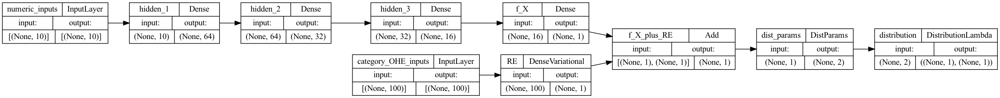

In [72]:
plot_model(lmmnet, rankdir="LR", show_shapes=True, show_layer_names=True)

In [73]:
# Examine the trained parameters
dummy_input = tf.constant(0.) # doesn't matter what this is
model_prior = lmmnet.get_layer("RE")._prior(dummy_input)
model_posterior = lmmnet.get_layer("RE")._posterior(dummy_input)

print("Prior mean:     ", model_prior.mean().numpy()[0])
print("Prior variance: ", model_prior.variance().numpy()[0])
print("Posterior mean: ")
print(model_posterior.mean().numpy())
print("Posterior variance: " )
print(model_posterior.variance().numpy())

# Get the dispersion parameter (here the error variance)
sigma_e = lmmnet.get_layer("dist_params").get_weights()
print(f"Estimated sigma_e: {sigma_e[0][0]:.8f}")

Prior mean:      0.0
Prior variance:  0.022677397
Posterior mean: 
[ 0.29295117  0.00326393  0.24947704 -0.02088748 -0.18800528 -0.04669521
  0.26351032  0.05558364  0.11961187  0.20353001 -0.05818044 -0.08779083
  0.3022364  -0.11579442 -0.19960737  0.03956174 -0.05118812  0.16197172
 -0.09972574  0.12999152  0.19445765  0.0910882   0.04199971 -0.01841659
 -0.18808025  0.11289716 -0.06011871  0.22131501 -0.0896493  -0.03616609
  0.1644485  -0.04758636  0.19724484 -0.10620481 -0.0908664   0.06325003
 -0.14821014  0.23727506  0.03503769 -0.13561365  0.14691433 -0.22723915
 -0.09296124  0.06664389 -0.156153   -0.251962   -0.0252099   0.39923668
 -0.00661302 -0.01227564 -0.20650372 -0.14867653  0.19704285 -0.00108089
 -0.24391407 -0.13924013  0.01052689 -0.07365461 -0.14554034  0.05977091
  0.10117393  0.08523325 -0.25075626  0.04847439 -0.08565698 -0.08817272
 -0.00049184  0.02640534 -0.10474477  0.02470954 -0.13416226 -0.11114182
  0.07227137  0.1402281   0.02365988  0.13657339 -0.11783

In [71]:
p = plot_from_predictions(y_pred_train, y_true_train, y_pred_test, y_true_test, log_scale=log_plot)

In [72]:
# Evaluate model performance
# Average the scores
train_scores["LMMNet"] = dict(pd.DataFrame(LMMNet_train_scores).mean())
test_scores["LMMNet"] = dict(pd.DataFrame(LMMNet_test_scores).mean())

# Training set
print("> In-sample performance")
pp.pprint(train_scores["LMMNet"])
print("-" * 80)
print("> Out-of-sample performance")
pp.pprint(test_scores["LMMNet"])

> In-sample performance
{'CRPS': 0.0949814254215909,
 'MAE': 0.13389034615929216,
 'MedAE': 0.11167675281246447,
 'MedPE': 0.16485625961563993,
 'R2': 0.7275035603928541,
 'RMSE': 0.16843348273356934,
 'RMSE_avg': 0.020005400707336175,
 'RMSE_avg_weighted': 0.02020921302115074}
--------------------------------------------------------------------------------
> Out-of-sample performance
{'CRPS': 0.09870961749473421,
 'MAE': 0.139452042050988,
 'MedAE': 0.11859771272215172,
 'MedPE': 0.17115472141440802,
 'R2': 0.7104112481457501,
 'RMSE': 0.17480202709884146,
 'RMSE_avg': 0.046120497218803465,
 'RMSE_avg_weighted': 0.04578272023771359}


In [73]:
p = bop.figure(title="Random Effects Predictions", x_axis_label="Ground truth", y_axis_label="Predictions", width=400, height=400)
p.add_layout(bom.Title(text="Model: LMMNet", text_font_style="italic"), "above")
# Get the posterior mean of the random effects
u_hat = lmmnet.get_layer("RE").weights[0][:cardinality] # extract the posterior means
re_lmmnet = tf.gather(u_hat, X_train_ct[hicard_var].astype("int")).numpy()
p.circle(Zu[:n_train], re_lmmnet, color="#9f86c0")
p.add_layout(bom.Slope(gradient=1, y_intercept=0, line_color="black", line_width=2))
bop.show(p)

In [76]:
# Get the posterior mean of the random effects
u_hat = model_posterior.mean().numpy()
re_lmmnet = tf.gather(u_hat, X_train_ct[hicard_var].astype("int")).numpy()
# Get the posterior variance of the random effects
u_var = model_posterior.stddev().numpy()
re_var_lmmnet = tf.gather(u_var, X_train_ct[hicard_var].astype("int")).numpy()

# Add error bars
base = re_lmmnet
upper = [x + 1.96 * e for x, e in zip(Zu[:n_train], re_var_lmmnet)]
lower = [x - 1.96 * e for x, e in zip(Zu[:n_train], re_var_lmmnet)]
source = bom.ColumnDataSource(data=dict(base=base, upper=upper, lower=lower))

# Plot
p = bop.figure(title="Random Effects Predictions", x_axis_label="Ground truth", y_axis_label="Predictions", width=400, height=400)
p.add_layout(bom.Whisker(source=source, base="base", upper="upper", lower="lower", dimension="width"))
p.add_layout(bom.Title(text="Model: LMMNet", text_font_style="italic"), "above")
p.circle(x=Zu[:n_train], y=re_lmmnet, color="#9f86c0")
p.add_layout(bom.Slope(gradient=1, y_intercept=0, line_color="black", line_width=2))
bop.show(p)

79/79 [==============================] - 0s 3ms/step


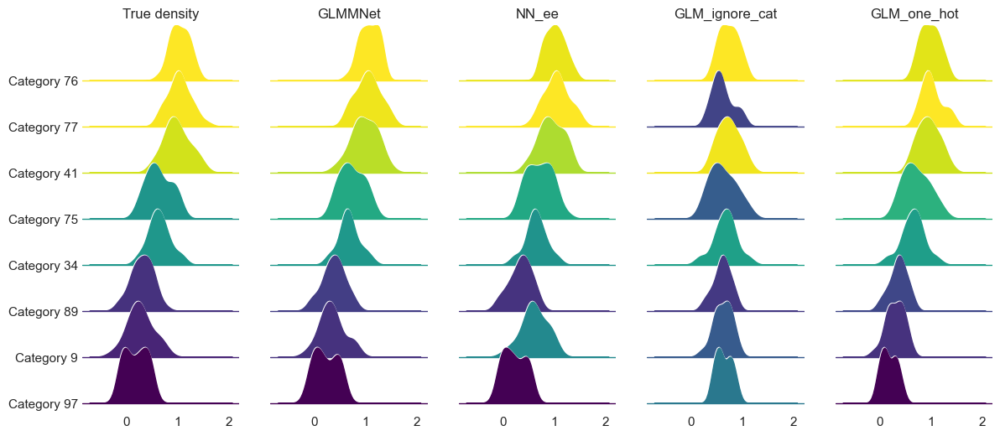

In [77]:
# Code adapted from https://scipython.com/blog/ridgeline-plots-of-monthly-uk-temperatures/
dpi = 100
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(1400/dpi, 600/dpi), dpi=dpi)

ranked_cats = test_data.groupby("category").mean().sort_values("y").index.to_list()
selected_cats = ranked_cats[:3] + ranked_cats[len(ranked_cats)//2:len(ranked_cats)//2+2] + ranked_cats[-3:]
p_min, p_max = y_true_test.min(), y_true_test.max()
plot_ridgeline(X_test["category"], y_true_test, selected_cats, axes[0], "True density")
plot_ridgeline(X_test["category"], y_pred_test, selected_cats, axes[1], "GLMMNet", ylabel=False, p_min=p_min, p_max=p_max)
NN_ee_y_pred_test = NN_ee.predict((tuple(X_embed_test), X_test_ct[x_num])).flatten()
plot_ridgeline(X_test["category"], NN_ee_y_pred_test, selected_cats, axes[2], "NN_ee", ylabel=False, p_min=p_min, p_max=p_max)
plot_ridgeline(X_test["category"], GLM_ignore_cat.predict(X_test), selected_cats, axes[3], "GLM_ignore_cat", ylabel=False, p_min=p_min, p_max=p_max)
plot_ridgeline(X_test["category"], GLM_one_hot.predict(X_test), selected_cats, axes[4], "GLM_one_hot", ylabel=False, p_min=p_min, p_max=p_max)

plt.show()
# fig.savefig(f"figures/experiment_{exp_id}/ridgeline.pdf")

#### Comparison of Models for Experiment #1

In [79]:
with pd.option_context("display.float_format", "{:.4f}".format):
    display(pd.DataFrame(train_scores).transpose())
    display(pd.DataFrame(test_scores).transpose())

,MAE,RMSE,R2,RMSE_avg,RMSE_avg_weighted,CRPS
GLM_ignore_cat,0.2026,0.2541,0.3800,0.1539,0.1533,0.1431
GLM_one_hot,0.1614,0.2026,0.6059,0.0000,0.0000,0.1142
GLM_GLMM_enc,0.1634,0.2047,0.5974,0.0304,0.0296,0.1153
GBM_ignore_cat,0.1808,0.2277,0.5021,0.1483,0.1478,0.1281
GBM_one_hot,0.1710,0.2137,0.5614,0.1162,0.1146,0.1207
GBM_GLMM_enc,0.1412,0.1772,0.6983,0.0340,0.0338,0.0998
NN_ee,0.1354,0.1709,0.7193,0.0343,0.0335,0.0962
GBM_ee,0.1684,0.2108,0.5734,0.1145,0.1144,0.1189
GLMM,0.1614,0.2025,0.6061,0.0057,0.0055,0.1141
GPBoost,0.1542,0.1934,0.6409,0.0050,0.0048,0.1090


,MAE,RMSE,R2,RMSE_avg,RMSE_avg_weighted,CRPS
GLM_ignore_cat,0.2017,0.2531,0.3931,0.1621,0.1632,0.1427
GLM_one_hot,0.1587,0.1998,0.6217,0.0507,0.0498,0.1123
GLM_GLMM_enc,0.1611,0.2025,0.6115,0.0605,0.0598,0.1140
GBM_ignore_cat,0.1876,0.2345,0.4791,0.1603,0.1610,0.1324
GBM_one_hot,0.1779,0.2204,0.5398,0.1299,0.1309,0.1249
GBM_GLMM_enc,0.1452,0.1815,0.6879,0.0587,0.0591,0.1023
NN_ee,0.1430,0.1800,0.6929,0.0571,0.0548,0.1013
GBM_ee,0.1739,0.2161,0.5575,0.1273,0.1286,0.1224
GLMM,0.1588,0.1999,0.6213,0.0512,0.0505,0.1124
GPBoost,0.1599,0.2009,0.6174,0.0510,0.0507,0.1133


Note that LMMNN outperforms `NN_ee` (though only by a small margin), suggesting that optimising the network via the (more suitable) mixed model likelihood can provide a benefit.

### Experiment #2

In [80]:
# Configure simulation parameters
exp_id = 2                         # experiment id
sig2noise = np.array([4, 1, 4])    # relative signal-to-noise of the fixed effects, random effects and irreducible error
y_dist = "gaussian"                # distribution of the response variable y
inverse_link = lambda x: x         # inverse of the identity link
cat_dist = "balanced"              # distribution of the categorical variable
random_seed = 42 + exp_id          # random seed for reproducibility
log_plot = False                   # whether to plot the log transformed response and predictions
nn_loss = "mse"                    # loss function for the neural network

In [81]:
# Generate data
sim_data = generate_data(
    exp_id=exp_id, n_train=n_train, n_test=n_test, n_categories=n_categories,
    f_structure=f_structure, signal_to_noise=sig2noise, y_dist=y_dist,
    inverse_link=inverse_link, cat_dist=cat_dist, random_state=random_seed,
    overwrite=True
)

In [82]:
print("Please pause and run R script to generate the results required.")
print("Remember to update the parameters in the R script to match the current settings.")

Please pause and run R script to generate the results required.
Remember to update the parameters in the R script to match the current settings.


In [38]:
# Make a function to make life easier for repeated experiments
# Skip all the plotting and just return the table of results
def run_sim_experiment(exp_id, sim_data, y_dist="gaussian", random_state=random_seed):

    # Unpack data
    X_train, y_train, y_true_train = sim_data["train"]
    X_test, y_test, y_true_test = sim_data["test"]
    Zu = sim_data["Zu"]

    # Variable names
    hicard_var = "category"
    x_num = [col for col in X_train.columns if col not in hicard_var]
    colnames = [hicard_var] + x_num

    # Convert numeric to string so they can be recognised by ce.OrdinalEncoder
    X_train[hicard_var] = X_train[hicard_var].astype("str")
    X_test[hicard_var] = X_test[hicard_var].astype("str")

    # Initialise
    train_scores = dict()
    test_scores = dict()
    plots = dict()
    runtimes = dict()
    models = dict()

    # GLM
    # -------------------------------------------------------------------------
    ignore_cat_encoder = make_column_transformer(
        ("drop", [hicard_var]),
        (MinMaxScaler(feature_range=(0, 1)), x_num), # not required for GLMs, applied here for consistency
    )
    X_train_ic = ignore_cat_encoder.fit_transform(X_train)
    X_test_ic = ignore_cat_encoder.transform(X_test)
    start = time.time()
    if y_dist == "gaussian":
        GLM_ignore_cat = LinearRegression()
        GLM_ignore_cat.fit(X_train_ic, y_train)
        gamma_shape = None # placeholder, will not be read when y_dist == "gaussian"
    elif y_dist == "gamma":
        GLM_ignore_cat = sm.GLM(y_train, X_train_ic, family=sm.families.Gamma(sm.families.links.log())).fit()
        gamma_shape = 1 / GLM_ignore_cat.scale
    end = time.time()
    train_scores["GLM_ignore_cat"] = evaluate_model(
        GLM_ignore_cat, X_train_ic, y_train, categories=X_train[hicard_var], 
        likelihood=y_dist, gamma_shape=gamma_shape)
    test_scores["GLM_ignore_cat"] = evaluate_model(
        GLM_ignore_cat, X_test_ic, y_test, categories=X_test[hicard_var], 
        likelihood=y_dist, gamma_shape=gamma_shape)
    plots["GLM_ignore_cat"] = plot_from_model(GLM_ignore_cat, X_train_ic, y_true_train, X_test_ic, y_true_test, log_scale=log_plot, show=False)
    runtimes["GLM_ignore_cat"] = end - start
    models["GLM_ignore_cat"] = GLM_ignore_cat

    one_hot_encoder = make_column_transformer(
        (OneHotEncoder(handle_unknown="ignore", drop="first", sparse=False), [hicard_var]),
        (MinMaxScaler(feature_range=(0, 1)), x_num), # not required for GLMs, applied here for consistency
    )
    X_train_ohe = one_hot_encoder.fit_transform(X_train)
    X_test_ohe = one_hot_encoder.transform(X_test)
    start = time.time()
    if y_dist == "gaussian":
        GLM_one_hot = LinearRegression()
        GLM_one_hot.fit(X_train_ohe, y_train)
        gamma_shape = None # placeholder, will not be read when y_dist == "gaussian"
    elif y_dist == "gamma":
        GLM_one_hot = sm.GLM(y_train, X_train_ohe, family=sm.families.Gamma(sm.families.links.log())).fit()
        gamma_shape = 1 / GLM_one_hot.scale
    end = time.time()
    train_scores["GLM_one_hot"] = evaluate_model(
        GLM_one_hot, X_train_ohe, y_train, categories=X_train[hicard_var], 
        likelihood=y_dist, gamma_shape=gamma_shape)
    test_scores["GLM_one_hot"] = evaluate_model(
        GLM_one_hot, X_test_ohe, y_test, categories=X_test[hicard_var], 
        likelihood=y_dist, gamma_shape=gamma_shape)
    plots["GLM_one_hot"] = plot_from_model(GLM_one_hot, X_train_ohe, y_true_train, X_test_ohe, y_true_test, log_scale=log_plot, show=False)
    runtimes["GLM_one_hot"] = end - start
    models["GLM_one_hot"] = GLM_one_hot

    GLMM_encoder = make_column_transformer(
        # https://contrib.scikit-learn.org/category_encoders/wrapper.html
        (NestedCVWrapper(ce.glmm.GLMMEncoder(), cv=KFold(n_splits=5)), [hicard_var]),
        (MinMaxScaler(feature_range=(0, 1)), x_num), # not required for GLMs, applied here for consistency
    )
    X_train_GLMM_enc = GLMM_encoder.fit_transform(X_train, y_train)
    X_test_GLMM_enc = GLMM_encoder.transform(X_test)
    start = time.time()
    if y_dist == "gaussian":
        GLM_GLMM_enc = LinearRegression()
        GLM_GLMM_enc.fit(X_train_GLMM_enc, y_train)
        gamma_shape = None # placeholder, will not be read when y_dist == "gaussian"
    elif y_dist == "gamma":
        GLM_GLMM_enc = sm.GLM(y_train, X_train_GLMM_enc, family=sm.families.Gamma(sm.families.links.log())).fit()
        gamma_shape = 1 / GLM_GLMM_enc.scale
    end = time.time()
    train_scores["GLM_GLMM_enc"] = evaluate_model(
        GLM_GLMM_enc, X_train_GLMM_enc, y_train, categories=X_train[hicard_var], 
        likelihood=y_dist, gamma_shape=gamma_shape)
    test_scores["GLM_GLMM_enc"] = evaluate_model(
        GLM_GLMM_enc, X_test_GLMM_enc, y_test, categories=X_test[hicard_var], 
        likelihood=y_dist, gamma_shape=gamma_shape)
    plots["GLM_GLMM_enc"] = plot_from_model(GLM_GLMM_enc, X_train_GLMM_enc, y_true_train, X_test_GLMM_enc, y_true_test, log_scale=log_plot, show=False)
    # Plot GLMM encodings vs true random effects
    left, right = Zu.min(), Zu.max()
    span = right - left
    bottom, top = Zu.min() - span * 0.1, Zu.max() + span * 0.1
    p = bop.figure(title="GLMM Encodings", x_axis_label="Ground truth", y_axis_label="GLMM encodings", width=400, height=300,
                   x_range=(left, right), y_range=(bottom, top))
    p.add_layout(bom.Title(text="Model: GLMM encodings", text_font_style="italic"), "above")
    GLMM_encodings = GLMM_encoder.named_transformers_["nestedcvwrapper"].transform(X_train[hicard_var])
    p.circle(Zu[:X_train.shape[0]], GLMM_encodings.values.ravel(), color="#9f86c0")
    p.add_layout(bom.Slope(gradient=1, y_intercept=0, line_color="black", line_width=2))
    plots["GLMM_encodings"] = p
    runtimes["GLM_GLMM_enc"] = end - start
    models["GLM_GLMM_enc"] = GLM_GLMM_enc

    # GBM
    # -------------------------------------------------------------------------
    GBM_ignore_cat = xgb.XGBRegressor(n_jobs=-1, learning_rate=0.1, max_depth=2, random_state=random_state)
    start = time.time()
    GBM_ignore_cat.fit(X_train_ic, y_train)
    end = time.time()
    train_scores["GBM_ignore_cat"] = evaluate_model(GBM_ignore_cat, X_train_ic, y_train, categories=X_train[hicard_var], likelihood=y_dist)
    test_scores["GBM_ignore_cat"] = evaluate_model(GBM_ignore_cat, X_test_ic, y_test, categories=X_test[hicard_var], likelihood=y_dist)
    plots["GBM_ignore_cat"] = plot_from_model(GBM_ignore_cat, X_train_ic, y_true_train, X_test_ic, y_true_test, log_scale=log_plot, show=False)
    runtimes["GBM_ignore_cat"] = end - start
    models["GBM_ignore_cat"] = GBM_ignore_cat

    GBM_one_hot = xgb.XGBRegressor(n_jobs=-1, learning_rate=0.1, max_depth=2, random_state=random_state)
    start = time.time()
    GBM_one_hot.fit(X_train_ohe, y_train)
    end = time.time()
    train_scores["GBM_one_hot"] = evaluate_model(GBM_one_hot, X_train_ohe, y_train, categories=X_train[hicard_var], likelihood=y_dist)
    test_scores["GBM_one_hot"] = evaluate_model(GBM_one_hot, X_test_ohe, y_test, categories=X_test[hicard_var], likelihood=y_dist)
    plots["GBM_one_hot"] = plot_from_model(GBM_one_hot, X_train_ohe, y_true_train, X_test_ohe, y_true_test, log_scale=log_plot, show=False)
    runtimes["GBM_one_hot"] = end - start
    models["GBM_one_hot"] = GBM_one_hot

    GBM_GLMM_enc = xgb.XGBRegressor(n_jobs=-1, learning_rate=0.1, max_depth=2, random_state=random_state)
    start = time.time()
    GBM_GLMM_enc.fit(X_train_GLMM_enc, y_train)
    end = time.time()
    train_scores["GBM_GLMM_enc"] = evaluate_model(GBM_GLMM_enc, X_train_GLMM_enc, y_train, categories=X_train[hicard_var], likelihood=y_dist)
    test_scores["GBM_GLMM_enc"] = evaluate_model(GBM_GLMM_enc, X_test_GLMM_enc, y_test, categories=X_test[hicard_var], likelihood=y_dist)
    plots["GBM_GLMM_enc"] = plot_from_model(GBM_GLMM_enc, X_train_GLMM_enc, y_true_train, X_test_GLMM_enc, y_true_test, log_scale=log_plot, show=False)
    runtimes["GBM_GLMM_enc"] = end - start
    models["GBM_GLMM_enc"] = GBM_GLMM_enc

    # NN with entity embeddings
    # -------------------------------------------------------------------------
    ct_nn = make_column_transformer(
        (ce.ordinal.OrdinalEncoder(handle_unknown="value"), [hicard_var]), # "value" encodes unknown categories as "-1"
        (MinMaxScaler(feature_range=(0, 1)), x_num),
    )
    X_train_ct = pd.DataFrame(ct_nn.fit_transform(X_train), columns=colnames)
    X_test_ct = pd.DataFrame(ct_nn.transform(X_test), columns=colnames)
    X_embed_train, X_embed_test = embedding_preproc(X_train_ct, X_test_ct, [hicard_var])

    # Define training parameters
    epochs = 500
    patience = 50
    batch_size = 256
    NN_ee = build_baseline_nn(X_train_ct, objective=nn_loss, random_state=random_state, num_vars=x_num, cat_vars=[hicard_var])
    es = EarlyStopping(patience=patience, restore_best_weights=True, monitor="val_loss", verbose=2)

    start = time.time()
    hist = NN_ee.fit(
        (tuple(X_embed_train), X_train_ct[x_num]), y_train, validation_split=0.2, 
        epochs=epochs, callbacks=[es], batch_size=batch_size, verbose=0)
    end = time.time()
    hist = hist.history
    # Save model and history
    NN_ee.save(f"models/experiment_{exp_id}/NN_ee.h5")
    np.save(f"models/experiment_{exp_id}/NN_ee.npy", hist)
    y_pred_train = NN_ee.predict((tuple(X_embed_train), X_train_ct[x_num])).flatten()
    y_pred_test = NN_ee.predict((tuple(X_embed_test), X_test_ct[x_num])).flatten()
    train_scores["NN_ee"] = evaluate_predictions(y_train, y_pred_train, categories=X_train[hicard_var], likelihood=y_dist)
    test_scores["NN_ee"] = evaluate_predictions(y_test, y_pred_test, categories=X_test[hicard_var], likelihood=y_dist)
    plots["NN_ee"] = plot_from_predictions(y_pred_train, y_true_train, y_pred_test, y_true_test, log_scale=log_plot, show=False)
    runtimes["NN_ee"] = end - start
    models["NN_ee"] = NN_ee

    # Extract embeddings from the fitted neural network model
    embeddings = NN_ee.get_layer(f"{hicard_var}_embed").get_weights()[0]
    embeddings = pd.DataFrame(embeddings, columns=["embedding_" + str(i) for i in range(embeddings.shape[1])])
    oe = ct_nn.named_transformers_["ordinalencoder"]
    categories = np.array(oe.category_mapping[0]["mapping"])[:-1]
    embeddings = pd.concat([pd.DataFrame(categories, columns=[hicard_var]), embeddings], axis=1)
    embeddings

    # GBM with entity embeddings
    # -------------------------------------------------------------------------
    # .fillna(0) fills zeros for missing values in the embeddings (i.e. unknown categories)
    X_train_ee = pd.merge(X_train_ct, embeddings, on="category", how="left").drop("category", axis=1)
    X_test_ee = pd.merge(X_test_ct, embeddings, on="category", how="left").drop("category", axis=1).fillna(0)
    GBM_ee = xgb.XGBRegressor(n_jobs=-1, learning_rate=0.1, max_depth=2, random_state=random_state)
    start = time.time()
    GBM_ee.fit(X_train_ee, y_train)
    end = time.time()
    train_scores["GBM_ee"] = evaluate_model(GBM_ee, X_train_ee, y_train, categories=X_train[hicard_var], likelihood=y_dist)
    test_scores["GBM_ee"] = evaluate_model(GBM_ee, X_test_ee, y_test, categories=X_test[hicard_var], likelihood=y_dist)
    plots["GBM_ee"] = plot_from_model(GBM_ee, X_train_ee, y_true_train, X_test_ee, y_true_test, log_scale=log_plot, show=False)
    runtimes["GBM_ee"] = end - start
    models["GBM_ee"] = GBM_ee

    # GLMM
    # -------------------------------------------------------------------------
    y_pred_train_brms = pd.read_csv(f"models/experiment_{exp_id}/brms_pred_train.csv").values.reshape(-1)
    y_pred_test_brms = pd.read_csv(f"models/experiment_{exp_id}/brms_pred_test.csv").values.reshape(-1)
    re_brms = pd.read_csv(f"models/experiment_{exp_id}/brms_re.csv").values.reshape(-1)
    sigma_brms = pd.read_csv(f"models/experiment_{exp_id}/brms_sigma.csv").values.reshape(-1)
    if y_dist == "gaussian":
        custom_params_train = {"loc": y_pred_train_brms, "scale": sigma_brms}
        custom_params_test = {"loc": y_pred_test_brms, "scale": sigma_brms}
    elif y_dist == "gamma":
        custom_params_train = {"gamma_shape": sigma_brms, "gamma_scale": y_pred_train_brms / sigma_brms}
        custom_params_test = {"gamma_shape": sigma_brms, "gamma_scale": y_pred_test_brms / sigma_brms}
    train_scores["GLMM"] = evaluate_predictions(
        y_train, y_pred_train_brms, categories=X_train[hicard_var], likelihood=y_dist,
        **custom_params_train
    )
    test_scores["GLMM"] = evaluate_predictions(
        y_test, y_pred_test_brms, categories=X_test[hicard_var], likelihood=y_dist,
        **custom_params_test
    )
    plots["GLMM"] = plot_from_predictions(y_pred_train_brms, y_true_train, y_pred_test_brms, y_true_test, log_scale=log_plot, show=False)
    # Plot the random effects
    p = bop.figure(title="Random Effects Predictions", x_axis_label="Ground truth", y_axis_label="Predictions", width=400, height=400,
                   x_range=(left, right), y_range=(bottom, top))
    p.add_layout(bom.Title(text="Model: GLMM", text_font_style="italic"), "above")
    rev_index = X_train[hicard_var].astype(int).rank(method="dense").astype(int) - 1
    rev = np.array([float(re_brms[g]) for g in rev_index])
    p.circle(Zu[:X_train.shape[0]], rev, color="#9f86c0")
    p.add_layout(bom.Slope(gradient=1, y_intercept=0, line_color="black", line_width=2))
    plots["GLMM_RE_pred"] = p
    
    # GPBoost
    # -------------------------------------------------------------------------
    y_pred_train_gpb = pd.read_csv(f"models/experiment_{exp_id}/gpboost_pred_train.csv").values.reshape(-1)
    y_pred_test_gpb = pd.read_csv(f"models/experiment_{exp_id}/gpboost_pred_test.csv").values.reshape(-1)
    re_gpb = pd.read_csv(f"models/experiment_{exp_id}/gpboost_re.csv").values.reshape(-1)
    scale_gpb = pd.read_csv(f"models/experiment_{exp_id}/gpboost_scale.csv").values.reshape(-1)
    train_scores["GPBoost"] = evaluate_predictions(
        y_train, y_pred_train_gpb, categories=X_train[hicard_var], likelihood=y_dist,
        loc=y_pred_train_gpb, scale=np.sqrt(scale_gpb),
    )
    test_scores["GPBoost"] = evaluate_predictions(
        y_test, y_pred_test_gpb, categories=X_test[hicard_var], likelihood=y_dist,
        loc=y_pred_test_gpb, scale=np.sqrt(scale_gpb),
    )
    plots["GPBoost"] = plot_from_predictions(y_pred_train_gpb, y_true_train, y_pred_test_gpb, y_true_test, log_scale=log_plot, show=False)
    # Plot the random effects
    p = bop.figure(title="Random Effects Predictions", x_axis_label="Ground truth", y_axis_label="Predictions", width=400, height=400,
                   x_range=(left, right), y_range=(bottom, top))
    p.add_layout(bom.Title(text="Model: GPBoost", text_font_style="italic"), "above")
    p.circle(Zu[:X_train.shape[0]], re_gpb, color="#9f86c0")
    p.add_layout(bom.Slope(gradient=1, y_intercept=0, line_color="black", line_width=2))
    plots["GPBoost_RE_pred"] = p

    # LMMNN
    # -------------------------------------------------------------------------
    # Inherit global parameters from the first experiment
    X_train_ct[hicard_var] = X_train_ct[hicard_var].astype(int) - 1
    X_test_ct[hicard_var] = X_test_ct[hicard_var].astype(int) - 1

    if y_dist == "gaussian":
        start = time.time()
        tf.random.set_seed(random_state)
        _, y_pred_train, *_ = reg_nn_lmm(
            X_train_ct.rename(columns={hicard_var: "z0"}), X_train_ct.rename(columns={hicard_var: "z0"}), 
            y_train, y_train, qs, q_spatial, x_cols, batch, epochs, patience, n_neurons, dropout, activation, 
            mode, n_sig2bs, n_sig2bs_spatial, est_cors, dist_matrix, spatial_embed_neurons,
            verbose, Z_non_linear, Z_embed_dim_pct, log_params, idx)
        end = time.time()

        tf.random.set_seed(random_state)
        lmmnn, y_pred_test, sigmas, rhos, weibull, hist_lmmnn = reg_nn_lmm(
            X_train_ct.rename(columns={hicard_var: "z0"}), X_test_ct.rename(columns={hicard_var: "z0"}), 
            y_train, y_test, qs, q_spatial, x_cols, batch, epochs, patience, n_neurons, dropout, activation, 
            mode, n_sig2bs, n_sig2bs_spatial, est_cors, dist_matrix, spatial_embed_neurons,
            verbose, Z_non_linear, Z_embed_dim_pct, log_params, idx)
        
        train_scores["LMMNN"] = evaluate_predictions(
            y_train, y_pred_train, categories=X_train[hicard_var], likelihood=y_dist,
            loc=y_pred_train, scale=np.sqrt(sigmas[0]),
        )
        test_scores["LMMNN"] = evaluate_predictions(
            y_test, y_pred_test, categories=X_test[hicard_var], likelihood=y_dist,
            loc=y_pred_test, scale=np.sqrt(sigmas[0]),
        )
        plots["LMMNN"] = plot_from_predictions(y_pred_train, y_true_train, y_pred_test, y_true_test, log_scale=log_plot, show=False)
        # Plot the random effects
        sig2e_est, sig2b_ests, *_ = sigmas
        u_hat = calc_b_hat(
            X_train_ct.rename(columns={hicard_var: "z0"}), y_train, y_pred_train, qs=[n_categories], q_spatial=None, 
            sig2e=sig2e_est, sig2bs=sig2b_ests, sig2bs_spatial=None,
            Z_non_linear=False, model=lmmnn, ls=None, mode=mode, rhos=None, 
            est_cors=est_cors, dist_matrix=None, weibull_ests=None)
        re_lmmnn = np.array([float(u_hat[g]) for g in X_train_ct[hicard_var]])
        p = bop.figure(title="Random Effects Predictions", x_axis_label="Ground truth", y_axis_label="Predictions", width=400, height=400,
                       x_range=(left, right), y_range=(bottom, top))
        p.add_layout(bom.Title(text="Model: LMMNN", text_font_style="italic"), "above")
        p.circle(Zu[:X_train.shape[0]], re_lmmnn, color="#9f86c0")
        p.add_layout(bom.Slope(gradient=1, y_intercept=0, line_color="black", line_width=2))
        plots["LMMNN_RE_pred"] = p
        runtimes["LMMNN"] = end - start
        models["LMMNN"] = lmmnn

    # GLMMNet (proposed model)
    # -------------------------------------------------------------------------
    tf.random.set_seed(random_state)
    one_hot = ce.OneHotEncoder(cols=[hicard_var], handle_unknown="value")
    X_train_ct_ohe = one_hot.fit_transform(X_train_ct)
    X_test_ct_ohe = one_hot.transform(X_test_ct)
    cardinality = len(one_hot.category_mapping[0]["mapping"].keys()) - 1

    glmmnet = build_glmmnet(
        cardinality=cardinality, num_vars=x_num, final_layer_likelihood=y_dist, 
        train_size=X_train.shape[0], random_state=random_state)
    es = EarlyStopping(patience=50, restore_best_weights=True, monitor="val_loss", verbose=2)
    start = time.time()
    hist = glmmnet.fit(
        (X_train_ct.drop([hicard_var], axis=1), X_train_ct_ohe.loc[:, X_train_ct_ohe.columns.str.startswith(hicard_var)]), y_train, 
        validation_split=0.2,
        callbacks=[es],
        # note: batch_size = 128 (128 or 256 doesn't make a difference, but 256 is faster)
        batch_size=256, epochs=500, verbose=False)
    end = time.time()

    # To make predictions, we call the model multiple times and average the results
    # This is because the random effects are sampled from the posterior (in the DenseVariational layer).
    # n_prediction_samples = 1000
    y_pred_train = predict_glmmnet(glmmnet, X_train_ct_ohe, hicard_var)
    y_pred_test = predict_glmmnet(glmmnet, X_test_ct_ohe, hicard_var)

    phi = glmmnet.get_layer("dist_params").get_weights()
    train_scores["GLMMNet"] = evaluate_predictions(
        y_train, y_pred_train, categories=X_train[hicard_var], likelihood=y_dist,
        loc=y_pred_train, scale=phi[0][0], gamma_shape=1 / phi[0][0])
    test_scores["GLMMNet"] = evaluate_predictions(
        y_test, y_pred_test, categories=X_test[hicard_var], likelihood=y_dist,
        loc=y_pred_test, scale=phi[0][0], gamma_shape=1 / phi[0][0])
    plots["GLMMNet"] = plot_from_predictions(y_pred_train, y_true_train, y_pred_test, y_true_test, log_scale=log_plot, show=False)

    # Plot the random effects
    p = bop.figure(title="Random Effects Predictions", x_axis_label="Ground truth", y_axis_label="Predictions", width=400, height=400,
                   x_range=(left, right), y_range=(bottom, top))
    p.add_layout(bom.Title(text="Model: GLMMNet", text_font_style="italic"), "above")
    u_hat = glmmnet.get_layer("RE").weights[0][:cardinality] # extract the posterior means
    re_glmmnet = tf.gather(u_hat, X_train_ct[hicard_var].astype("int")).numpy() # minus 1 because the categories are 1-indexed
    p.circle(Zu[:n_train], re_glmmnet, color="#9f86c0")
    p.add_layout(bom.Slope(gradient=1, y_intercept=0, line_color="black", line_width=2))
    plots["GLMMNet_RE_pred"] = p
    runtimes["GLMMNet"] = end - start
    models["GLMMNet"] = glmmnet

    # GLMMNet with dropout
    # -------------------------------------------------------------------------
    glmmnet_dropout = build_glmmnet(
        cardinality=cardinality, num_vars=x_num, final_layer_likelihood=y_dist, 
        train_size=X_train.shape[0], random_state=random_state, dropout=True)
    es = EarlyStopping(patience=50, restore_best_weights=True, monitor="val_loss", verbose=2)
    start = time.time()
    hist = glmmnet_dropout.fit(
        (X_train_ct.drop([hicard_var], axis=1), X_train_ct_ohe.loc[:, X_train_ct_ohe.columns.str.startswith(hicard_var)]), y_train, 
        validation_split=0.2,
        callbacks=[es],
        # note: batch_size = 128 (128 or 256 doesn't make a difference, but 256 is faster)
        batch_size=256, epochs=500, verbose=False)
    end = time.time()

    # To make predictions, we call the model multiple times and average the results
    # This is because the random effects are sampled from the posterior (in the DenseVariational layer).
    n_prediction_samples = 1000
    y_pred_train = predict_glmmnet(glmmnet_dropout, X_train_ct_ohe, hicard_var)
    y_pred_test = predict_glmmnet(glmmnet_dropout, X_test_ct_ohe, hicard_var)

    phi = glmmnet_dropout.get_layer("dist_params").get_weights()
    train_scores["GLMMNet_dropout"] = evaluate_predictions(
        y_train, y_pred_train, categories=X_train[hicard_var], likelihood=y_dist,
        loc=y_pred_train, # scale=phi[0][0], gamma_shape=1 / phi[0][0]
    )
    test_scores["GLMMNet_dropout"] = evaluate_predictions(
        y_test, y_pred_test, categories=X_test[hicard_var], likelihood=y_dist,
        loc=y_pred_test, # scale=phi[0][0], gamma_shape=1 / phi[0][0]
    )
    plots["GLMMNet_dropout"] = plot_from_predictions(y_pred_train, y_true_train, y_pred_test, y_true_test, log_scale=log_plot, show=False)
    
    # Plot the random effects
    p = bop.figure(title="Random Effects Predictions", x_axis_label="Ground truth", y_axis_label="Predictions", width=400, height=400,
                   x_range=(left, right), y_range=(bottom, top))
    p.add_layout(bom.Title(text="Model: GLMMNet dropout", text_font_style="italic"), "above")
    u_hat = glmmnet_dropout.get_layer("RE").weights[0][:cardinality] # extract the posterior means
    re_glmmnet_do = tf.gather(u_hat, X_train_ct[hicard_var].astype("int")).numpy() # minus 1 because the categories are 1-indexed
    p.circle(Zu[:n_train], re_glmmnet_do, color="#9f86c0")
    p.add_layout(bom.Slope(gradient=1, y_intercept=0, line_color="black", line_width=2))
    plots["GLMMNet_dropout_RE_pred"] = p
    runtimes["GLMMNet_dropout"] = end - start
    models["GLMMNet_dropout"] = glmmnet_dropout
    
    return train_scores, test_scores, plots, runtimes, models

In [90]:
train_scores, test_scores, plots, runtimes, fitted_models = run_sim_experiment(
    exp_id, sim_data=sim_data, y_dist="gaussian", random_state=random_seed
)

with pd.option_context("display.float_format", "{:.4f}".format):
    display(pd.DataFrame(train_scores).transpose())
    display(pd.DataFrame(test_scores).transpose())
    display(pd.DataFrame(runtimes, index=["Runtime (sec)"]).transpose())

Restoring model weights from the end of the best epoch: 9.
Epoch 59: early stopping
79/79 [==============================] - 0s 2ms/step
Restoring model weights from the end of the best epoch: 145.
Epoch 195: early stopping
Restoring model weights from the end of the best epoch: 353.
Epoch 403: early stopping


,MAE,RMSE,R2,RMSE_avg,RMSE_avg_weighted,CRPS
GLM_ignore_cat,0.3718,0.4659,0.0767,0.1295,0.1288,0.2629
GLM_one_hot,0.3570,0.4478,0.1474,0.0000,0.0000,0.2525
GLM_GLMM_enc,0.3637,0.4565,0.1139,0.0433,0.0423,0.2574
GBM_ignore_cat,0.3595,0.4504,0.1374,0.1259,0.1253,0.2542
GBM_one_hot,0.3578,0.4479,0.1467,0.1000,0.0993,0.2528
GBM_GLMM_enc,0.3476,0.4355,0.1933,0.0493,0.0487,0.2457
NN_ee,0.3575,0.4488,0.1434,0.0504,0.0497,0.2530
GBM_ee,0.3548,0.4450,0.1580,0.0971,0.0964,0.2510
GLMM,0.3580,0.4491,0.1422,0.0326,0.0317,0.2533
GPBoost,0.3495,0.4366,0.1892,0.0311,0.0303,0.2465


,MAE,RMSE,R2,RMSE_avg,RMSE_avg_weighted,CRPS
GLM_ignore_cat,0.3693,0.4625,0.0594,0.1369,0.1373,0.2607
GLM_one_hot,0.3621,0.4559,0.0861,0.1129,0.1118,0.2567
GLM_GLMM_enc,0.3610,0.4542,0.0930,0.1058,0.1052,0.2557
GBM_ignore_cat,0.3669,0.4604,0.0680,0.1360,0.1364,0.2593
GBM_one_hot,0.3639,0.4572,0.0808,0.1234,0.1233,0.2575
GBM_GLMM_enc,0.3599,0.4525,0.0996,0.1033,0.1022,0.2548
NN_ee,0.3612,0.4539,0.0942,0.1034,0.1033,0.2556
GBM_ee,0.3632,0.4567,0.0827,0.1238,0.1231,0.2570
GLMM,0.3611,0.4539,0.0943,0.1050,0.1040,0.2556
GPBoost,0.3635,0.4564,0.0841,0.1064,0.1053,0.2571


,Runtime (sec)
GLM_ignore_cat,0.0049
GLM_one_hot,0.3633
GLM_GLMM_enc,0.1164
GBM_ignore_cat,0.5474
GBM_one_hot,0.4409
GBM_GLMM_enc,9.8219
NN_ee,10.4977
GBM_ee,0.3111
LMMNN,27.1807
GLMMNet,43.3599


**Observations**:
- More typical of what we see with real insurance data. Differences in performance are small.
- As often observed in practice with tabular data, GBM shows a marginal but consistent advantage over GLM and NN.
- Models with random effects (including GLMM encoded models) can capture the between-category differences better than the entity embeddings.

In [85]:
g = gridplot([
    plots["GBM_ee"], plots["NN_ee"], 
    plots["GBM_GLMM_enc"], plots["GLMMNet"],
    ], ncols=1, height=400, width=200)
bop.show(g)

In [91]:
g_re = gridplot([
    plots["GLMM_encodings"], plots["GLMM_RE_pred"], 
    plots["GPBoost_RE_pred"], plots["LMMNN_RE_pred"],
    plots["GLMMNet_RE_pred"], plots["GLMMNet_dropout_RE_pred"],
    ], ncols=3, height=300, width=300)
bop.show(g_re)

RE predictions are much worse compared to experiment #1 (as one would expect, the models would have picked up more random noise).

### Experiment #3

In [10]:
# Configure simulation parameters
exp_id = 3                         # experiment id
sig2noise = np.array([4, 1, 1])    # relative signal-to-noise of the fixed effects, random effects and irreducible error
y_dist = "gaussian"                # distribution of the response variable y
inverse_link = lambda x: x         # inverse of the identity link
cat_dist = "skewed"                # distribution of the categorical variable
random_seed = 42 + exp_id          # random seed for reproducibility
log_plot = False                   # whether to plot the log transformed response and predictions
nn_loss = "mse"                    # loss function for the neural network

In [11]:
# Generate data
sim_data = generate_data(
    exp_id=exp_id, n_train=n_train, n_test=n_test, n_categories=n_categories,
    f_structure=f_structure, signal_to_noise=sig2noise, y_dist=y_dist,
    inverse_link=inverse_link, cat_dist=cat_dist, random_state=random_seed,
    overwrite=True,
)

In [94]:
print("Please pause and run R script to generate the results required.")
print("Remember to update the parameters in the R script to match the current settings.")

Please pause and run R script to generate the results required.
Remember to update the parameters in the R script to match the current settings.


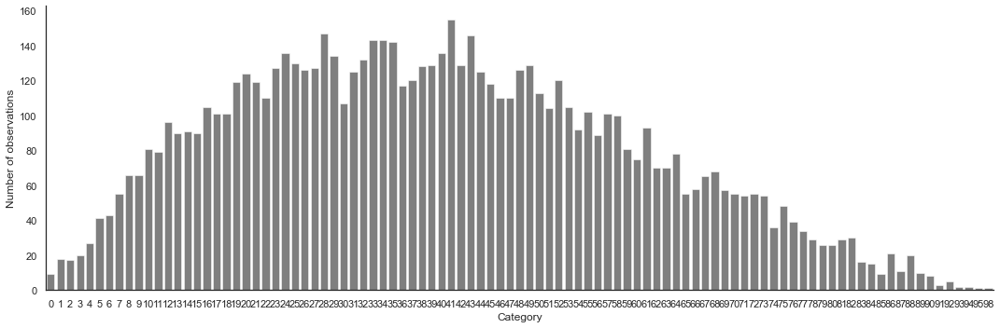

In [12]:
X_train = pd.read_csv(f"data/experiment_{exp_id}/train_data.csv")
X_test = pd.read_csv(f"data/experiment_{exp_id}/test_data.csv")
X = pd.concat([X_train, X_test], axis=0)
cat_count = X[hicard_var].value_counts()
fig = plt.figure(figsize=(15, 5))
_ = sns.barplot(x=cat_count.index, y=cat_count.values, color="black", alpha=0.5)
plt.ylabel("Number of observations")
plt.xlabel("Category")
plt.tight_layout()

In [20]:
# RERUN, delete later
train_scores, test_scores, plots, runtimes, fitted_models = run_sim_experiment(
    exp_id, sim_data=sim_data, y_dist="gaussian", random_state=random_seed
)

with pd.option_context("display.float_format", "{:.4f}".format):
    display(pd.DataFrame(train_scores).transpose())
    display(pd.DataFrame(test_scores).transpose())
    display(pd.DataFrame(runtimes, index=["Runtime (sec)"]).transpose())

Restoring model weights from the end of the best epoch: 96.
Epoch 146: early stopping
79/79 [==============================] - 0s 2ms/step
Restoring model weights from the end of the best epoch: 75.
Epoch 125: early stopping


100%|██████████| 100/100 [00:03<00:00, 26.47it/s]


Restoring model weights from the end of the best epoch: 227.
Epoch 277: early stopping


100%|██████████| 100/100 [00:04<00:00, 21.20it/s]


,MAE,MedAE,MedPE,RMSE,R2,RMSE_avg,RMSE_avg_weighted,CRPS
GLM_ignore_cat,0.2057,0.1765,0.2571,0.2567,0.3610,0.1720,0.1603,0.1451
GLM_one_hot,0.1598,0.1375,0.2027,0.2004,0.6104,0.0000,0.0000,0.1131
GLM_GLMM_enc,0.1642,0.1398,0.2079,0.2054,0.5907,0.0638,0.0244,0.1160
GBM_ignore_cat,0.1834,0.1575,0.2252,0.2287,0.4927,0.1606,0.1518,0.1292
GBM_one_hot,0.1706,0.1466,0.2071,0.2118,0.5650,0.1345,0.1129,0.1200
GBM_GLMM_enc,0.1397,0.1192,0.1763,0.1747,0.7039,0.0613,0.0286,0.0986
NN_ee,0.1276,0.1091,0.1619,0.1597,0.7527,0.0343,0.0165,0.0901
GBM_ee,0.1675,0.1441,0.2081,0.2085,0.5783,0.1303,0.1139,0.1178
GLMM,0.1601,0.1370,0.2028,0.2006,0.6097,0.0374,0.0079,0.1132
GPBoost,0.1513,0.1288,0.1961,0.1890,0.6537,0.0284,0.0071,0.1068


,MAE,MedAE,MedPE,RMSE,R2,RMSE_avg,RMSE_avg_weighted,CRPS
GLM_ignore_cat,0.2057,0.1745,0.2460,0.2570,0.3748,0.1655,0.1608,0.1450
GLM_one_hot,0.1651,0.1394,0.2025,0.2066,0.5959,0.0915,0.0493,0.1167
GLM_GLMM_enc,0.1660,0.1410,0.2021,0.2071,0.5942,0.0823,0.0513,0.1170
GBM_ignore_cat,0.1895,0.1562,0.2238,0.2396,0.4566,0.1646,0.1585,0.1348
GBM_one_hot,0.1759,0.1444,0.2070,0.2217,0.5348,0.1292,0.1183,0.1250
GBM_GLMM_enc,0.1493,0.1284,0.1851,0.1866,0.6703,0.0782,0.0506,0.1054
NN_ee,0.1502,0.1302,0.1898,0.1876,0.6669,0.0850,0.0475,0.1058
GBM_ee,0.1731,0.1458,0.1999,0.2189,0.5466,0.1315,0.1213,0.1232
GLMM,0.1647,0.1399,0.2017,0.2061,0.5982,0.0780,0.0472,0.1164
GPBoost,0.1654,0.1384,0.2052,0.2081,0.5900,0.0782,0.0504,0.1174


,Runtime (sec)
GLM_ignore_cat,0.0033
GLM_one_hot,0.8120
GLM_GLMM_enc,0.1332
GBM_ignore_cat,0.8005
GBM_one_hot,0.2691
GBM_GLMM_enc,0.2186
NN_ee,22.3418
GBM_ee,0.2604
LMMNN,26.4126
GLMMNet,25.9973


In [24]:
# To plot ridgelines, need to get the models' predictions
# Unpack data
X_train, y_train, y_true_train = sim_data["train"]
X_test, y_test, y_true_test = sim_data["test"]
Zu = sim_data["Zu"]

# Refit models
one_hot_encoder = make_column_transformer(
    (OneHotEncoder(handle_unknown="ignore", drop="first", sparse=False), [hicard_var]),
    (MinMaxScaler(feature_range=(0, 1)), x_num), # not required for GLMs, applied here for consistency
)
X_train_ohe = one_hot_encoder.fit_transform(X_train)
X_test_ohe = one_hot_encoder.transform(X_test)

ct_nn = make_column_transformer(
    (ce.ordinal.OrdinalEncoder(handle_unknown="value"), [hicard_var]), # "value" encodes unknown categories as "-1"
    (MinMaxScaler(feature_range=(0, 1)), x_num),
)
colnames = [hicard_var] + x_num
X_train_ct = pd.DataFrame(ct_nn.fit_transform(X_train), columns=colnames)
X_test_ct = pd.DataFrame(ct_nn.transform(X_test), columns=colnames)
X_embed_train, X_embed_test = embedding_preproc(X_train_ct, X_test_ct, [hicard_var])

one_hot = ce.OneHotEncoder(cols=[hicard_var], handle_unknown="value")
X_train_ct_ohe = one_hot.fit_transform(X_train_ct)
X_test_ct_ohe = one_hot.transform(X_test_ct)
glmmnet = fitted_models["GLMMNet"]

# To make predictions, we call the model multiple times and average the results
# This is because the random effects are sampled from the posterior (in the DenseVariational layer).
y_pred_test = predict_glmmnet(glmmnet, X_test_ct_ohe, hicard_var)

100%|██████████| 100/100 [00:05<00:00, 18.57it/s]


In [27]:
# Examine the trained parameters
dummy_input = tf.constant(0.) # doesn't matter what this is
model_prior = glmmnet.get_layer("RE")._prior(dummy_input)
model_posterior = glmmnet.get_layer("RE")._posterior(dummy_input)

print("Prior mean:     ", model_prior.mean().numpy()[0])
print("Prior variance: ", model_prior.variance().numpy()[0])
print("Posterior mean: ")
print(model_posterior.mean().numpy())
print("Posterior variance: " )
print(model_posterior.variance().numpy())

pd.DataFrame(model_posterior.variance().numpy()).to_csv("models/experiment_3/glmmnet_variances.csv", index=False)

Prior mean:      0.0
Prior variance:  0.018159477
Posterior mean: 
[-0.18256688  0.13906424 -0.12543677 -0.10018808  0.08531106 -0.27233225
 -0.21941379 -0.03382928 -0.28684035  0.10317277 -0.15768094 -0.11273856
 -0.05958758  0.04045554 -0.0934604   0.01433156  0.01891941 -0.03156313
 -0.08745775 -0.03751318 -0.03914595  0.15201128 -0.1141251   0.0019556
  0.21469173  0.16482878 -0.15156667  0.17162725  0.18121956  0.04510332
 -0.1580501   0.01038699 -0.10671377  0.08520911  0.19771585  0.08385943
 -0.2988548   0.03777831  0.20520388 -0.17270088  0.10507458 -0.07515976
 -0.01904948  0.09160142 -0.10790182 -0.05072784  0.05799126 -0.21039338
 -0.06552763  0.18451943  0.11815325  0.19328995  0.21594647  0.17985496
 -0.0376646  -0.41347322 -0.02665689 -0.2860584   0.31283328 -0.00713996
 -0.04605503 -0.11277179 -0.02394678 -0.0982228   0.15148118 -0.00108812
  0.29092333 -0.04820672 -0.08159124  0.12167372  0.31931582 -0.07804111
  0.19404577  0.05453711 -0.02365537 -0.15497571  0.017115

In [228]:
train_scores, test_scores, plots, runtimes, fitted_models = run_sim_experiment(
    exp_id, sim_data=sim_data, y_dist="gaussian", random_state=random_seed
)

with pd.option_context("display.float_format", "{:.4f}".format):
    display(pd.DataFrame(train_scores).transpose())
    display(pd.DataFrame(test_scores).transpose())
    display(pd.DataFrame(runtimes, index=["Runtime (sec)"]).transpose())

Restoring model weights from the end of the best epoch: 65.
Epoch 115: early stopping
79/79 [==============================] - 0s 2ms/step
Restoring model weights from the end of the best epoch: 78.
Epoch 128: early stopping
Restoring model weights from the end of the best epoch: 144.
Epoch 194: early stopping


,MAE,RMSE,R2,RMSE_avg,RMSE_avg_weighted,CRPS
GLM_ignore_cat,0.2057,0.2567,0.3610,0.1720,0.1603,0.1451
GLM_one_hot,0.1598,0.2004,0.6104,0.0000,0.0000,0.1131
GLM_GLMM_enc,0.1642,0.2054,0.5907,0.0638,0.0244,0.1160
GBM_ignore_cat,0.1834,0.2287,0.4927,0.1606,0.1518,0.1292
GBM_one_hot,0.1706,0.2118,0.5650,0.1345,0.1129,0.1200
GBM_GLMM_enc,0.1382,0.1729,0.7100,0.0485,0.0278,0.0976
NN_ee,0.1319,0.1646,0.7373,0.0305,0.0149,0.0929
GBM_ee,0.1669,0.2087,0.5774,0.1344,0.1139,0.1178
GLMM,0.1601,0.2006,0.6097,0.0374,0.0079,0.1132
GPBoost,0.1513,0.1890,0.6537,0.0284,0.0071,0.1068


,MAE,RMSE,R2,RMSE_avg,RMSE_avg_weighted,CRPS
GLM_ignore_cat,0.2057,0.2570,0.3748,0.1655,0.1608,0.1450
GLM_one_hot,0.1651,0.2066,0.5959,0.0915,0.0493,0.1167
GLM_GLMM_enc,0.1660,0.2071,0.5942,0.0823,0.0513,0.1170
GBM_ignore_cat,0.1895,0.2396,0.4566,0.1646,0.1585,0.1348
GBM_one_hot,0.1759,0.2217,0.5348,0.1292,0.1183,0.1250
GBM_GLMM_enc,0.1493,0.1866,0.6703,0.0782,0.0506,0.1054
NN_ee,0.1481,0.1859,0.6730,0.0771,0.0471,0.1047
GBM_ee,0.1719,0.2179,0.5506,0.1368,0.1196,0.1224
GLMM,0.1647,0.2061,0.5982,0.0780,0.0472,0.1164
GPBoost,0.1654,0.2081,0.5900,0.0782,0.0504,0.1174


,Runtime (sec)
GLM_ignore_cat,0.0199
GLM_one_hot,0.1073
GLM_GLMM_enc,0.1229
GBM_ignore_cat,0.7061
GBM_one_hot,0.3616
GBM_GLMM_enc,8.5914
NN_ee,20.2140
GBM_ee,0.1897
LMMNN,26.3469
GLMMNet,29.4654


**Observations**:
Results are mostly consistent with those from Experiment #1.
- NNs (`NN_ee`, `LMMNN`) are clear winners whenever signal in the data is strong enough.
- Followed by `GBM_ee`, `GPBoost` and `GBM_GLMM_enc`.
    - Embeddings are transferable & provide significant benefit when the NN from which they are extracted is good.
    - GLMM encoding can perform reasonably well even under skewed distributions. Better than plain GLMM, suggesting the non-linearity in GBM is more important than getting the random effects structure 100% correct.

In [232]:
g_re = gridplot([
    plots["GLMM_encodings"], plots["GLMM_RE_pred"], 
    plots["GPBoost_RE_pred"], plots["LMMNN_RE_pred"],
    plots["GLMMNet_RE_pred"], plots["GLMMNet_dropout_RE_pred"],
    ], ncols=3, height=300, width=300)
bop.show(g_re)

Comparison of RE predictions
- RE predictions are better than those in Experiment #2, due to the stronger signal.
- Note the near-horizontal shape for LMMNN is mostly due to a few outlier predictions. Excluding the outliers, the model still does reasonably well in capturing the overall variation of the RE between categories.
- The scale of RE prediction by LMMNN does not look correct? (#TODO)

79/79 [==============================] - 1s 5ms/step


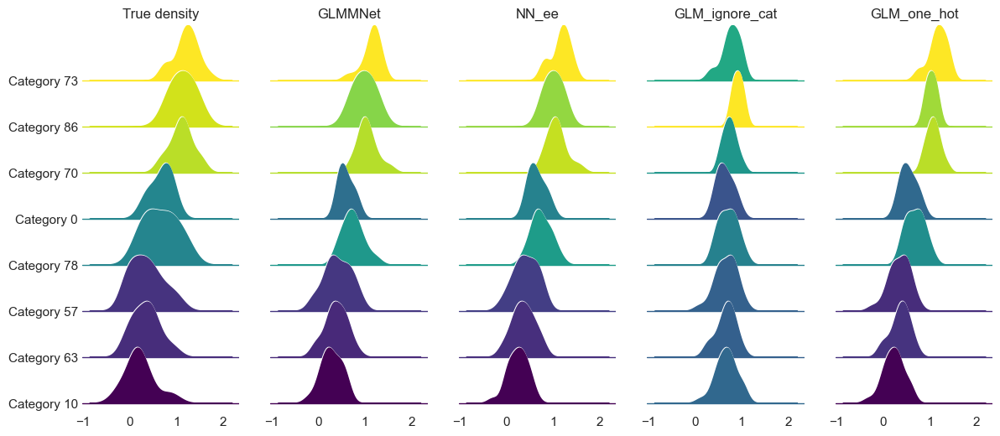

In [233]:
# To plot ridgelines, need to get the models' predictions
# Unpack data
X_train, y_train, y_true_train = sim_data["train"]
X_test, y_test, y_true_test = sim_data["test"]
Zu = sim_data["Zu"]

# Refit models
X_train_ic = ignore_cat_encoder.fit_transform(X_train)
X_test_ic = ignore_cat_encoder.transform(X_test)
GLM_ignore_cat = fitted_models["GLM_ignore_cat"]

one_hot_encoder = make_column_transformer(
    (OneHotEncoder(handle_unknown="ignore", drop="first", sparse=False), [hicard_var]),
    (MinMaxScaler(feature_range=(0, 1)), x_num), # not required for GLMs, applied here for consistency
)
X_train_ohe = one_hot_encoder.fit_transform(X_train)
X_test_ohe = one_hot_encoder.transform(X_test)
GLM_one_hot = fitted_models["GLM_one_hot"]

X_train_ct = pd.DataFrame(ct_nn.fit_transform(X_train), columns=colnames)
X_test_ct = pd.DataFrame(ct_nn.transform(X_test), columns=colnames)
X_embed_train, X_embed_test = embedding_preproc(X_train_ct, X_test_ct, [hicard_var])
NN_ee = fitted_models["NN_ee"]

one_hot = ce.OneHotEncoder(cols=[hicard_var], handle_unknown="value")
X_train_ct_ohe = one_hot.fit_transform(X_train_ct)
X_test_ct_ohe = one_hot.transform(X_test_ct)
glmmnet = fitted_models["GLMMNet"]

# To make predictions, we call the model multiple times and average the results
# This is because the random effects are sampled from the posterior (in the DenseVariational layer).
y_pred_test = predict_glmmnet(glmmnet, X_test_ct_ohe, hicard_var)

dpi = 100
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(1400/dpi, 600/dpi), dpi=dpi)

test_data = pd.concat([
    X_test.reset_index(drop=True),
    pd.DataFrame(y_test, columns=["y"]),
    pd.DataFrame(y_true_test, columns=["y_true"])], axis=1)
ranked_cats = test_data.groupby("category").mean().sort_values("y").index.to_list()
selected_cats = ranked_cats[:3] + ranked_cats[len(ranked_cats)//2:len(ranked_cats)//2+2] + ranked_cats[-3:]
p_min, p_max = y_test.min(), y_test.max()
plot_ridgeline(X_test["category"], y_test, selected_cats, axes[0], "True density")
plot_ridgeline(X_test["category"], y_pred_test, selected_cats, axes[1], "GLMMNet", ylabel=False, p_min=p_min, p_max=p_max)
NN_ee_y_pred_test = NN_ee.predict((tuple(X_embed_test), X_test_ct[x_num])).flatten()
plot_ridgeline(X_test["category"], NN_ee_y_pred_test, selected_cats, axes[2], "NN_ee", ylabel=False, p_min=p_min, p_max=p_max)
plot_ridgeline(X_test["category"], GLM_ignore_cat.predict(X_test_ic), selected_cats, axes[3], "GLM_ignore_cat", ylabel=False, p_min=p_min, p_max=p_max)
plot_ridgeline(X_test["category"], GLM_one_hot.predict(X_test_ohe), selected_cats, axes[4], "GLM_one_hot", ylabel=False, p_min=p_min, p_max=p_max)

plt.show()
# fig.savefig(f"figures/experiment_{exp_id}/ridgeline.pdf")

### Experiment #4

In [67]:
# Configure simulation parameters
exp_id = 4                         # experiment id
sig2noise = np.array([4, 1, 1])    # relative signal-to-noise of the fixed effects, random effects and irreducible error
y_dist = "gamma"                   # distribution of the response variable y
inverse_link = np.exp              # inverse of the log link
cat_dist = "balanced"              # distribution of the categorical variable
random_seed = 42 + exp_id          # random seed for reproducibility
log_plot = True                    # whether to plot the log transformed response and predictions
nn_loss = "mse"                    # loss function for the neural network (entity embedding model)

In [68]:
# Generate data
sim_data = generate_data(
    exp_id=exp_id, 
    n_train=n_train, n_val=n_val, n_test=n_test, n_categories=n_categories,
    f_structure=f_structure, signal_to_noise=sig2noise, y_dist=y_dist,
    inverse_link=inverse_link, cat_dist=cat_dist, random_state=random_seed,
    overwrite=True
)

# Unpack data
X_train, y_train, y_true_train = sim_data["train"]
X_val, y_val, y_true_val = sim_data["val"]
X_test, y_test, y_true_test = sim_data["test"]
Zu = sim_data["Zu"]

# Variable names
hicard_var = "category"
x_num = [col for col in X_train.columns if col not in hicard_var]
colnames = [hicard_var] + x_num

# Initialise
train_scores = dict()
test_scores = dict()
plots = dict()
runtimes = dict()

NameError: name 'n_val' is not defined

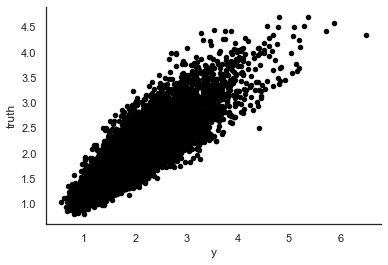

In [ ]:
# Plot y truth (i.e. the conditional mean) against y observed
# The smaller the noise component, the closer the points follow a straight line
_ = pd.DataFrame({
    "y": np.concatenate([y_train, y_val, y_test]),
    "truth": np.concatenate([y_true_train, y_true_val, y_true_test]),
}).plot.scatter(x="y", y="truth", color="black")

#### GLM

In [ ]:
ignore_cat_encoder = make_column_transformer(
    ("drop", [hicard_var]),
    (MinMaxScaler(feature_range=(0, 1)), x_num), # not required for GLMs, applied here for consistency
)
X_train_ic = ignore_cat_encoder.fit_transform(X_train)
X_val_ic = ignore_cat_encoder.transform(X_val)
X_test_ic = ignore_cat_encoder.transform(X_test)

GLM_ignore_cat = sm.GLM(y_train, X_train_ic, family=sm.families.Gamma(sm.families.links.log())).fit()
print(GLM_ignore_cat.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                 5000
Model:                            GLM   Df Residuals:                     4990
Model Family:                   Gamma   Df Model:                            9
Link Function:                    log   Scale:                        0.068469
Method:                          IRLS   Log-Likelihood:                -3516.2
Date:                Tue, 11 Oct 2022   Deviance:                       333.41
Time:                        21:49:12   Pearson chi2:                     342.
No. Iterations:                     9   Pseudo R-squ. (CS):             0.4408
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1             0.3289      0.012     27.191      0.0

In [ ]:
# Evaluate model performance
gamma_shape = 1 / GLM_ignore_cat.scale
# Training set
print("> In-sample performance")
train_scores["GLM_ignore_cat"] = evaluate_model(
    GLM_ignore_cat, X_train_ic, y_train, categories=X_train[hicard_var], 
    likelihood=y_dist, gamma_shape=gamma_shape
)
pp.pprint(train_scores["GLM_ignore_cat"])

# Validation set
print("-" * 80)
print("> Out-of-sample performance")
test_scores["GLM_ignore_cat"] = evaluate_model(
    GLM_ignore_cat, X_val_ic, y_val, categories=X_val[hicard_var],
    likelihood=y_dist, gamma_shape=gamma_shape
)
pp.pprint(test_scores["GLM_ignore_cat"])

> Training performance
{'CRPS': 0.28915148173558475,
 'MAE': 0.408261647347078,
 'R2': 0.347097453777367,
 'RMSE': 0.5370080358508067,
 'RMSE_avg': 0.3330340208609986,
 'RMSE_avg_weighted': 0.33458865282782524}
--------------------------------------------------------------------------------
> Validation performance
{'CRPS': 0.29564458654027803,
 'MAE': 0.41949737249533553,
 'R2': 0.30986154872158733,
 'RMSE': 0.5479853577105398,
 'RMSE_avg': 0.36077192710324835,
 'RMSE_avg_weighted': 0.3616474415244588}


In [ ]:
p = plot_from_model(GLM_ignore_cat, X_train_ic, y_true_train, X_val_ic, y_true_val, log_scale=log_plot)

In [ ]:
one_hot_encoder = make_column_transformer(
    (OneHotEncoder(handle_unknown="ignore", drop="first", sparse=False), [hicard_var]),
    (MinMaxScaler(feature_range=(0, 1)), x_num), # not required for GLMs, applied here for consistency
)
X_train_ohe = one_hot_encoder.fit_transform(X_train)
X_val_ohe = one_hot_encoder.transform(X_val)
X_test_ohe = one_hot_encoder.transform(X_test)

GLM_one_hot = sm.GLM(y_train, X_train_ohe, family=sm.families.Gamma(sm.families.links.log())).fit()
print(GLM_one_hot.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                 5000
Model:                            GLM   Df Residuals:                     4891
Model Family:                   Gamma   Df Model:                          108
Link Function:                    log   Scale:                        0.040184
Method:                          IRLS   Log-Likelihood:                -2199.0
Date:                Tue, 11 Oct 2022   Deviance:                       197.83
Time:                        21:49:19   Pearson chi2:                     197.
No. Iterations:                    10   Pseudo R-squ. (CS):             0.8108
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1            -0.1256      0.036     -3.508      0.0

In [ ]:
# Evaluate model performance
gamma_shape_glmohe = 1 / GLM_one_hot.scale

# Training set
print("> In-sample performance")
train_scores["GLM_one_hot"] = evaluate_model(
    GLM_one_hot, X_train_ohe, y_train, categories=X_train[hicard_var],
    likelihood=y_dist, gamma_shape=gamma_shape_glmohe
)
pp.pprint(train_scores["GLM_one_hot"])

# Validation set
print("-" * 80)
print("> Out-of-sample performance")
test_scores["GLM_one_hot"] = evaluate_model(
    GLM_one_hot, X_val_ohe, y_val, categories=X_val[hicard_var],
    likelihood=y_dist, gamma_shape=gamma_shape_glmohe
)
pp.pprint(test_scores["GLM_one_hot"])

> Training performance
{'CRPS': 0.2226941203750447,
 'MAE': 0.3147176703563337,
 'R2': 0.6113069877728536,
 'RMSE': 0.41434296548217886,
 'RMSE_avg': 0.01737109265055439,
 'RMSE_avg_weighted': 0.017540640025056203}
--------------------------------------------------------------------------------
> Validation performance
{'CRPS': 0.22548370319086572,
 'MAE': 0.318735638857543,
 'R2': 0.5982299077677958,
 'RMSE': 0.41810912327166094,
 'RMSE_avg': 0.10346125163973023,
 'RMSE_avg_weighted': 0.10477531577851726}


In [ ]:
p = plot_from_predictions(
    GLM_one_hot.predict(X_train_ohe), y_true_train,
    GLM_one_hot.predict(X_val_ohe), y_true_val,
    log_scale=log_plot)

In [ ]:
# Apply a cross-validated version of GLMM encoding
# Docs: https://contrib.scikit-learn.org/category_encoders/
GLMM_encoder = make_column_transformer(
    # https://contrib.scikit-learn.org/category_encoders/wrapper.html
    (NestedCVWrapper(ce.glmm.GLMMEncoder(), cv=KFold(n_splits=5)), [hicard_var]),
    (MinMaxScaler(feature_range=(0, 1)), x_num), # not required for GLMs, applied here for consistency
)
X_train_GLMM_enc = GLMM_encoder.fit_transform(X_train, y_train)
X_val_GLMM_enc = GLMM_encoder.transform(X_val)
X_test_GLMM_enc = GLMM_encoder.transform(X_test)

GLM_GLMM_enc = sm.GLM(y_train, X_train_GLMM_enc, family=sm.families.Gamma(sm.families.links.log())).fit()
print(GLM_GLMM_enc.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                 5000
Model:                            GLM   Df Residuals:                     4989
Model Family:                   Gamma   Df Model:                           10
Link Function:                    log   Scale:                        0.042126
Method:                          IRLS   Log-Likelihood:                -2363.0
Date:                Tue, 11 Oct 2022   Deviance:                       211.20
Time:                        21:49:32   Pearson chi2:                     210.
No. Iterations:                     9   Pseudo R-squ. (CS):             0.7824
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1             0.4731      0.009     53.578      0.0

In [ ]:
# Plot GLMM encodings vs true random effects
p = bop.figure(title="GLMM Encodings", x_axis_label="Ground truth", y_axis_label="GLMM encodings", width=400, height=300)
p.add_layout(bom.Title(text="Model: GLMM encodings", text_font_style="italic"), "above")
GLMM_encodings = GLMM_encoder.named_transformers_["nestedcvwrapper"].transform(X_train[hicard_var])
p.circle(Zu[:n_train], GLMM_encodings.values.ravel(), color="#9f86c0")
p.add_layout(bom.Slope(gradient=1, y_intercept=0, line_color="black", line_width=2))
bop.show(p)

Note that the deviation from the $y=x$ line is due to that the GLMM encodings are based on a linear mixed model (i.e. assuming y ~ Gaussian) while in reality the RE are on the log scale of the response. This should be easily handled by the subsequent GLM (or other models) by applying a scaled coefficient to the encoded feature.

In [ ]:
# Evaluate model performance
gamma_shape = 1 / GLM_GLMM_enc.scale

# Training set
print("> In-sample performance")
train_scores["GLM_GLMM_enc"] = evaluate_model(
    GLM_GLMM_enc, X_train_GLMM_enc, y_train, categories=X_train[hicard_var],
    likelihood=y_dist, gamma_shape=gamma_shape
)
pp.pprint(train_scores["GLM_GLMM_enc"])

# Validation set
print("-" * 80)
print("> Out-of-sample performance")
test_scores["GLM_GLMM_enc"] = evaluate_model(
    GLM_GLMM_enc, X_val_GLMM_enc, y_val, categories=X_val[hicard_var],
    likelihood=y_dist, gamma_shape=gamma_shape
)
pp.pprint(test_scores["GLM_GLMM_enc"])

> Training performance
{'CRPS': 0.22987468570826863,
 'MAE': 0.3245293313645875,
 'R2': 0.5873090739271918,
 'RMSE': 0.4269421801608813,
 'RMSE_avg': 0.06155061712054972,
 'RMSE_avg_weighted': 0.06132045656800228}
--------------------------------------------------------------------------------
> Validation performance
{'CRPS': 0.2302287718869978,
 'MAE': 0.32572191630063196,
 'R2': 0.5795572324999914,
 'RMSE': 0.4277148064898211,
 'RMSE_avg': 0.1345250288124408,
 'RMSE_avg_weighted': 0.1360378213112483}


In [ ]:
p = plot_from_predictions(
    GLM_GLMM_enc.predict(X_train_GLMM_enc), y_true_train,
    GLM_GLMM_enc.predict(X_val_GLMM_enc), y_true_val,
    log_scale=log_plot)

#### GBM

In [ ]:
GBM = xgb.XGBRegressor(n_jobs=-1, learning_rate=0.1, max_depth=2, random_state=random_seed)
GBM_ignore_cat = make_pipeline(ignore_cat_encoder, GBM)
GBM_ignore_cat.fit(X_train, y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('drop', 'drop', ['category']),
                                                 ('minmaxscaler',
                                                  MinMaxScaler(),
                                                  ['X1', 'X2', 'X3', 'X4', 'X5',
                                                   'X6', 'X7', 'X8', 'X9',
                                                   'X10'])])),
                ('xgbregressor',
                 XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
                              colsample_bylevel=1, colsample_bynode=1,
                              colsample_bytree=1, early_stopping_rounds=None,
                              ena...
                              gamma=0, gpu_id=-1, grow_policy='depthwise',
                              importance_type=None, interaction_constraints='',
                              learning_rate=0.1, max_bin=256,
                              max_cat_to_onehot=4, max_delta_step=0,
                              max_depth=2, max_leaves=0, min_child_weight=1,
                              missing=nan, monotone_constraints='()',
                              n_estimators=100, n_jobs=-1, num_parallel_tree=1,
                              predictor='auto', random_state=46, reg_alpha=0,
                              reg_lambda=1, ...))])

In [ ]:
print("> In-sample performance")
train_scores["GBM_ignore_cat"] = evaluate_model(GBM_ignore_cat, X_train, y_train, categories=X_train[hicard_var], likelihood=y_dist)
pp.pprint(train_scores["GBM_ignore_cat"])

print("-" * 80)
print("> Out-of-sample performance")
test_scores["GBM_ignore_cat"] = evaluate_model(GBM_ignore_cat, X_val, y_val, categories=X_val[hicard_var], likelihood=y_dist)
pp.pprint(test_scores["GBM_ignore_cat"])

> Training performance
{'CRPS': 0.30744046939036196,
 'MAE': 0.3674498234405975,
 'R2': 0.4737521627275184,
 'RMSE': 0.4821162450893754,
 'RMSE_avg': 0.3190127784828531,
 'RMSE_avg_weighted': 0.32073016284180567}
--------------------------------------------------------------------------------
> Validation performance
{'CRPS': 0.3265042919964867,
 'MAE': 0.39616147754367914,
 'R2': 0.3932321284045921,
 'RMSE': 0.5138213313967205,
 'RMSE_avg': 0.3600840616154873,
 'RMSE_avg_weighted': 0.36155578991942555}


In [ ]:
p = plot_from_model(GBM_ignore_cat, X_train, y_true_train, X_val, y_true_val, log_scale=log_plot)

In [ ]:
GBM_one_hot = make_pipeline(one_hot_encoder, GBM)
GBM_one_hot.fit(X_train, y_train)

print("> In-sample performance")
train_scores["GBM_one_hot"] = evaluate_model(GBM_one_hot, X_train, y_train, categories=X_train[hicard_var], likelihood=y_dist)
pp.pprint(train_scores["GBM_one_hot"])

print("-" * 80)
print("> Out-of-sample performance")
test_scores["GBM_one_hot"] = evaluate_model(GBM_one_hot, X_val, y_val, categories=X_val[hicard_var], likelihood=y_dist)
pp.pprint(test_scores["GBM_one_hot"])

> Training performance
{'CRPS': 0.2806551479306672,
 'MAE': 0.3402467800144793,
 'R2': 0.563908961417455,
 'RMSE': 0.43887938791331643,
 'RMSE_avg': 0.22919633499991754,
 'RMSE_avg_weighted': 0.22905540683223619}
--------------------------------------------------------------------------------
> Validation performance
{'CRPS': 0.29715011138940817,
 'MAE': 0.36067946512966065,
 'R2': 0.49954635201225894,
 'RMSE': 0.46664086814777944,
 'RMSE_avg': 0.2724262518674889,
 'RMSE_avg_weighted': 0.27284771251282064}


In [ ]:
p = plot_from_model(GBM_one_hot, X_train, y_true_train, X_val, y_true_val, log_scale=log_plot)

In [ ]:
# Apply a cross-validated version of GLMM encoding
GBM_GLMM_enc = make_pipeline(GLMM_encoder, GBM)
GBM_GLMM_enc.fit(X_train, y_train)

print("> In-sample performance")
train_scores["GBM_GLMM_enc"] = evaluate_model(GBM_GLMM_enc, X_train, y_train, categories=X_train[hicard_var], likelihood=y_dist)
pp.pprint(train_scores["GBM_GLMM_enc"])

print("-" * 80)
print("> Out-of-sample performance")
test_scores["GBM_GLMM_enc"] = evaluate_model(GBM_GLMM_enc, X_val, y_val, categories=X_val[hicard_var], likelihood=y_dist)
pp.pprint(test_scores["GBM_GLMM_enc"])

> Training performance
{'CRPS': 0.23274987532803948,
 'MAE': 0.2797536713716608,
 'R2': 0.698584278086432,
 'RMSE': 0.36487117409739933,
 'RMSE_avg': 0.06643856430424422,
 'RMSE_avg_weighted': 0.06539206224501237}
--------------------------------------------------------------------------------
> Validation performance
{'CRPS': 0.24667049267408678,
 'MAE': 0.2954865166099044,
 'R2': 0.6539325979117833,
 'RMSE': 0.3880441924655459,
 'RMSE_avg': 0.13213825197512366,
 'RMSE_avg_weighted': 0.13286693162725208}


In [ ]:
p = plot_from_model(GBM_GLMM_enc, X_train, y_true_train, X_val, y_true_val, log_scale=log_plot)

#### NN with Entity Embeddings

In [70]:
# Preprocess the data
ct_nn = make_column_transformer(
    (OrdinalEncoder(handle_unknown="use_encoded_value", unknown_value=np.nan, encoded_missing_value=-1), [hicard_var]),
    (MinMaxScaler(feature_range=(0, 1)), x_num),
)
X_train_ct = ct_nn.fit_transform(X_train)
X_test_ct = ct_nn.transform(X_test)

# Convert to dataframes
colnames = [hicard_var] + x_num
X_train_ct = pd.DataFrame(X_train_ct, columns=colnames)
X_test_ct = pd.DataFrame(X_test_ct, columns=colnames)

# Convert dataframe to lists to feed into Keras model
X_embed_train, X_embed_test = embedding_preproc(X_train_ct, X_test_ct, [hicard_var])

In [ ]:
# Use multi-GPU to speed up training
# Code adapted from: https://www.kdnuggets.com/2020/03/tensorflow-optimizing-training-time-performance.html
# Also referenced https://stackoverflow.com/questions/65322700/tensorflow-keras-consider-either-turning-off-auto-sharding-or-switching-the-a

# Define multi-GPU strategy
mirrored_strategy = tf.distribute.MirroredStrategy()
# Define training parameters
epochs = 500
patience = 10
# Update batch size value
batch_size = 256
batch_size *= mirrored_strategy.num_replicas_in_sync
# Create strategy scope to perform training
with mirrored_strategy.scope():
    NN_ee = build_baseline_nn(X_train_ct, objective=nn_loss, random_state=random_seed)

es = EarlyStopping(patience=patience, restore_best_weights=True, monitor="val_loss", verbose=2)
checkpoint_filepath = f"models/experiment_{exp_id}/checkpoint"
mc = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor="val_loss",
    mode="min",
    save_best_only=True)

# Wrap data in Dataset objects
train_data = tf.data.Dataset.from_tensor_slices(((tuple(X_embed_train), X_train_ct[x_num]), y_train))
val_data = tf.data.Dataset.from_tensor_slices(((tuple(X_embed_val), X_val_ct[x_num]), y_val))
test_data = tf.data.Dataset.from_tensor_slices(((tuple(X_embed_test), X_test_ct[x_num]), y_test))

# The batch size must now be set on the Dataset objects
train_data = train_data.batch(batch_size)
val_data = val_data.batch(batch_size)
test_data = test_data.batch(batch_size)

# Disable AutoShard
options = tf.data.Options()
options.experimental_distribute.auto_shard_policy = tf.data.experimental.AutoShardPolicy.OFF
train_data = train_data.with_options(options)
val_data = val_data.with_options(options)
test_data = test_data.with_options(options)

In [ ]:
hist = NN_ee.fit(train_data, validation_data=val_data, epochs=epochs, callbacks=[es, mc], verbose=0)
hist = hist.history
# Save model and history
NN_ee.save(f"models/experiment_{exp_id}/NN_ee.h5")
np.save(f"models/experiment_{exp_id}/NN_ee.npy", hist)

Restoring model weights from the end of the best epoch: 49.
Epoch 59: early stopping


In [ ]:
plot_loss_curves(hist)

Figure(id='45730', ...)

In [ ]:
print("> In-sample performance")
train_scores["NN_ee"] = evaluate_model(
    NN_ee, train_data, y_train, categories=X_train[hicard_var], likelihood=y_dist
)
pp.pprint(train_scores["NN_ee"])

print("-" * 80)
print("> Out-of-sample performance")
test_scores["NN_ee"] = evaluate_model(
    NN_ee, val_data, y_val, categories=X_val[hicard_var], likelihood=y_dist
)
pp.pprint(test_scores["NN_ee"])

> Training performance
40/40 [==============================] - 2s 8ms/step
{'CRPS': 0.2191372495728545,
 'MAE': 0.26720025490776744,
 'R2': 0.7336524579282684,
 'RMSE': 0.34298959872087553,
 'RMSE_avg': 0.06993979770384305,
 'RMSE_avg_weighted': 0.0696584972024073}
--------------------------------------------------------------------------------
> Validation performance
20/20 [==============================] - 0s 5ms/step
{'CRPS': 0.24324957974575337,
 'MAE': 0.2976187608506842,
 'R2': 0.6631192455982551,
 'RMSE': 0.3828590718896372,
 'RMSE_avg': 0.12828349392049276,
 'RMSE_avg_weighted': 0.1310324082708678}


In [ ]:
p = plot_from_predictions(
    y_pred_train=NN_ee.predict(train_data).flatten(),
    y_train=y_true_train,
    y_pred_val=NN_ee.predict(val_data).flatten(),
    y_val=y_true_val,
    log_scale=log_plot,
)

20/20 [==============================] - 0s 4ms/step


In [ ]:
# Extract embeddings from the fitted neural network model
embeddings = NN_ee.get_layer(f"{hicard_var}_embed").get_weights()[0]
embeddings = pd.DataFrame(embeddings, columns=["embedding_" + str(i) for i in range(embeddings.shape[1])])
oe = ct_nn.named_transformers_["ordinalencoder"]
categories = oe.categories_[0]
embeddings = pd.concat([pd.DataFrame(categories, columns=["category"]), embeddings], axis=1)
embeddings

,category,embedding_0,embedding_1,embedding_2
0,0,0.024026,0.033649,-0.065832
1,1,-0.051872,-0.085014,0.135854
2,2,0.009230,0.069078,0.093159
3,3,0.196168,-0.194144,-0.145461
4,4,-0.116517,0.037550,0.109800
...,...,...,...,...
95,95,0.139517,-0.257554,-0.087333
96,96,0.033417,-0.092038,0.139880
97,97,0.009660,-0.044452,0.081439
98,98,-0.005270,0.031654,0.077938


#### GBM with Entity Embeddings

In [ ]:
X_train_ee = pd.merge(X_train_ct, embeddings, on="category", how="left").drop("category", axis=1)
X_val_ee = pd.merge(X_val_ct, embeddings, on="category", how="left").drop("category", axis=1)
X_test_ee = pd.merge(X_test_ct, embeddings, on="category", how="left").drop("category", axis=1)

In [ ]:
GBM_ee = xgb.XGBRegressor(n_jobs=-1, learning_rate=0.1, max_depth=2, random_state=random_seed)
GBM_ee.fit(X_train_ee, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.1, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=2, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=100,
             n_jobs=-1, num_parallel_tree=1, predictor='auto', random_state=46,
             reg_alpha=0, reg_lambda=1, ...)

In [ ]:
print("> In-sample performance")
train_scores["GBM_ee"] = evaluate_model(GBM_ee, X_train_ee, y_train, categories=X_train[hicard_var], likelihood=y_dist)
pp.pprint(train_scores["GBM_ee"])

print("-" * 80)
print("> Out-of-sample performance")
test_scores["GBM_ee"] = evaluate_model(GBM_ee, X_val_ee, y_val, categories=X_val[hicard_var], likelihood=y_dist)
pp.pprint(test_scores["GBM_ee"])

> Training performance
{'CRPS': 0.23170832295085994,
 'MAE': 0.2778299590639283,
 'R2': 0.7012489347002419,
 'RMSE': 0.3632547774262138,
 'RMSE_avg': 0.05878280298660073,
 'RMSE_avg_weighted': 0.05858514449612233}
--------------------------------------------------------------------------------
> Validation performance
{'CRPS': 0.24623953323656306,
 'MAE': 0.2948372436481415,
 'R2': 0.6553544195620875,
 'RMSE': 0.38724623013983384,
 'RMSE_avg': 0.12416148025416719,
 'RMSE_avg_weighted': 0.12501098784389666}


#### (Generalised) Linear Mixed Effects Models

In [ ]:
print("Please pause and run R script to generate the results required.")
print("Remember to update the parameters in the R script to match the current settings.")

Please pause and run R script to generate the results required.
Remember to update the parameters in the R script to match the current settings.


In [ ]:
y_pred_train_brms = pd.read_csv(f"models/experiment_{exp_id}/brms_pred_train.csv").values.reshape(-1)
y_pred_val_brms = pd.read_csv(f"models/experiment_{exp_id}/brms_pred_val.csv").values.reshape(-1)
re_brms = pd.read_csv(f"models/experiment_{exp_id}/brms_re.csv").values.reshape(-1)
sigma_brms = pd.read_csv(f"models/experiment_{exp_id}/brms_sigma.csv").values.reshape(-1)

In [ ]:
print(sigma_brms)

[24.92924567]


In [ ]:
# Evaluate model performance
# Training set
print("> In-sample performance")
train_scores["GLMM"] = evaluate_predictions(
    y_train, y_pred_train_brms, categories=X_train[hicard_var], likelihood=y_dist,
    shape=sigma_brms, scale=y_pred_train_brms / sigma_brms
)
pp.pprint(train_scores["GLMM"])

# Validation set
print("-" * 80)
print("> Out-of-sample performance")
test_scores["GLMM"] = evaluate_predictions(
    y_val, y_pred_val_brms, categories=X_val[hicard_var], likelihood=y_dist,
    shape=sigma_brms, scale=y_pred_val_brms / sigma_brms
)
pp.pprint(test_scores["GLMM"])

> Training performance
{'CRPS': 0.22269028211764152,
 'MAE': 0.31466346020668506,
 'R2': 0.6113141474421664,
 'RMSE': 0.41433914939572686,
 'RMSE_avg': 0.016839443312501378,
 'RMSE_avg_weighted': 0.016783196766620035}
--------------------------------------------------------------------------------
> Validation performance
{'CRPS': 0.22590238547447908,
 'MAE': 0.31927146347224844,
 'R2': 0.596824636189032,
 'RMSE': 0.4188396953091608,
 'RMSE_avg': 0.10579443098582278,
 'RMSE_avg_weighted': 0.10679628548373278}


In [ ]:
p = plot_from_predictions(y_pred_train_brms, y_true_train, y_pred_val_brms, y_true_val, log_scale=log_plot)

In [ ]:
p = bop.figure(title="Random Effects Predictions", x_axis_label="Ground truth", y_axis_label="Predictions", width=400, height=400)
p.add_layout(bom.Title(text="Model: GLMM", text_font_style="italic"), "above")
rev = np.array([float(re_brms[g]) for g in X_train[hicard_var]])
p.circle(Zu[:n_train], rev, color="#9f86c0")
p.add_layout(bom.Slope(gradient=1, y_intercept=0, line_color="black", line_width=2))
bop.show(p)

#### GPBoost

In [ ]:
print("Please pause and run R script to generate the results required.")
print("Remember to update the parameters in the R script to match the current settings.")

Please pause and run R script to generate the results required.
Remember to update the parameters in the R script to match the current settings.


In [ ]:
y_pred_train_gpb = pd.read_csv(f"models/experiment_{exp_id}/gpboost_pred_train.csv").values.reshape(-1)
y_pred_val_gpb = pd.read_csv(f"models/experiment_{exp_id}/gpboost_pred_val.csv").values.reshape(-1)
re_gpb = pd.read_csv(f"models/experiment_{exp_id}/gpboost_re.csv").values.reshape(-1)
scale_gpb = pd.read_csv(f"models/experiment_{exp_id}/gpboost_scale.csv").values.reshape(-1)

In [ ]:
# Evaluate model performance
# Training set
print("> In-sample performance")
train_scores["GPBoost"] = evaluate_predictions(
    y_train, y_pred_train_gpb, categories=X_train[hicard_var], likelihood=y_dist,
)
pp.pprint(train_scores["GPBoost"])

# Validation set
print("-" * 80)
print("> Out-of-sample performance")
test_scores["GPBoost"] = evaluate_predictions(
    y_val, y_pred_val_gpb, categories=X_val[hicard_var], likelihood=y_dist,
)
pp.pprint(test_scores["GPBoost"])

> Training performance
{'CRPS': 0.28513525704713033,
 'MAE': 0.34181750959356716,
 'R2': 0.5481861464559082,
 'RMSE': 0.44672100639895446,
 'RMSE_avg': 0.2470627663640514,
 'RMSE_avg_weighted': 0.24732099813786482}
--------------------------------------------------------------------------------
> Validation performance
{'CRPS': 0.29396107377931746,
 'MAE': 0.35335998388091794,
 'R2': 0.5090738186663628,
 'RMSE': 0.4621776485426901,
 'RMSE_avg': 0.27772084744497344,
 'RMSE_avg_weighted': 0.2788499430702469}


In [ ]:
p = plot_from_predictions(y_pred_train_gpb, y_true_train, y_pred_val_gpb, y_true_val, log_scale=log_plot)

In [ ]:
p = bop.figure(title="Random Effects Predictions", x_axis_label="Ground truth", y_axis_label="Predictions", width=400, height=400)
p.add_layout(bom.Title(text="Model: GPBoost", text_font_style="italic"), "above")
p.circle(Zu[:n_train], re_gpb, color="#9f86c0")
p.add_layout(bom.Slope(gradient=1, y_intercept=0, line_color="black", line_width=2))
bop.show(p)

#### GLMMNet

In [ ]:
tf.random.set_seed(42)

# Construct a standard FFNN for the fixed effects
num_inputs = layers.Input(shape=(len(x_num),), name="numeric_inputs")
hidden_units = [64, 32, 16]
hidden_activation = "relu"
x = num_inputs
for hidden_layer in range(len(hidden_units)):
    units = hidden_units[hidden_layer]
    x = layers.Dense(units=units, activation=hidden_activation, name=f"hidden_{hidden_layer + 1}")(x)
f_X = layers.Dense(units=1, activation="linear", name="f_X")(x)

# Deal with categorical inputs (random effects)
cat_inputs = layers.Input(shape=(1,), name=f"category_inputs")
# Ordinal to one-hot encoded matrix
# Ref: https://keras.io/guides/preprocessing_layers/#encoding-integer-categorical-features-via-onehot-encoding
cardinality = int(np.ceil(X_train[hicard_var].nunique()))
one_hot = layers.CategoryEncoding(num_tokens=cardinality, output_mode="one_hot", name="OHE")(cat_inputs)
# Construct the random effects, by variational inference
# Code adapted from https://www.tensorflow.org/probability/examples/Probabilistic_Layers_Regression
# Specify the surrogate posterior over the random effects
def posterior_u(kernel_size, bias_size=0, dtype=None):
  n = kernel_size + bias_size
  c = np.log(np.expm1(1.)) # Inverse of softplus(1.)
  return tf.keras.Sequential([
      tfp.layers.VariableLayer(2 * n, dtype=dtype, initializer="random_normal"),
      tfp.layers.DistributionLambda(lambda t: tfd.Independent(
          tfd.Normal(loc=t[..., :n],
          # CHANGE HERE - forcing a smaller scale parameter improves the result & eliminates training outliers
                     scale=0.01 * tf.nn.softplus(c + t[..., n:])),
          reinterpreted_batch_ndims=1)),
  ])
# Specify the prior over the random effects
def prior_trainable(kernel_size, bias_size=0, dtype=None):
  n = kernel_size + bias_size
  c = np.log(np.expm1(1.)) # Inverse of softplus()
  return tf.keras.Sequential([
      tfp.layers.VariableLayer(1, dtype=dtype, initializer="random_normal"),
      tfp.layers.DistributionLambda(lambda t: tfd.Independent(
          tfd.Normal(loc=tf.zeros(n), scale=tf.nn.softplus(c + t)),
          reinterpreted_batch_ndims=1)),
  ])
def prior_fixed(kernel_size, bias_size=0, dtype=None):
    n = kernel_size + bias_size
    return lambda t: tfd.Independent(
        tfd.Normal(loc=tf.zeros(n), scale=0.1 * tf.ones(n)), 
        reinterpreted_batch_ndims=1
    )
RE = tfp.layers.DenseVariational(
    units=1, 
    make_posterior_fn=posterior_u,
    make_prior_fn=prior_trainable, # switching between the two doesn't really make a difference
    # make_prior_fn=prior_fixed,
    kl_weight=1 / X_train.shape[0], # https://github.com/tensorflow/probability/issues/396
                                    # https://github.com/tensorflow/probability/issues/691
    use_bias=False,
    name="RE",)(one_hot)

# Add the RE to the f(X) output
eta = layers.Add(name="f_X_plus_RE")([f_X, RE])
# Compute the distributional parameters
dist_params = DistParams(
    inverse_link="exp", # <--- CHANGE FROM EXPERIMENTS 1-3
    phi_init=0.1,
    name="dist_params",)(eta)
# Construct the distribution output
output = tfp.layers.DistributionLambda(
    lambda t: tfd.Gamma(                    # https://www.tensorflow.org/probability/api_docs/python/tfp/distributions/Gamma
        concentration=1 / t[..., 1:],       # concentration = shape = 1 / dispersion
        rate=(1 / t[..., 1:]) / t[..., :1], # rate = shape / location
    ), name="distribution")(dist_params)
# targets = layers.Input(shape=(1,), name="targets")
glmmnet = models.Model(inputs=[num_inputs, cat_inputs], outputs=output)

def NLL(y_true, y_dist_pred):
    return -y_dist_pred.log_prob(y_true)

glmmnet.compile(optimizer="adam", loss=NLL)
es = EarlyStopping(patience=50, restore_best_weights=True, monitor="val_loss", verbose=2)
hist = glmmnet.fit(
    (X_train_ct[x_num], X_train_ct[hicard_var]), y_train, 
    validation_data=((X_val_ct[x_num], X_val_ct[hicard_var]), y_val),
    callbacks=[es],
    # note: batch_size = 128 (128 or 256 doesn't make a difference, but 256 is faster)
    batch_size=256, epochs=500, verbose=False)

plot_loss_curves(hist.history)

Restoring model weights from the end of the best epoch: 82.
Epoch 132: early stopping


Figure(id='55894', ...)

In [ ]:
# Examine the trained parameters
dummy_input = tf.constant(0.) # doesn't matter what this is
model_prior = glmmnet.get_layer("RE")._prior(dummy_input)
model_posterior = glmmnet.get_layer("RE")._posterior(dummy_input)

print("Prior mean:     ", model_prior.mean().numpy()[0])
print("Prior variance: ", model_prior.variance().numpy()[0])
print("Posterior mean: ")
print(model_posterior.mean().numpy())
print("Posterior variance: " )
print(model_posterior.variance().numpy())

# Get the dispersion parameter (here the error variance)
sigma_e = glmmnet.get_layer("dist_params").get_weights()
print(f"Estimated sigma_e: {sigma_e[0][0]:.8f}")

Prior mean:      0.0
Prior variance:  0.08119247
Posterior mean: 
[ 0.05190042 -0.1451557  -0.13761172  0.3209821  -0.28553173 -0.40204427
 -0.00552137  0.00565597 -0.10200974  0.18553454 -0.04216079  0.051553
  0.03363044  0.1336176   0.17019896 -0.16744648 -0.09046458  0.13525629
 -0.09852304 -0.1944769  -0.1169618  -0.16731302 -0.04809007  0.05245873
  0.0571377   0.15702696  0.00303821 -0.12112039  0.13072574 -0.21409397
 -0.10331612  0.31316268 -0.05532744 -0.00884895  0.11846896 -0.06488646
  0.01862879 -0.18463953  0.04434721 -0.01176899 -0.03568089  0.33485374
  0.13755493 -0.10925759 -0.15971781  0.23362145  0.11634038  0.18024427
  0.38149893 -0.04786948 -0.2413127  -0.18080601 -0.32014224 -0.01340813
 -0.12957901 -0.2144175  -0.07350782  0.1044419   0.04919589 -0.07037791
 -0.0078675  -0.13147481 -0.30707568 -0.12793778  0.08432389 -0.12420586
  0.27128777 -0.05191234 -0.40232933  0.01349266  0.20235741  0.09219883
 -0.15815565  0.20725495 -0.14198944 -0.29233122 -0.10465377

In [ ]:
# To make predictions, we call the model multiple times and average the results
# This is because the random effects are sampled from the posterior (in the DenseVariational layer).
n_prediction_samples = 100
y_pred_train = np.zeros((X_train_ct.shape[0], n_prediction_samples))
y_pred_val = np.zeros((X_val_ct.shape[0], n_prediction_samples))
for i in range(n_prediction_samples):
    y_pred_train[:, i] = glmmnet((
        tf.convert_to_tensor(X_train_ct[x_num]), 
        tf.convert_to_tensor(X_train_ct[hicard_var]))).mean().numpy().flatten()
    y_pred_val[:, i] = glmmnet((
        tf.convert_to_tensor(X_val_ct[x_num]),
        tf.convert_to_tensor(X_val_ct[hicard_var]))).mean().numpy().flatten()
y_pred_train = y_pred_train.mean(axis=1)
y_pred_val = y_pred_val.mean(axis=1)

p = plot_from_predictions(y_pred_train, y_true_train, y_pred_val, y_true_val, log_scale=log_plot)

In [ ]:
# Evaluate model performance
# Training set
print("> In-sample performance")
train_scores["GLMMNet"] = evaluate_predictions(
    y_train, y_pred_train, categories=X_train[hicard_var], likelihood=y_dist,
    gamma_shape=1 / sigma_e[0][0]
)
pp.pprint(train_scores["GLMMNet"])

# Validation set
print("-" * 80)
print("> Out-of-sample performance")
test_scores["GLMMNet"] = evaluate_predictions(
    y_val, y_pred_val, categories=X_val[hicard_var], likelihood=y_dist,
    gamma_shape=1 / sigma_e[0][0]
)
pp.pprint(test_scores["GLMMNet"])

> Training performance
{'CRPS': 0.17955639058687656,
 'MAE': 0.2524599202851998,
 'R2': 0.7505259356784292,
 'RMSE': 0.33194742545002043,
 'RMSE_avg': 0.04417752429923561,
 'RMSE_avg_weighted': 0.04399132559279568}
--------------------------------------------------------------------------------
> Validation performance
{'CRPS': 0.19459450260901018,
 'MAE': 0.2757236195118603,
 'R2': 0.7061091402306386,
 'RMSE': 0.3575970121257904,
 'RMSE_avg': 0.0936446564094999,
 'RMSE_avg_weighted': 0.09281512099022203}


In [ ]:
p = bop.figure(title="Random Effects Predictions", x_axis_label="Ground truth", y_axis_label="Predictions", width=400, height=400)
p.add_layout(bom.Title(text="Model: GLMMNet", text_font_style="italic"), "above")
# Get the posterior mean of the random effects
u_hat = glmmnet.get_layer("RE").weights[0][:cardinality]
re_glmmnet = tf.gather(u_hat, X_train_ct[hicard_var].astype("int")).numpy()
p.circle(Zu[:n_train], re_glmmnet, color="#9f86c0")
p.add_layout(bom.Slope(gradient=1, y_intercept=0, line_color="black", line_width=2))
bop.show(p)

#### Comparison of Models for Experiment #4

In [ ]:
with pd.option_context("display.float_format", "{:.4f}".format):
    display(pd.DataFrame(train_scores).transpose())
    display(pd.DataFrame(test_scores).transpose())

,MAE,RMSE,R2,RMSE_avg,RMSE_avg_weighted,CRPS
GLM_ignore_cat,0.4083,0.5370,0.3471,0.3330,0.3346,0.2892
GLM_one_hot,0.3147,0.4143,0.6113,0.0174,0.0175,0.2227
GLM_GLMM_enc,0.3245,0.4269,0.5873,0.0616,0.0613,0.2299
GBM_ignore_cat,0.3674,0.4821,0.4738,0.3190,0.3207,0.3074
GBM_one_hot,0.3402,0.4389,0.5639,0.2292,0.2291,0.2807
GBM_GLMM_enc,0.2798,0.3649,0.6986,0.0664,0.0654,0.2327
NN_ee,0.2672,0.3430,0.7337,0.0699,0.0697,0.2191
GBM_ee,0.2778,0.3633,0.7012,0.0588,0.0586,0.2317
GLMM,0.3147,0.4143,0.6113,0.0168,0.0168,0.2227
GPBoost,0.3418,0.4467,0.5482,0.2471,0.2473,0.2851


,MAE,RMSE,R2,RMSE_avg,RMSE_avg_weighted,CRPS
GLM_ignore_cat,0.4195,0.5480,0.3099,0.3608,0.3616,0.2956
GLM_one_hot,0.3187,0.4181,0.5982,0.1035,0.1048,0.2255
GLM_GLMM_enc,0.3257,0.4277,0.5796,0.1345,0.1360,0.2302
GBM_ignore_cat,0.3962,0.5138,0.3932,0.3601,0.3616,0.3265
GBM_one_hot,0.3607,0.4666,0.4995,0.2724,0.2728,0.2972
GBM_GLMM_enc,0.2955,0.3880,0.6539,0.1321,0.1329,0.2467
NN_ee,0.2976,0.3829,0.6631,0.1283,0.1310,0.2432
GBM_ee,0.2948,0.3872,0.6554,0.1242,0.1250,0.2462
GLMM,0.3193,0.4188,0.5968,0.1058,0.1068,0.2259
GPBoost,0.3534,0.4622,0.5091,0.2777,0.2788,0.2940


### Experiment #4 (via `run_sim_experiment`)

In [8]:
# Configure simulation parameters
exp_id = 4                         # experiment id
sig2noise = np.array([4, 1, 1])    # relative signal-to-noise of the fixed effects, random effects and irreducible error
y_dist = "gamma"                   # distribution of the response variable y
inverse_link = np.exp              # inverse of the log link
cat_dist = "balanced"              # distribution of the categorical variable
random_seed = 42 + exp_id          # random seed for reproducibility
log_plot = True                    # whether to plot the log transformed response and predictions
nn_loss = "mse"                    # loss function for the neural network (entity embedding model)

In [9]:
# Generate data
sim_data = generate_data(
    exp_id=exp_id, n_train=n_train, n_test=n_test, n_categories=n_categories,
    f_structure=f_structure, signal_to_noise=sig2noise, y_dist=y_dist,
    inverse_link=inverse_link, cat_dist=cat_dist, random_state=random_seed,
    overwrite=True,
)

In [77]:
train_scores, test_scores, plots, runtimes, fitted_models = run_sim_experiment(
    exp_id, sim_data=sim_data, y_dist=y_dist, random_state=random_seed
)

with pd.option_context("display.float_format", "{:.4f}".format):
    display(pd.DataFrame(train_scores).transpose())
    display(pd.DataFrame(test_scores).transpose())
    display(pd.DataFrame(runtimes, index=["Runtime (sec)"]).transpose())

Restoring model weights from the end of the best epoch: 133.
Epoch 183: early stopping
79/79 [==============================] - 0s 2ms/step
Restoring model weights from the end of the best epoch: 63.
Epoch 113: early stopping


100%|██████████| 100/100 [00:04<00:00, 23.78it/s]


Restoring model weights from the end of the best epoch: 49.
Epoch 99: early stopping


100%|██████████| 100/100 [00:04<00:00, 20.45it/s]


,MAE,MedAE,MedPE,RMSE,R2,RMSE_avg,RMSE_avg_weighted,CRPS
GLM_ignore_cat,0.4183,0.3344,0.1678,0.5491,0.3466,0.3125,0.3163,0.2961
GLM_one_hot,0.3342,0.2598,0.1305,0.4436,0.5736,0.0138,0.0138,0.2369
GLM_GLMM_enc,0.3466,0.2712,0.1381,0.4596,0.5422,0.0661,0.0660,0.2457
GBM_ignore_cat,0.3757,0.3013,0.1518,0.4938,0.4716,0.3040,0.3077,0.2657
GBM_one_hot,0.3560,0.2869,0.1467,0.4651,0.5313,0.2288,0.2313,0.2503
GBM_GLMM_enc,0.3024,0.2440,0.1208,0.4016,0.6505,0.0769,0.0768,0.2143
NN_ee,0.2747,0.2181,0.1103,0.3575,0.7231,0.0398,0.0396,0.1946
GBM_ee,0.3481,0.2745,0.1389,0.4614,0.5386,0.2314,0.2329,0.2462
GLMM,0.3344,0.2600,0.1305,0.4438,0.5732,0.0176,0.0175,0.2370
GPBoost,0.3689,0.2943,0.1498,0.4869,0.4863,0.2708,0.2737,0.2615


,MAE,MedAE,MedPE,RMSE,R2,RMSE_avg,RMSE_avg_weighted,CRPS
GLM_ignore_cat,0.4082,0.3356,0.1635,0.5274,0.3527,0.3181,0.3129,0.2885
GLM_one_hot,0.3316,0.2670,0.1344,0.4319,0.5659,0.0986,0.0982,0.2355
GLM_GLMM_enc,0.3365,0.2696,0.1362,0.4404,0.5486,0.1285,0.1260,0.2392
GBM_ignore_cat,0.3800,0.3142,0.1564,0.4875,0.4469,0.3130,0.3078,0.2673
GBM_one_hot,0.3620,0.3052,0.1468,0.4622,0.5027,0.2390,0.2381,0.2540
GBM_GLMM_enc,0.3133,0.2556,0.1265,0.4038,0.6205,0.1260,0.1239,0.2210
NN_ee,0.3040,0.2450,0.1210,0.3955,0.6360,0.0977,0.0963,0.2171
GBM_ee,0.3577,0.2914,0.1475,0.4595,0.5087,0.2444,0.2443,0.2513
GLMM,0.3315,0.2672,0.1352,0.4315,0.5666,0.0977,0.0975,0.2352
GPBoost,0.3682,0.3075,0.1503,0.4724,0.4807,0.2737,0.2693,0.2593


,Runtime (sec)
GLM_ignore_cat,0.2330
GLM_one_hot,6.4025
GLM_GLMM_enc,0.1475
GBM_ignore_cat,1.1966
GBM_one_hot,0.4060
GBM_GLMM_enc,0.2413
NN_ee,24.9227
GBM_ee,0.2856
GLMMNet,25.5374
GLMMNet_dropout,26.7425


In [17]:
pd.DataFrame(train_scores).transpose().to_csv("models/experiment_4/train_scores.csv")
pd.DataFrame(test_scores).transpose().to_csv("models/experiment_4/test_scores.csv")

In [22]:
# Redo prediction plots
# bop.show(plots["GBM_one_hot"])
# bop.show(plots["GLMM"])
# bop.show(plots["NN_ee"])
bop.show(plots["GLMMNet_dropout"])

In [112]:
g_re = gridplot([
    plots["GLMM_encodings"], plots["GLMM_RE_pred"], 
    plots["GLMMNet_RE_pred"], plots["GLMMNet_dropout_RE_pred"],
    ], ncols=2, height=300, width=300)
bop.show(g_re)

100%|██████████| 100/100 [00:04<00:00, 21.45it/s]


79/79 [==============================] - 0s 3ms/step


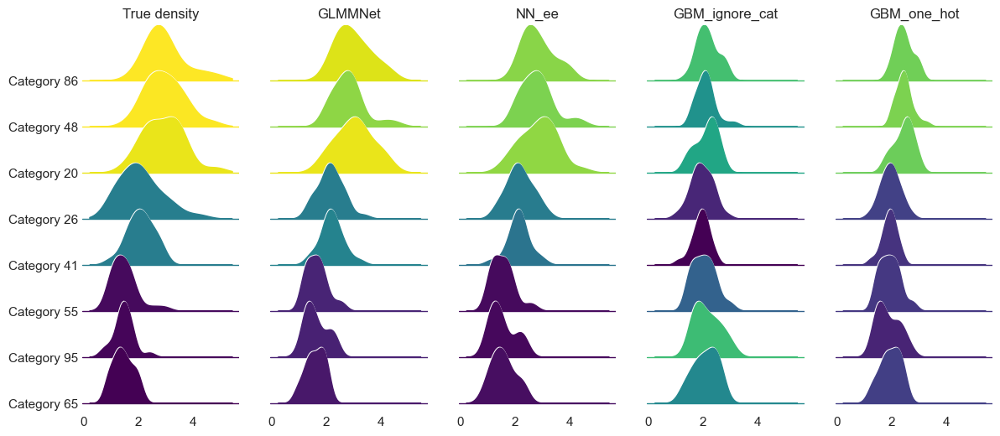

In [79]:
# To plot ridgelines, need to get the models' predictions
# Unpack data
X_train, y_train, y_true_train = sim_data["train"]
X_test, y_test, y_true_test = sim_data["test"]
Zu = sim_data["Zu"]

ignore_cat_encoder = make_column_transformer(
    ("drop", [hicard_var]),
    (MinMaxScaler(feature_range=(0, 1)), x_num), # not required for GLMs, applied here for consistency
)
X_train_ic = ignore_cat_encoder.fit_transform(X_train)
X_test_ic = ignore_cat_encoder.transform(X_test)

one_hot_encoder = make_column_transformer(
    (OneHotEncoder(handle_unknown="ignore", drop="first", sparse=False), [hicard_var]),
    (MinMaxScaler(feature_range=(0, 1)), x_num), # not required for GLMs, applied here for consistency
)
X_train_ohe = one_hot_encoder.fit_transform(X_train)
X_test_ohe = one_hot_encoder.transform(X_test)

ct_nn = make_column_transformer(
    (ce.ordinal.OrdinalEncoder(handle_unknown="value"), [hicard_var]), # "value" encodes unknown categories as "-1"
    (MinMaxScaler(feature_range=(0, 1)), x_num),
)
X_train_ct = pd.DataFrame(ct_nn.fit_transform(X_train), columns=colnames)
X_test_ct = pd.DataFrame(ct_nn.transform(X_test), columns=colnames)
X_embed_train, X_embed_test = embedding_preproc(X_train_ct, X_test_ct, [hicard_var])

one_hot = ce.OneHotEncoder(cols=[hicard_var], handle_unknown="value")
X_train_ct_ohe = one_hot.fit_transform(X_train_ct)
X_test_ct_ohe = one_hot.transform(X_test_ct)

# Get the fitted models
NN_ee = fitted_models["NN_ee"]
glmmnet = fitted_models["GLMMNet"]
GBM_one_hot = fitted_models["GBM_one_hot"]
GBM_ignore_cat = fitted_models["GBM_ignore_cat"]

# To make predictions, we call the model multiple times and average the results
# This is because the random effects are sampled from the posterior (in the DenseVariational layer).
y_pred_test = predict_glmmnet(glmmnet, X_test_ct_ohe, hicard_var)

dpi = 100
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(1400/dpi, 600/dpi), dpi=dpi)
test_data = pd.concat([
    X_test.reset_index(drop=True),
    pd.DataFrame(y_test, columns=["y"]),
    pd.DataFrame(y_true_test, columns=["y_true"])], axis=1)
ranked_cats = test_data.groupby("category").mean().sort_values("y").index.to_list()
selected_cats = ranked_cats[:3] + ranked_cats[len(ranked_cats)//2:len(ranked_cats)//2+2] + ranked_cats[-3:]
p_min, p_max = y_test.min(), y_test.max()
plot_ridgeline(X_test["category"], y_test, selected_cats, axes[0], "True density")
plot_ridgeline(X_test["category"], y_pred_test, selected_cats, axes[1], "GLMMNet", ylabel=False, p_min=p_min, p_max=p_max)
NN_ee_y_pred_test = NN_ee.predict((tuple(X_embed_test), X_test_ct[x_num])).flatten()
plot_ridgeline(X_test["category"], NN_ee_y_pred_test, selected_cats, axes[2], "NN_ee", ylabel=False, p_min=p_min, p_max=p_max)
plot_ridgeline(X_test["category"], GBM_ignore_cat.predict(X_test_ic), selected_cats, axes[3], "GBM_ignore_cat", ylabel=False, p_min=p_min, p_max=p_max)
plot_ridgeline(X_test["category"], GBM_one_hot.predict(X_test_ohe), selected_cats, axes[4], "GBM_one_hot", ylabel=False, p_min=p_min, p_max=p_max)

plt.show()
# fig.savefig(f"figures/experiment_{exp_id}/ridgeline.pdf")

In [80]:
fig.savefig(f"figures/experiment_{exp_id}/ridgeline.pdf")

#### Gradually Changing the Noise Level

In [ ]:
# A lighter version of run_sim_experiment that computes only results for:
#   - GLMMNet
#   - GLM_one_hot (reference)
#   - GBM_GLMM_enc
def run_sim_experiment_light(exp_id, sim_data, y_dist="gaussian", random_state=random_seed):

    # Unpack data
    X_train, y_train, y_true_train = sim_data["train"]
    X_val, y_val, y_true_val = sim_data["val"]
    X_test, y_test, y_true_test = sim_data["test"]
    Zu = sim_data["Zu"]

    # Variable names
    hicard_var = "category"
    x_num = [col for col in X_train.columns if col not in hicard_var]
    colnames = [hicard_var] + x_num

    # Convert numeric to string so they can be recognised by ce.OrdinalEncoder
    X_train[hicard_var] = X_train[hicard_var].astype("str")
    X_val[hicard_var] = X_val[hicard_var].astype("str")
    X_test[hicard_var] = X_test[hicard_var].astype("str")

    # Initialise
    train_scores = dict()
    test_scores = dict()
    plots = dict()
    runtimes = dict()

    # GLM
    # -------------------------------------------------------------------------
    one_hot_encoder = make_column_transformer(
        (OneHotEncoder(handle_unknown="ignore", drop="first", sparse=False), [hicard_var]),
        (MinMaxScaler(feature_range=(0, 1)), x_num), # not required for GLMs, applied here for consistency
    )
    X_train_ohe = one_hot_encoder.fit_transform(X_train)
    X_val_ohe = one_hot_encoder.transform(X_val)
    X_test_ohe = one_hot_encoder.transform(X_test)
    start = time.time()
    if y_dist == "gaussian":
        GLM_one_hot = LinearRegression()
        GLM_one_hot.fit(X_train_ohe, y_train)
        gamma_shape = None # placeholder, will not be read when y_dist == "gaussian"
    elif y_dist == "gamma":
        GLM_one_hot = sm.GLM(y_train, X_train_ohe, family=sm.families.Gamma(sm.families.links.log())).fit()
        gamma_shape = 1 / GLM_one_hot.scale
    end = time.time()
    train_scores["GLM_one_hot"] = evaluate_model(
        GLM_one_hot, X_train_ohe, y_train, categories=X_train[hicard_var], 
        likelihood=y_dist, gamma_shape=gamma_shape)
    test_scores["GLM_one_hot"] = evaluate_model(
        GLM_one_hot, X_val_ohe, y_val, categories=X_val[hicard_var], 
        likelihood=y_dist, gamma_shape=gamma_shape)
    plots["GLM_one_hot"] = plot_from_model(GLM_one_hot, X_train_ohe, y_true_train, X_val_ohe, y_true_val, log_scale=log_plot, show=False)
    runtimes["GLM_one_hot"] = end - start

    # GBM
    # -------------------------------------------------------------------------
    GBM = xgb.XGBRegressor(n_jobs=-1, learning_rate=0.1, max_depth=2, random_state=random_state)
    GLMM_encoder = make_column_transformer(
        # https://contrib.scikit-learn.org/category_encoders/wrapper.html
        (NestedCVWrapper(ce.glmm.GLMMEncoder(), cv=KFold(n_splits=5)), [hicard_var]),
        (MinMaxScaler(feature_range=(0, 1)), x_num), # not required for GLMs, applied here for consistency
    )
    GBM_GLMM_enc = make_pipeline(GLMM_encoder, GBM)
    start = time.time()
    GBM_GLMM_enc.fit(X_train, y_train)
    end = time.time()
    train_scores["GBM_GLMM_enc"] = evaluate_model(GBM_GLMM_enc, X_train, y_train, categories=X_train[hicard_var], likelihood=y_dist)
    test_scores["GBM_GLMM_enc"] = evaluate_model(GBM_GLMM_enc, X_val, y_val, categories=X_val[hicard_var], likelihood=y_dist)
    plots["GBM_GLMM_enc"] = plot_from_model(GBM_GLMM_enc, X_train, y_true_train, X_val, y_true_val, log_scale=log_plot, show=False)
    # Plot GLMM encodings vs true random effects
    p = bop.figure(title="GLMM Encodings", x_axis_label="Ground truth", y_axis_label="GLMM encodings", width=400, height=300)
    p.add_layout(bom.Title(text="Model: GLMM encodings", text_font_style="italic"), "above")
    GLMM_encodings = GLMM_encoder.named_transformers_["nestedcvwrapper"].transform(X_train[hicard_var])
    p.circle(Zu[:X_train.shape[0]], GLMM_encodings.values.ravel(), color="#9f86c0")
    p.add_layout(bom.Slope(gradient=1, y_intercept=0, line_color="black", line_width=2))
    plots["GLMM_encodings"] = p
    runtimes["GBM_GLMM_enc"] = end - start

    # NN with entity embeddings
    # -------------------------------------------------------------------------
    ct_nn = make_column_transformer(
        (ce.ordinal.OrdinalEncoder(handle_unknown="value"), [hicard_var]), # "value" encodes unknown categories as "-1"
        (MinMaxScaler(feature_range=(0, 1)), x_num),
    )
    X_train_ct = pd.DataFrame(ct_nn.fit_transform(X_train), columns=colnames)
    X_val_ct = pd.DataFrame(ct_nn.transform(X_val), columns=colnames)
    X_test_ct = pd.DataFrame(ct_nn.transform(X_test), columns=colnames)

    # GLMMNet (proposed model)
    # -------------------------------------------------------------------------
    tf.random.set_seed(random_state)
    one_hot = ce.OneHotEncoder(cols=[hicard_var], handle_unknown="value")
    X_train_ohe = one_hot.fit_transform(X_train_ct)
    X_val_ohe = one_hot.transform(X_val_ct)
    X_test_ohe = one_hot.transform(X_test_ct)
    # TODO: Write a function to construct the model
    # Construct a standard FFNN for the fixed effects
    num_inputs = layers.Input(shape=(len(x_num),), name="numeric_inputs")
    hidden_units = [64, 32, 16]
    hidden_activation = "relu"
    x = num_inputs
    for hidden_layer in range(len(hidden_units)):
        units = hidden_units[hidden_layer]
        x = layers.Dense(units=units, activation=hidden_activation, name=f"hidden_{hidden_layer + 1}")(x)
    f_X = layers.Dense(units=1, activation="linear", name="f_X")(x)

    # Deal with categorical inputs (random effects)
    cardinality = len(one_hot.category_mapping[0]["mapping"].keys()) - 1
    cat_inputs = layers.Input(shape=(cardinality,), name=f"category_OHE_inputs")
    # Construct the random effects, by variational inference
    # Code adapted from https://www.tensorflow.org/probability/examples/Probabilistic_Layers_Regression
    # Specify the surrogate posterior over the random effects
    def posterior_u(kernel_size, bias_size=0, dtype=None):
        n = kernel_size + bias_size
        # c = np.log(np.expm1(1.)) # Inverse of softplus(1.)
        return tf.keras.Sequential([
            tfp.layers.VariableLayer(2 * n, dtype=dtype, initializer="random_normal"),
            tfp.layers.DistributionLambda(lambda t: tfd.Independent(
                tfd.Normal(loc=t[..., :n],
                # CHANGE HERE - forcing a smaller scale parameter improves the result & eliminates training outliers
                # CHANGE AGAIN - removing "+ c" within softplus - 18 Oct 2022
                            scale=0.01 * tf.nn.softplus(t[..., n:])),
                reinterpreted_batch_ndims=1)),
        ])
    # Specify the prior over the random effects
    def prior_trainable(kernel_size, bias_size=0, dtype=None):
        n = kernel_size + bias_size
        c = np.log(np.expm1(1.)) # Inverse of softplus()
        return tf.keras.Sequential([
            tfp.layers.VariableLayer(1, dtype=dtype, initializer="random_normal"),
            tfp.layers.DistributionLambda(lambda t: tfd.Independent(
                tfd.Normal(loc=tf.zeros(n), scale=tf.nn.softplus(c + t)),
                reinterpreted_batch_ndims=1)),
        ])
    def prior_fixed(kernel_size, bias_size=0, dtype=None):
        n = kernel_size + bias_size
        return lambda t: tfd.Independent(
            tfd.Normal(loc=tf.zeros(n), scale=0.1 * tf.ones(n)), 
            reinterpreted_batch_ndims=1
        )
    RE = tfp.layers.DenseVariational(
        units=1, 
        make_posterior_fn=posterior_u,
        make_prior_fn=prior_trainable, # switching between the two doesn't really make a difference
        # make_prior_fn=prior_fixed,
        kl_weight=1 / X_train.shape[0], # https://github.com/tensorflow/probability/issues/396
                                        # https://github.com/tensorflow/probability/issues/691
        use_bias=False,
        name="RE",)(cat_inputs)

    # Add the RE to the f(X) output
    eta = layers.Add(name="f_X_plus_RE")([f_X, RE])

    if y_dist == "gaussian":
        # Compute the distributional parameters
        dist_params = DistParams(inverse_link="identity", phi_init=0.1, name="dist_params",)(eta)
        # Construct the distribution output
        output = tfp.layers.DistributionLambda(
            lambda t: tfd.Normal(loc=t[..., :1], scale=t[..., 1:]), 
            name="distribution",
        )(dist_params)
    elif y_dist == "gamma":
        # Compute the distributional parameters
        dist_params = DistParams(
            inverse_link="exp", # <--- CHANGE FROM EXPERIMENTS 1-3
            phi_init=0.1,
            name="dist_params",)(eta)
        # Construct the distribution output
        output = tfp.layers.DistributionLambda(
            lambda t: tfd.Gamma(                    # https://www.tensorflow.org/probability/api_docs/python/tfp/distributions/Gamma
                concentration=1 / t[..., 1:],       # concentration = shape = 1 / dispersion
                rate=(1 / t[..., 1:]) / t[..., :1], # rate = shape / location
            ), name="distribution")(dist_params)
    
    glmmnet = models.Model(inputs=[num_inputs, cat_inputs], outputs=output)

    def NLL(y_true, y_dist_pred):
        return -y_dist_pred.log_prob(y_true)

    glmmnet.compile(optimizer="adam", loss=NLL)
    es = EarlyStopping(patience=50, restore_best_weights=True, monitor="val_loss", verbose=2)
    start = time.time()
    hist = glmmnet.fit(
        (X_train_ct[x_num], X_train_ohe.loc[:, X_train_ohe.columns.str.startswith(hicard_var)]), y_train, 
        validation_data=((X_val_ct[x_num], X_val_ohe.loc[:, X_val_ohe.columns.str.startswith(hicard_var)]), y_val),
        callbacks=[es],
        # note: batch_size = 128 (128 or 256 doesn't make a difference, but 256 is faster)
        batch_size=256, epochs=500, verbose=False)
    end = time.time()

    # To make predictions, we call the model multiple times and average the results
    # This is because the random effects are sampled from the posterior (in the DenseVariational layer).
    n_prediction_samples = 100
    y_pred_train = np.zeros((X_train_ct.shape[0], n_prediction_samples))
    y_pred_val = np.zeros((X_val_ct.shape[0], n_prediction_samples))
    for i in range(n_prediction_samples):
        y_pred_train[:, i] = glmmnet((
            tf.convert_to_tensor(X_train_ct[x_num]), 
            tf.convert_to_tensor(X_train_ohe.loc[:, X_train_ohe.columns.str.startswith(hicard_var)]))).mean().numpy().flatten()
        y_pred_val[:, i] = glmmnet((
            tf.convert_to_tensor(X_val_ct[x_num]),
            tf.convert_to_tensor(X_val_ohe.loc[:, X_val_ohe.columns.str.startswith(hicard_var)]))).mean().numpy().flatten()
    y_pred_train = y_pred_train.mean(axis=1)
    y_pred_val = y_pred_val.mean(axis=1)

    sigma_e = glmmnet.get_layer("dist_params").get_weights()
    train_scores["GLMMNet"] = evaluate_predictions(
        y_train, y_pred_train, categories=X_train[hicard_var], likelihood=y_dist,
        loc=y_pred_train, scale=sigma_e[0][0], gamma_shape=1 / sigma_e[0][0])
    test_scores["GLMMNet"] = evaluate_predictions(
        y_val, y_pred_val, categories=X_val[hicard_var], likelihood=y_dist,
        loc=y_pred_val, scale=sigma_e[0][0], gamma_shape=1 / sigma_e[0][0])
    plots["GLMMNet"] = plot_from_predictions(y_pred_train, y_true_train, y_pred_val, y_true_val, log_scale=log_plot, show=False)
    
    # Plot the random effects
    p = bop.figure(title="Random Effects Predictions", x_axis_label="Ground truth", y_axis_label="Predictions", width=400, height=400)
    p.add_layout(bom.Title(text="Model: GLMMNet", text_font_style="italic"), "above")
    u_hat = glmmnet.get_layer("RE").weights[0][:cardinality] # extract the posterior means
    re_glmmnet = tf.gather(u_hat, X_train_ct[hicard_var].astype("int") - 1).numpy() # minus 1 because the categories are 1-indexed
    p.circle(Zu[:n_train], re_glmmnet, color="#9f86c0")
    p.add_layout(bom.Slope(gradient=1, y_intercept=0, line_color="black", line_width=2))
    plots["GLMMNet_RE_pred"] = p
    runtimes["GLMMNet"] = end - start
    
    return train_scores, test_scores, plots, runtimes

In [ ]:
all_train_scores, all_test_scores, all_plots, all_runtimes = {}, {}, {}, {}
for noise_level in np.arange(start=1, stop=8, step=1):
    
    print(f"Running experiment for noise level = {noise_level}")
    sig2noise = np.array([4, 1, noise_level])
    # Note: Other parameters are inherited from the previous experiments (global variables)

    sim_data = generate_data(
        exp_id=-1, # placeholder
        n_train=n_train, n_val=n_val, n_test=n_test, n_categories=n_categories,
        f_structure=f_structure, signal_to_noise=sig2noise, y_dist=y_dist,
        inverse_link=inverse_link, cat_dist=cat_dist, random_state=random_seed,
        overwrite=False,
    )

    train_scores, test_scores, plots, runtimes = run_sim_experiment_light(
        exp_id=-1, sim_data=sim_data, y_dist=y_dist, random_state=random_seed
    )

    all_train_scores[noise_level] = train_scores
    all_test_scores[noise_level] = test_scores
    all_plots[noise_level] = plots
    all_runtimes[noise_level] = runtimes

    with pd.option_context("display.float_format", "{:.4f}".format):
        # display(pd.DataFrame(train_scores).transpose())
        display(pd.DataFrame(test_scores).transpose())
        # display(pd.DataFrame(runtimes, index=["Runtime (sec)"]).transpose())

Running experiment for noise level = 1
Restoring model weights from the end of the best epoch: 69.
Epoch 119: early stopping


,MAE,RMSE,R2,RMSE_avg,RMSE_avg_weighted,CRPS
GLM_one_hot,0.3187,0.4181,0.5982,0.1035,0.1048,0.2255
GBM_GLMM_enc,0.2955,0.3880,0.6539,0.1321,0.1329,0.2467
GLMMNet,0.2718,0.3586,0.7044,0.0933,0.0938,0.1943


Running experiment for noise level = 2
Restoring model weights from the end of the best epoch: 46.
Epoch 96: early stopping


,MAE,RMSE,R2,RMSE_avg,RMSE_avg_weighted,CRPS
GLM_one_hot,0.4352,0.5621,0.2460,0.1583,0.1596,0.3047
GBM_GLMM_enc,0.4208,0.5406,0.3026,0.1508,0.1505,0.3285
GLMMNet,0.4215,0.5455,0.2898,0.1493,0.1503,0.2961


Running experiment for noise level = 3
Restoring model weights from the end of the best epoch: 115.
Epoch 165: early stopping


,MAE,RMSE,R2,RMSE_avg,RMSE_avg_weighted,CRPS
GLM_one_hot,0.5048,0.6494,0.1527,0.1780,0.1781,0.3538
GBM_GLMM_enc,0.4979,0.6384,0.1813,0.1621,0.1601,0.3773
GLMMNet,0.5029,0.6478,0.1569,0.1716,0.1712,0.3528


Running experiment for noise level = 4
Restoring model weights from the end of the best epoch: 67.
Epoch 117: early stopping


,MAE,RMSE,R2,RMSE_avg,RMSE_avg_weighted,CRPS
GLM_one_hot,0.5633,0.7282,0.1020,0.1725,0.1745,0.3929
GBM_GLMM_enc,0.5635,0.7249,0.1100,0.1792,0.1793,0.4180
GLMMNet,0.5599,0.7238,0.1127,0.1655,0.1644,0.3921


Running experiment for noise level = 5
Restoring model weights from the end of the best epoch: 59.
Epoch 109: early stopping


,MAE,RMSE,R2,RMSE_avg,RMSE_avg_weighted,CRPS
GLM_one_hot,0.5955,0.7708,0.0636,0.1986,0.1986,0.4151
GBM_GLMM_enc,0.5954,0.7706,0.0640,0.1972,0.1973,0.4362
GLMMNet,0.5944,0.7726,0.0593,0.1918,0.1911,0.4154


Running experiment for noise level = 6
Restoring model weights from the end of the best epoch: 59.
Epoch 109: early stopping


,MAE,RMSE,R2,RMSE_avg,RMSE_avg_weighted,CRPS
GLM_one_hot,0.6188,0.7928,0.0111,0.2171,0.2134,0.4285
GBM_GLMM_enc,0.6121,0.7851,0.0304,0.1854,0.1855,0.4403
GLMMNet,0.6139,0.7921,0.0130,0.1984,0.1953,0.4284


Running experiment for noise level = 7
Restoring model weights from the end of the best epoch: 48.
Epoch 98: early stopping


,MAE,RMSE,R2,RMSE_avg,RMSE_avg_weighted,CRPS
GLM_one_hot,0.6433,0.8311,0.0254,0.2302,0.2281,0.4455
GBM_GLMM_enc,0.6430,0.8292,0.0297,0.2173,0.2138,0.4591
GLMMNet,0.6442,0.8341,0.0185,0.2235,0.2207,0.4476


### Experiment #5

In [160]:
# Configure simulation parameters
exp_id = 5                         # experiment id
sig2noise = np.array([4, 4, 1])    # relative signal-to-noise of the fixed effects, random effects and irreducible error
y_dist = "gamma"                   # distribution of the response variable y
inverse_link = np.exp              # inverse of the log link
cat_dist = "skewed"                # distribution of the categorical variable
random_seed = 42 + exp_id          # random seed for reproducibility
log_plot = True                    # whether to plot the log transformed response and predictions
nn_loss = "mse"                    # loss function for the neural network (entity embedding model)

In [161]:
# Generate data
sim_data = generate_data(
    exp_id=exp_id, n_train=n_train, n_test=n_test, n_categories=n_categories,
    f_structure=f_structure, signal_to_noise=sig2noise, y_dist=y_dist,
    inverse_link=inverse_link, cat_dist=cat_dist, random_state=random_seed,
    overwrite=True,
)

In [170]:
train_scores, test_scores, plots, runtimes, fitted_models = run_sim_experiment(
    exp_id, sim_data=sim_data, y_dist=y_dist, random_state=random_seed
)

with pd.option_context("display.float_format", "{:.4f}".format):
    display(pd.DataFrame(train_scores).transpose())
    display(pd.DataFrame(test_scores).transpose())
    display(pd.DataFrame(runtimes, index=["Runtime (sec)"]).transpose())

Restoring model weights from the end of the best epoch: 82.
Epoch 132: early stopping
79/79 [==============================] - 0s 3ms/step
Restoring model weights from the end of the best epoch: 87.
Epoch 137: early stopping
Restoring model weights from the end of the best epoch: 210.
Epoch 260: early stopping


,MAE,RMSE,R2,RMSE_avg,RMSE_avg_weighted,CRPS
GLM_ignore_cat,0.5200,0.7630,0.0868,0.9186,0.7134,0.3804
GLM_one_hot,0.1813,0.2514,0.9009,0.0592,0.0172,0.1279
GLM_GLMM_enc,0.2618,0.6116,0.4131,1.1638,0.5431,0.1910
GBM_ignore_cat,0.4971,0.7282,0.1680,0.8669,0.6858,0.3626
GBM_one_hot,0.3444,0.4414,0.6943,0.5568,0.3512,0.2410
GBM_GLMM_enc,0.1670,0.2306,0.9166,0.0818,0.0442,0.1179
NN_ee,0.1558,0.2129,0.9289,0.0561,0.0207,0.1102
GBM_ee,0.3424,0.4825,0.6347,0.6669,0.4093,0.2435
GLMM,0.1811,0.2510,0.9012,0.0350,0.0077,0.1277
GPBoost,0.1825,0.2698,0.8858,0.3509,0.1496,0.1300


,MAE,RMSE,R2,RMSE_avg,RMSE_avg_weighted,CRPS
GLM_ignore_cat,0.5091,0.7381,0.0662,0.8747,0.6932,0.3716
GLM_one_hot,0.1737,0.2433,0.8986,0.1456,0.0740,0.1233
GLM_GLMM_enc,0.2648,0.6277,0.3246,1.1645,0.5781,0.1942
GBM_ignore_cat,0.5102,0.7333,0.0785,0.8682,0.6919,0.3692
GBM_one_hot,0.3471,0.4416,0.6657,0.5333,0.3560,0.2426
GBM_GLMM_enc,0.1709,0.2374,0.9034,0.1358,0.0830,0.1215
NN_ee,0.1666,0.2317,0.9080,0.1438,0.0724,0.1182
GBM_ee,0.3423,0.4634,0.6320,0.6267,0.3946,0.2414
GLMM,0.1734,0.2428,0.8990,0.1395,0.0717,0.1231
GPBoost,0.1769,0.2524,0.8908,0.2972,0.1320,0.1263


,Runtime (sec)
GLM_ignore_cat,0.2811
GLM_one_hot,4.3980
GLM_GLMM_enc,0.1014
GBM_ignore_cat,0.6238
GBM_one_hot,0.2868
GBM_GLMM_enc,12.0264
NN_ee,20.7992
GBM_ee,0.2533
GLMMNet,38.1406
GLMMNet_dropout,66.7902


79/79 [==============================] - 0s 3ms/step


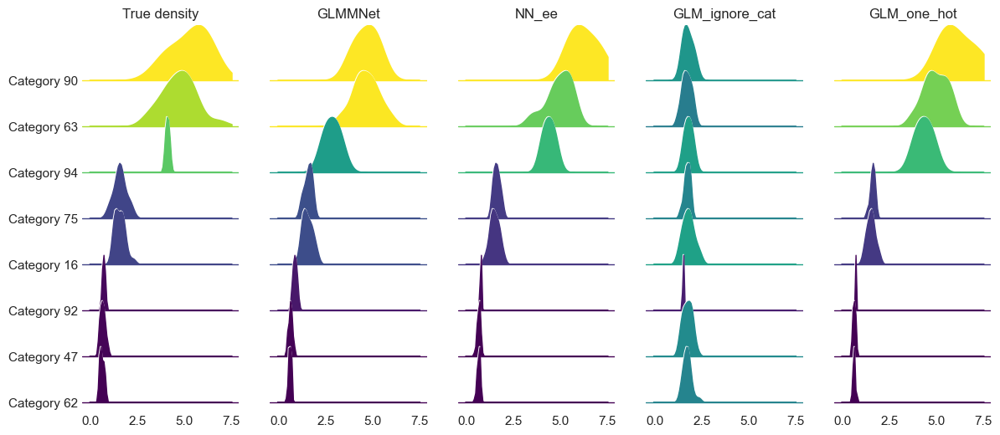

In [180]:
# To plot ridgelines, need to get the models' predictions
# Unpack data
X_train, y_train, y_true_train = sim_data["train"]
X_test, y_test, y_true_test = sim_data["test"]
Zu = sim_data["Zu"]

# Refit models
X_train_ic = ignore_cat_encoder.fit_transform(X_train)
X_test_ic = ignore_cat_encoder.transform(X_test)
GLM_ignore_cat = fitted_models["GLM_ignore_cat"]

one_hot_encoder = make_column_transformer(
    (OneHotEncoder(handle_unknown="ignore", drop="first", sparse=False), [hicard_var]),
    (MinMaxScaler(feature_range=(0, 1)), x_num), # not required for GLMs, applied here for consistency
)
X_train_ohe = one_hot_encoder.fit_transform(X_train)
X_test_ohe = one_hot_encoder.transform(X_test)
GLM_one_hot = fitted_models["GLM_one_hot"]

X_train_ct = pd.DataFrame(ct_nn.fit_transform(X_train), columns=colnames)
X_test_ct = pd.DataFrame(ct_nn.transform(X_test), columns=colnames)
X_embed_train, X_embed_test = embedding_preproc(X_train_ct, X_test_ct, [hicard_var])
NN_ee = fitted_models["NN_ee"]

one_hot = ce.OneHotEncoder(cols=[hicard_var], handle_unknown="value")
X_train_ct_ohe = one_hot.fit_transform(X_train_ct)
X_test_ct_ohe = one_hot.transform(X_test_ct)
glmmnet = fitted_models["GLMMNet"]

# To make predictions, we call the model multiple times and average the results
# This is because the random effects are sampled from the posterior (in the DenseVariational layer).
y_pred_test = predict_glmmnet(glmmnet, X_test_ct_ohe, hicard_var)

dpi = 100
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(1400/dpi, 600/dpi), dpi=dpi)

test_data = pd.concat([
    X_test.reset_index(drop=True),
    pd.DataFrame(y_test, columns=["y"]),
    pd.DataFrame(y_true_test, columns=["y_true"])], axis=1)
ranked_cats = test_data.groupby("category").mean().sort_values("y").index.to_list()
selected_cats = ranked_cats[:3] + ranked_cats[len(ranked_cats)//2:len(ranked_cats)//2+2] + ranked_cats[-3:]
p_min, p_max = y_test.min(), y_test.max()
plot_ridgeline(X_test["category"], y_test, selected_cats, axes[0], "True density")
plot_ridgeline(X_test["category"], y_pred_test, selected_cats, axes[1], "GLMMNet", ylabel=False, p_min=p_min, p_max=p_max)
NN_ee_y_pred_test = NN_ee.predict((tuple(X_embed_test), X_test_ct[x_num])).flatten()
plot_ridgeline(X_test["category"], NN_ee_y_pred_test, selected_cats, axes[2], "NN_ee", ylabel=False, p_min=p_min, p_max=p_max)
plot_ridgeline(X_test["category"], GLM_ignore_cat.predict(X_test_ic), selected_cats, axes[3], "GLM_ignore_cat", ylabel=False, p_min=p_min, p_max=p_max)
plot_ridgeline(X_test["category"], GLM_one_hot.predict(X_test_ohe), selected_cats, axes[4], "GLM_one_hot", ylabel=False, p_min=p_min, p_max=p_max)

plt.show()
# fig.savefig(f"figures/experiment_{exp_id}/ridgeline.pdf")

In [190]:
g_re = gridplot([
    plots["GLMM_encodings"], plots["GLMM_RE_pred"], 
    plots["GPBoost_RE_pred"], plots["GLMMNet_RE_pred"],
    plots["GLMMNet_dropout_RE_pred"]
    ], ncols=3, height=300, width=300)
bop.show(g_re)

### Experiment #6

In [30]:
# Configure simulation parameters
exp_id = 6                         # experiment id
sig2noise = np.array([8, 1, 4])    # relative signal-to-noise of the fixed effects, random effects and irreducible error
y_dist = "gamma"                   # distribution of the response variable y
inverse_link = np.exp              # inverse of the log link
cat_dist = "skewed"                # distribution of the categorical variable
random_seed = 42 + exp_id          # random seed for reproducibility
log_plot = True                    # whether to plot the log transformed response and predictions
nn_loss = "mse"                    # loss function for the neural network (entity embedding model)

In [31]:
# Generate data
sim_data = generate_data(
    exp_id=exp_id, n_train=n_train,  n_test=n_test, n_categories=n_categories,
    f_structure=f_structure, signal_to_noise=sig2noise, y_dist=y_dist,
    inverse_link=inverse_link, cat_dist=cat_dist, random_state=random_seed,
    overwrite=True,
)

In [187]:
print("Please pause and run R script to generate the results required.")
print("Remember to update the parameters in the R script to match the current settings.")

Please pause and run R script to generate the results required.
Remember to update the parameters in the R script to match the current settings.


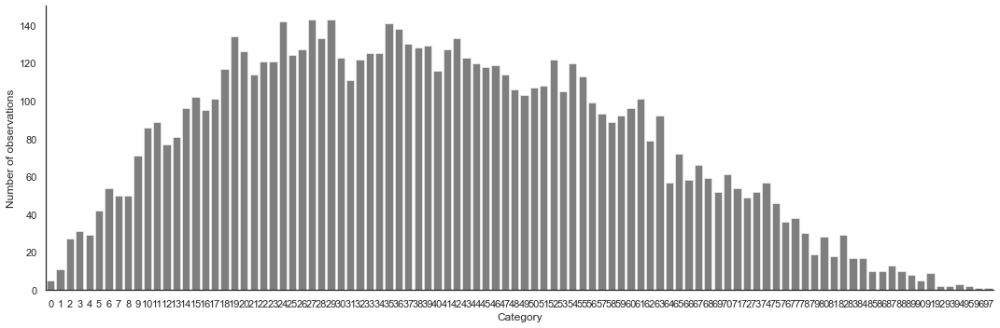

In [199]:
X_train = pd.read_csv(f"data/experiment_{exp_id}/train_data.csv")
X_test = pd.read_csv(f"data/experiment_{exp_id}/test_data.csv")
X = pd.concat([X_train, X_test], axis=0)
cat_count = X[hicard_var].value_counts()
fig = plt.figure(figsize=(15, 5))
_ = sns.barplot(x=cat_count.index, y=cat_count.values, color="black", alpha=0.5)
plt.ylabel("Number of observations")
plt.xlabel("Category")
plt.tight_layout()

In [194]:
# Not the best practice..
# but there seems no other way to suppress warnings around unknown categories being transformed to all zeros,
# even though they have been told to handle_unknown="ignore"
import warnings
warnings.simplefilter("ignore", UserWarning)

In [83]:
train_scores, test_scores, plots, runtimes, fitted_models = run_sim_experiment(
    exp_id, sim_data=sim_data, y_dist=y_dist, random_state=random_seed
)

with pd.option_context("display.float_format", "{:.4f}".format):
    display(pd.DataFrame(train_scores).transpose())
    display(pd.DataFrame(test_scores).transpose())
    display(pd.DataFrame(runtimes, index=["Runtime (sec)"]).transpose())

/Users/melantha/miniforge3/envs/cat-project/lib/python3.9/site-packages/sklearn/preprocessing/_encoders.py:188: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


Restoring model weights from the end of the best epoch: 13.
Epoch 63: early stopping
79/79 [==============================] - 0s 3ms/step
Restoring model weights from the end of the best epoch: 65.
Epoch 115: early stopping


100%|██████████| 100/100 [00:04<00:00, 20.94it/s]


Restoring model weights from the end of the best epoch: 188.
Epoch 238: early stopping


100%|██████████| 100/100 [00:04<00:00, 21.07it/s]


,MAE,MedAE,MedPE,RMSE,R2,RMSE_avg,RMSE_avg_weighted,CRPS
GLM_ignore_cat,0.5874,0.4888,0.3158,0.7627,0.0544,0.2614,0.2133,0.4131
GLM_one_hot,0.5629,0.4572,0.2988,0.7322,0.1286,0.0276,0.0125,0.3961
GLM_GLMM_enc,0.5730,0.4756,0.3059,0.7454,0.0968,0.1753,0.0695,0.4034
GBM_ignore_cat,0.5652,0.4727,0.2990,0.7346,0.1229,0.2560,0.2073,0.3977
GBM_one_hot,0.5580,0.4686,0.2986,0.7243,0.1474,0.2256,0.1465,0.3925
GBM_GLMM_enc,0.5508,0.4577,0.2973,0.7156,0.1676,0.1735,0.0802,0.3876
NN_ee,0.5631,0.4502,0.2985,0.7394,0.1114,0.1625,0.0932,0.4001
GBM_ee,0.5583,0.4661,0.2994,0.7257,0.1440,0.2346,0.1584,0.3928
GLMM,0.5647,0.4648,0.3012,0.7344,0.1233,0.1598,0.0530,0.3974
GPBoost,0.5707,0.4743,0.3054,0.7432,0.1023,0.2420,0.1832,0.4022


,MAE,MedAE,MedPE,RMSE,R2,RMSE_avg,RMSE_avg_weighted,CRPS
GLM_ignore_cat,0.5819,0.5014,0.3160,0.7507,0.0668,0.3159,0.2501,0.4061
GLM_one_hot,0.5682,0.4793,0.3127,0.7305,0.1164,0.2610,0.1821,0.3950
GLM_GLMM_enc,0.5691,0.4848,0.3144,0.7304,0.1166,0.2675,0.1831,0.3952
GBM_ignore_cat,0.5819,0.4948,0.3102,0.7500,0.0687,0.3136,0.2476,0.4055
GBM_one_hot,0.5747,0.4899,0.3078,0.7381,0.0980,0.2898,0.2064,0.3993
GBM_GLMM_enc,0.5702,0.4799,0.3151,0.7333,0.1096,0.2749,0.1898,0.3965
NN_ee,0.5681,0.4705,0.3099,0.7351,0.1054,0.2549,0.1773,0.3979
GBM_ee,0.5770,0.4901,0.3147,0.7428,0.0865,0.3057,0.2235,0.4012
GLMM,0.5679,0.4822,0.3130,0.7288,0.1206,0.2621,0.1762,0.3944
GPBoost,0.5750,0.4867,0.3128,0.7415,0.0896,0.2955,0.2264,0.4013


,Runtime (sec)
GLM_ignore_cat,0.4377
GLM_one_hot,12.8594
GLM_GLMM_enc,0.2141
GBM_ignore_cat,1.5689
GBM_one_hot,0.3395
GBM_GLMM_enc,0.2261
NN_ee,10.2423
GBM_ee,0.2941
GLMMNet,28.8484
GLMMNet_dropout,60.1466


In [84]:
pd.DataFrame(train_scores).transpose().to_csv("models/experiment_6/train_scores.csv")
pd.DataFrame(test_scores).transpose().to_csv("models/experiment_6/test_scores.csv")

In [92]:
g_re = gridplot([
    plots["GLMM_encodings"], plots["GLMM_RE_pred"], 
    plots["GPBoost_RE_pred"],
    plots["GLMMNet_RE_pred"], plots["GLMMNet_dropout_RE_pred"]
    ], ncols=3, height=300, width=300)
bop.show(g_re)

/Users/melantha/miniforge3/envs/cat-project/lib/python3.9/site-packages/sklearn/preprocessing/_encoders.py:188: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
100%|██████████| 1000/1000 [01:35<00:00, 10.52it/s]


79/79 [==============================] - 0s 2ms/step


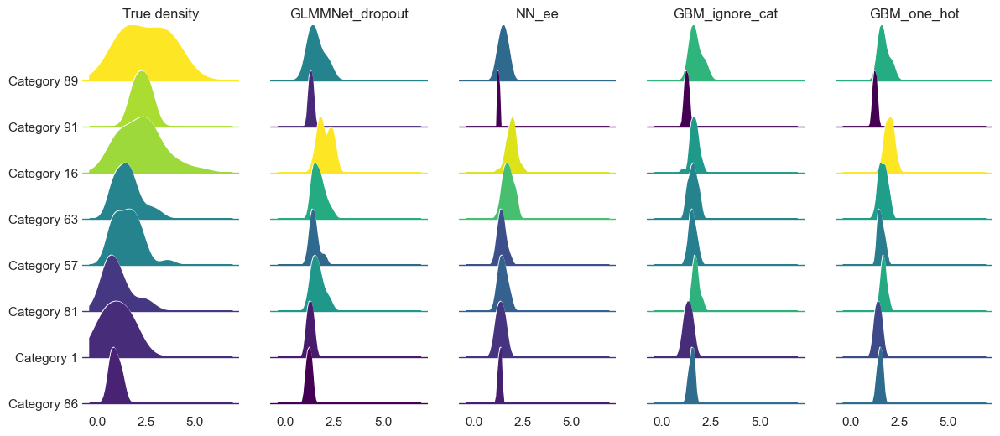

In [99]:
# To plot ridgelines, need to get the models' predictions
# Unpack data
X_train, y_train, y_true_train = sim_data["train"]
X_test, y_test, y_true_test = sim_data["test"]
Zu = sim_data["Zu"]

ignore_cat_encoder = make_column_transformer(
    ("drop", [hicard_var]),
    (MinMaxScaler(feature_range=(0, 1)), x_num), # not required for GLMs, applied here for consistency
)
X_train_ic = ignore_cat_encoder.fit_transform(X_train)
X_test_ic = ignore_cat_encoder.transform(X_test)

one_hot_encoder = make_column_transformer(
    (OneHotEncoder(handle_unknown="ignore", drop="first", sparse=False), [hicard_var]),
    (MinMaxScaler(feature_range=(0, 1)), x_num), # not required for GLMs, applied here for consistency
)
X_train_ohe = one_hot_encoder.fit_transform(X_train)
X_test_ohe = one_hot_encoder.transform(X_test)

ct_nn = make_column_transformer(
    (ce.ordinal.OrdinalEncoder(handle_unknown="value"), [hicard_var]), # "value" encodes unknown categories as "-1"
    (MinMaxScaler(feature_range=(0, 1)), x_num),
)
X_train_ct = pd.DataFrame(ct_nn.fit_transform(X_train), columns=colnames)
X_test_ct = pd.DataFrame(ct_nn.transform(X_test), columns=colnames)
X_embed_train, X_embed_test = embedding_preproc(X_train_ct, X_test_ct, [hicard_var])

one_hot = ce.OneHotEncoder(cols=[hicard_var], handle_unknown="value")
X_train_ct_ohe = one_hot.fit_transform(X_train_ct)
X_test_ct_ohe = one_hot.transform(X_test_ct)

# Get the fitted models
NN_ee = fitted_models["NN_ee"]
glmmnet = fitted_models["GLMMNet"]
glmmnet_dropout = fitted_models["GLMMNet_dropout"]
GBM_one_hot = fitted_models["GBM_one_hot"]
GBM_ignore_cat = fitted_models["GBM_ignore_cat"]

# To make predictions, we call the model multiple times and average the results
# This is because the random effects are sampled from the posterior (in the DenseVariational layer).
n_prediction_samples = 1000
y_pred_test = predict_glmmnet(glmmnet_dropout, X_test_ct_ohe, hicard_var, n_prediction_samples)

dpi = 100
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(1400/dpi, 600/dpi), dpi=dpi)
test_data = pd.concat([
    X_test.reset_index(drop=True),
    pd.DataFrame(y_test, columns=["y"]),
    pd.DataFrame(y_true_test, columns=["y_true"])], axis=1)
ranked_cats = test_data.groupby("category").mean().sort_values("y").index.to_list()
ranked_cats_by_freq = test_data.groupby("category").size().sort_values(ascending=False).index.to_list()
more_than_1_obs = test_data.groupby("category").count().query("y > 1").index.to_list()
ranked_cats = [cat for cat in ranked_cats if cat in more_than_1_obs]
ranked_cats_by_freq = [cat for cat in ranked_cats_by_freq if cat in more_than_1_obs]
selected_cats = ranked_cats[:3] + ranked_cats[len(ranked_cats)//2:len(ranked_cats)//2+2] + ranked_cats[-3:]
# selected_cats = ranked_cats_by_freq[:3] + ranked_cats_by_freq[len(ranked_cats_by_freq)//2:len(ranked_cats_by_freq)//2+2] + ranked_cats_by_freq[-3:]
# selected_cats = ranked_cats_by_freq[:4] + ranked_cats_by_freq[-4:]
p_min, p_max = y_test.min(), y_test.max()
plot_ridgeline(X_test["category"], y_test, selected_cats, axes[0], "True density")
plot_ridgeline(X_test["category"], y_pred_test, selected_cats, axes[1], "GLMMNet_dropout", ylabel=False, p_min=p_min, p_max=p_max)
NN_ee_y_pred_test = NN_ee.predict((tuple(X_embed_test), X_test_ct[x_num])).flatten()
plot_ridgeline(X_test["category"], NN_ee_y_pred_test, selected_cats, axes[2], "NN_ee", ylabel=False, p_min=p_min, p_max=p_max)
plot_ridgeline(X_test["category"], GBM_ignore_cat.predict(X_test_ic), selected_cats, axes[3], "GBM_ignore_cat", ylabel=False, p_min=p_min, p_max=p_max)
plot_ridgeline(X_test["category"], GBM_one_hot.predict(X_test_ohe), selected_cats, axes[4], "GBM_one_hot", ylabel=False, p_min=p_min, p_max=p_max)

plt.show()
# fig.savefig(f"figures/experiment_{exp_id}/ridgeline.pdf")

In [100]:
fig.savefig(f"figures/experiment_{exp_id}/ridgeline_GBM_dropout.pdf")

#### Check RE GLMM plot

In [224]:
train_scores, test_scores, plots, runtimes, fitted_models = run_sim_experiment(
    exp_id, sim_data=sim_data, y_dist=y_dist, random_state=random_seed
)

with pd.option_context("display.float_format", "{:.4f}".format):
    display(pd.DataFrame(train_scores).transpose())
    display(pd.DataFrame(test_scores).transpose())
    display(pd.DataFrame(runtimes, index=["Runtime (sec)"]).transpose())

Restoring model weights from the end of the best epoch: 76.
Epoch 126: early stopping
79/79 [==============================] - 0s 2ms/step
Restoring model weights from the end of the best epoch: 114.
Epoch 164: early stopping
Restoring model weights from the end of the best epoch: 387.
Epoch 437: early stopping


,MAE,RMSE,R2,RMSE_avg,RMSE_avg_weighted,CRPS
GLM_ignore_cat,0.2026,0.2541,0.3800,0.1539,0.1533,0.1431
GLM_one_hot,0.1614,0.2026,0.6059,0.0000,0.0000,0.1142
GLM_GLMM_enc,0.1667,0.2092,0.5799,0.0316,0.0307,0.1178
GBM_ignore_cat,0.1808,0.2277,0.5021,0.1483,0.1478,0.1281
GBM_one_hot,0.1706,0.2134,0.5625,0.1159,0.1143,0.1205
GBM_GLMM_enc,0.1412,0.1772,0.6983,0.0340,0.0338,0.0998
NN_ee,0.1337,0.1695,0.7242,0.0333,0.0326,0.0953
GBM_ee,0.1677,0.2107,0.5738,0.1167,0.1156,0.1186
GLMM,0.1614,0.2025,0.6061,0.0057,0.0055,0.1141
GPBoost,0.1542,0.1934,0.6409,0.0050,0.0048,0.1090


,MAE,RMSE,R2,RMSE_avg,RMSE_avg_weighted,CRPS
GLM_ignore_cat,0.2017,0.2531,0.3931,0.1621,0.1632,0.1427
GLM_one_hot,0.1587,0.1998,0.6217,0.0507,0.0498,0.1123
GLM_GLMM_enc,0.1611,0.2025,0.6115,0.0605,0.0598,0.1140
GBM_ignore_cat,0.1876,0.2345,0.4791,0.1603,0.1610,0.1324
GBM_one_hot,0.1771,0.2195,0.5435,0.1293,0.1303,0.1244
GBM_GLMM_enc,0.1452,0.1815,0.6879,0.0587,0.0591,0.1023
NN_ee,0.1449,0.1827,0.6838,0.0574,0.0555,0.1028
GBM_ee,0.1723,0.2153,0.5606,0.1280,0.1289,0.1216
GLMM,0.1588,0.1999,0.6213,0.0512,0.0505,0.1124
GPBoost,0.1599,0.2009,0.6174,0.0510,0.0507,0.1133


,Runtime (sec)
GLM_ignore_cat,0.0077
GLM_one_hot,0.2627
GLM_GLMM_enc,0.1242
GBM_ignore_cat,0.7229
GBM_one_hot,0.2862
GBM_GLMM_enc,6.7252
NN_ee,19.3672
GBM_ee,0.2074
LMMNN,24.8533
GLMMNet,32.5110


In [225]:
g_re = gridplot([
    plots["GLMM_encodings"], plots["GLMM_RE_pred"], 
    plots["GPBoost_RE_pred"], plots["LMMNN_RE_pred"],
    plots["GLMMNet_RE_pred"], plots["GLMMNet_dropout_RE_pred"],
    ], ncols=3, height=300, width=300)
bop.show(g_re)

### Rerun Exp #6 to get RE plots

In [71]:
# Configure simulation parameters
exp_id = 4                         # experiment id
sig2noise = np.array([4, 1, 1])    # relative signal-to-noise of the fixed effects, random effects and irreducible error
y_dist = "gamma"                   # distribution of the response variable y
inverse_link = np.exp              # inverse of the log link
cat_dist = "balanced"              # distribution of the categorical variable
random_seed = 42 + exp_id          # random seed for reproducibility
log_plot = True                    # whether to plot the log transformed response and predictions
nn_loss = "mse"                    # loss function for the neural network (entity embedding model)

In [72]:
# Generate data
sim_data = generate_data(
    exp_id=exp_id, n_train=n_train, n_test=n_test, n_categories=n_categories,
    f_structure=f_structure, signal_to_noise=sig2noise, y_dist=y_dist,
    inverse_link=inverse_link, cat_dist=cat_dist, random_state=random_seed,
    overwrite=False
)

In [76]:
train_scores, test_scores, plots, runtimes, fitted_models = run_sim_experiment(
    exp_id, sim_data=sim_data, y_dist=y_dist, random_state=random_seed
)

with pd.option_context("display.float_format", "{:.4f}".format):
    display(pd.DataFrame(train_scores).transpose())
    display(pd.DataFrame(test_scores).transpose())
    display(pd.DataFrame(runtimes, index=["Runtime (sec)"]).transpose())

Restoring model weights from the end of the best epoch: 82.
Epoch 132: early stopping
79/79 [==============================] - 0s 3ms/step
Restoring model weights from the end of the best epoch: 52.
Epoch 102: early stopping


100%|██████████| 100/100 [00:05<00:00, 18.26it/s]


Restoring model weights from the end of the best epoch: 104.
Epoch 154: early stopping


100%|██████████| 100/100 [00:05<00:00, 19.76it/s]


,MAE,MedAE,MedPE,RMSE,R2,RMSE_avg,RMSE_avg_weighted,CRPS
GLM_ignore_cat,0.4183,0.3344,0.1678,0.5491,0.3466,0.3125,0.3163,0.2961
GLM_one_hot,0.3342,0.2598,0.1305,0.4436,0.5736,0.0138,0.0138,0.2369
GLM_GLMM_enc,0.3466,0.2712,0.1381,0.4596,0.5422,0.0661,0.0660,0.2457
GBM_ignore_cat,0.3757,0.3013,0.1518,0.4938,0.4716,0.3040,0.3077,0.2657
GBM_one_hot,0.3560,0.2869,0.1467,0.4651,0.5313,0.2288,0.2313,0.2503
GBM_GLMM_enc,0.3024,0.2440,0.1208,0.4016,0.6505,0.0769,0.0768,0.2143
NN_ee,0.2863,0.2300,0.1172,0.3748,0.6956,0.0436,0.0441,0.2030
GBM_ee,0.3606,0.2864,0.1454,0.4773,0.5063,0.2613,0.2652,0.2552
GLMM,0.3344,0.2600,0.1305,0.4438,0.5732,0.0176,0.0175,0.2370
GPBoost,0.3689,0.2943,0.1498,0.4869,0.4863,0.2708,0.2737,0.2615


,MAE,MedAE,MedPE,RMSE,R2,RMSE_avg,RMSE_avg_weighted,CRPS
GLM_ignore_cat,0.4082,0.3356,0.1635,0.5274,0.3527,0.3181,0.3129,0.2885
GLM_one_hot,0.3316,0.2670,0.1344,0.4319,0.5659,0.0986,0.0982,0.2355
GLM_GLMM_enc,0.3365,0.2696,0.1362,0.4404,0.5486,0.1285,0.1260,0.2392
GBM_ignore_cat,0.3800,0.3142,0.1564,0.4875,0.4469,0.3130,0.3078,0.2673
GBM_one_hot,0.3620,0.3052,0.1468,0.4622,0.5027,0.2390,0.2381,0.2540
GBM_GLMM_enc,0.3133,0.2556,0.1265,0.4038,0.6205,0.1260,0.1239,0.2210
NN_ee,0.3049,0.2489,0.1228,0.3894,0.6471,0.0907,0.0902,0.2148
GBM_ee,0.3682,0.3015,0.1489,0.4722,0.4810,0.2723,0.2702,0.2587
GLMM,0.3315,0.2672,0.1352,0.4315,0.5666,0.0977,0.0975,0.2352
GPBoost,0.3682,0.3075,0.1503,0.4724,0.4807,0.2737,0.2693,0.2593


,Runtime (sec)
GLM_ignore_cat,0.1315
GLM_one_hot,2.4911
GLM_GLMM_enc,0.0170
GBM_ignore_cat,7.4879
GBM_one_hot,0.2966
GBM_GLMM_enc,0.3669
NN_ee,23.1472
GBM_ee,0.4542
GLMMNet,28.8192
GLMMNet_dropout,42.7599


In [77]:
bop.show(plots["GLMMNet_RE_pred"])

In [78]:
p4 = plots["GLMMNet_dropout_RE_pred"]
bop.show(p4)

### Rerun Exp #4 to get plots

In [245]:
train_scores, test_scores, plots, runtimes, fitted_models = run_sim_experiment(
    exp_id, sim_data=sim_data, y_dist=y_dist, random_state=random_seed
)

with pd.option_context("display.float_format", "{:.4f}".format):
    display(pd.DataFrame(train_scores).transpose())
    display(pd.DataFrame(test_scores).transpose())
    display(pd.DataFrame(runtimes, index=["Runtime (sec)"]).transpose())

Restoring model weights from the end of the best epoch: 72.
Epoch 122: early stopping
79/79 [==============================] - 0s 3ms/step
Restoring model weights from the end of the best epoch: 59.
Epoch 109: early stopping
Restoring model weights from the end of the best epoch: 127.
Epoch 177: early stopping


,MAE,RMSE,R2,RMSE_avg,RMSE_avg_weighted,CRPS
GLM_ignore_cat,0.5874,0.7627,0.0544,0.2614,0.2133,0.4131
GLM_one_hot,0.5629,0.7322,0.1286,0.0276,0.0125,0.3961
GLM_GLMM_enc,0.5730,0.7454,0.0968,0.1753,0.0695,0.4034
GBM_ignore_cat,0.5652,0.7346,0.1229,0.2560,0.2073,0.3977
GBM_one_hot,0.5580,0.7243,0.1474,0.2256,0.1465,0.3925
GBM_GLMM_enc,0.5478,0.7109,0.1785,0.1642,0.0764,0.3851
NN_ee,0.5535,0.7185,0.1609,0.0907,0.0551,0.3888
GBM_ee,0.5600,0.7284,0.1377,0.2298,0.1710,0.3941
GLMM,0.5647,0.7344,0.1233,0.1598,0.0530,0.3974
GPBoost,0.5707,0.7432,0.1023,0.2420,0.1832,0.4022


,MAE,RMSE,R2,RMSE_avg,RMSE_avg_weighted,CRPS
GLM_ignore_cat,0.5819,0.7507,0.0668,0.3159,0.2501,0.4061
GLM_one_hot,0.5682,0.7305,0.1164,0.2610,0.1821,0.3950
GLM_GLMM_enc,0.5691,0.7304,0.1166,0.2675,0.1831,0.3952
GBM_ignore_cat,0.5819,0.7500,0.0687,0.3136,0.2476,0.4055
GBM_one_hot,0.5747,0.7381,0.0980,0.2898,0.2064,0.3993
GBM_GLMM_enc,0.5702,0.7333,0.1096,0.2749,0.1898,0.3965
NN_ee,0.5735,0.7367,0.1014,0.2626,0.1851,0.3984
GBM_ee,0.5785,0.7443,0.0828,0.2994,0.2304,0.4023
GLMM,0.5679,0.7288,0.1206,0.2621,0.1762,0.3944
GPBoost,0.5750,0.7415,0.0896,0.2955,0.2264,0.4013


,Runtime (sec)
GLM_ignore_cat,0.0978
GLM_one_hot,9.8760
GLM_GLMM_enc,0.1315
GBM_ignore_cat,1.3288
GBM_one_hot,0.5001
GBM_GLMM_enc,15.4079
NN_ee,25.3400
GBM_ee,0.3021
GLMMNet,35.4184
GLMMNet_dropout,43.5469


In [250]:
bop.show(plots["NN_ee"])